# **1) IMPORTING THE NECESSARY LIBRARIES**

# ***Notebook Structure***
1. IMPORTING THE NECESSARY LIBRARIES
2. IMPORTING THE DATASET
3. CLEANING DATASET
4. VISUALISING THE DATASET
5. SEGREGATION OF VARIABLES
6. UNIVARIATE ANALYSIS OF

     i) NUMERICAL VARIABLES

        A) Qunatitaive Analysis
   
        B) Visualisation of data distribution using Histograms with KDE
   
        C) Visualization of Outliers using boxplot

        D) Visualizing the discrete numerical variables

        E) Density plots for continuous variables

     ii) CATEGORICAL VARIABLES
   
        A) Qunatitative Analysis

        B) Visualization Using Countplot and Pie Chart

        C) Analysis of Categorical Variables Trends

7.BIVARIATE ANALYSIS

         A) NUMERICAL VS NUMERICAL
         B) NUMERICAL VS CATEGORICAL
         C) CATEGORICAL VS CATEGORICAL



8.MULTIVARIATE ANALYSIS
         
        A) Energy vs Valence Quadrant Analysis

        B) Audio Feature Correlation Heatmap

        C) Top Artists Radar Chart Comparison

        D) Decade-wise Musical Evolution

        E) Popularity Correlation Analysis



9.TIMESERIES ANALYSIS






10.OUTLIERS ANALYSIS

        A) Univariate Outlier Distribution(Shows which features have outliers)

        B) Multivariate Outlier Identification(Shows WHICH SONGS are multivariate outliers )

# **1) IMPORTING THE NECESSARY LIBRARIES**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Set Spotify-style colors
SPOTIFY_GREEN = '#1DB954'  # Spotify's signature neon green
SPOTIFY_BLACK = '#191414'  # Spotify's dark background
SPOTIFY_WHITE = '#FFFFFF'

# Set style for plots with Spotify theme
plt.style.use('dark_background')
sns.set_palette([SPOTIFY_GREEN, '#1ED760', '#1AA34A'])  # Different shades of green


# **2) IMPORTING THE DATASET**

In [ ]:
df = pd.read_csv('spotify_tracks.csv')

# **3) CLEANING DATASET**

In [ ]:
# 3. Clean the dataset (remove rows with "Unknown" in any column)
print("Before cleaning:", df.shape)

unknown_mask = df.apply(lambda row: row.astype(str).str.contains('Unknown', case=False).any(), axis=1)

df = df[~unknown_mask]
print("After cleaning:", df.shape)

Before cleaning: (62317, 22)
After cleaning: (49309, 22)


# Important Pre-computation/**Cleaning**

# **4) VISUALISING THE DATASET**

In [ ]:
# 4. Perform Initial Analysis of the dataset
print("\n=== DATASET SCHEMA ===")
print(df.info())

print("\n=== DATASET SHAPE ===")
print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")

print("\n=== FIRST 5 ROWS ===")
print(df.head())

print("\n=== DATASET DESCRIPTION ===")
print(df.describe())

print("\n=== MISSING VALUES ===")
print(df.isnull().sum())

print("\n=== COLUMN NAMES ===")
print(df.columns.tolist())


=== DATASET SCHEMA ===
<class 'pandas.core.frame.DataFrame'>
Index: 17828 entries, 0 to 29520
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_id          17828 non-null  object 
 1   track_name        17828 non-null  object 
 2   artist_name       17828 non-null  object 
 3   year              17828 non-null  int64  
 4   popularity        17828 non-null  int64  
 5   artwork_url       17828 non-null  object 
 6   album_name        17828 non-null  object 
 7   acousticness      17828 non-null  float64
 8   danceability      17828 non-null  float64
 9   duration_ms       17828 non-null  float64
 10  energy            17828 non-null  float64
 11  instrumentalness  17827 non-null  float64
 12  key               17827 non-null  float64
 13  liveness          17827 non-null  float64
 14  loudness          17827 non-null  float64
 15  mode              17827 non-null  float64
 16  speechiness       178

# **5) SEGREGATION OF VARIABLES**

In [ ]:
numerical_features = ['popularity', 'acousticness', 'danceability', 'duration_ms',
                     'energy', 'instrumentalness', 'key', 'liveness', 'loudness',
                     'mode', 'speechiness', 'tempo', 'time_signature', 'valence']

categorical_features = ['track_name', 'artist_name', 'album_name', 'language']

temporal_features = ['year']

print(f"\nNumerical features: {numerical_features}")
print(f"Categorical features: {categorical_features}")
print(f"Temporal features: {temporal_features}")


Numerical features: ['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence']
Categorical features: ['track_name', 'artist_name', 'album_name', 'language']
Temporal features: ['year']


# **6) UNIVARIATE ANALYSIS OF**

i) NUMERICAL VARIABLES


 A) Qunatitaive Analysis

In [ ]:
# 6. Exploratory Data Analysis - Univariate Analysis of Numerical Variables
print("="*60)
print("UNIVARIATE ANALYSIS - NUMERICAL VARIABLES")
print("="*60)

# 6.1 Quantitative Analysis
print("\n--- QUANTITATIVE ANALYSIS ---")

# Statistical summary for numerical variables
numerical_summary = df[numerical_features].describe().T
numerical_summary['IQR'] = numerical_summary['75%'] - numerical_summary['25%']
numerical_summary['CV'] = numerical_summary['std'] / numerical_summary['mean']  # Coefficient of Variation
numerical_summary['Range'] = numerical_summary['max'] - numerical_summary['min']

print("\nStatistical Summary of Numerical Variables:")
print(numerical_summary.round(4))

# Additional metrics
print("\nAdditional Metrics:")
print(f"Skewness:\n{df[numerical_features].skew().round(4)}")
print(f"\nKurtosis:\n{df[numerical_features].kurtosis().round(4)}")

# Missing values in numerical columns
print(f"\nMissing Values in Numerical Columns:")
print(df[numerical_features].isnull().sum())

# Zero values analysis
print(f"\nZero Values in Numerical Columns:")
zero_counts = (df[numerical_features] == 0).sum()
print(zero_counts)

# Unique values count for each numerical feature
print(f"\nUnique Values Count:")
print(df[numerical_features].nunique())

UNIVARIATE ANALYSIS - NUMERICAL VARIABLES

--- QUANTITATIVE ANALYSIS ---

Statistical Summary of Numerical Variables:
                    count         mean          std       min         25%  \
popularity        49309.0      16.1745      19.0716       0.0       0.000   
acousticness      49309.0       0.3521       0.3200      -1.0       0.055   
danceability      49309.0       0.5905       0.1909      -1.0       0.488   
duration_ms       49309.0  233397.7367  102497.3144    5000.0  188853.000   
energy            49309.0       0.6013       0.2528      -1.0       0.434   
instrumentalness  49309.0       0.1640       0.3232      -1.0       0.000   
key               49309.0       5.0925       3.5627      -1.0       2.000   
liveness          49309.0       0.1994       0.1795      -1.0       0.094   
loudness          49309.0     -79.9579    2663.0732 -100000.0     -10.817   
mode              49309.0       0.5783       0.4953      -1.0       0.000   
speechiness       49309.0       0.0

The dataset shows generally low song popularity (avg 16/100) with balanced audio features: moderate danceability (0.59), energy (0.60), and valence (0.49). Critical data quality issues include impossible loudness values (-100,000 dB) and invalid negative entries in features that should range 0-1. Significant zero-value clusters in instrumentalness (36%) and mode (42%) indicate potential data collection errors. Tempo distribution is normal (118 BPM) while duration shows extreme outliers.

# B) Visualisation of data distribution using Histograms with KDE

**Distribution Of Key Audio Feature**


--- DISTRIBUTION OF KEY AUDIO FEATURES ---


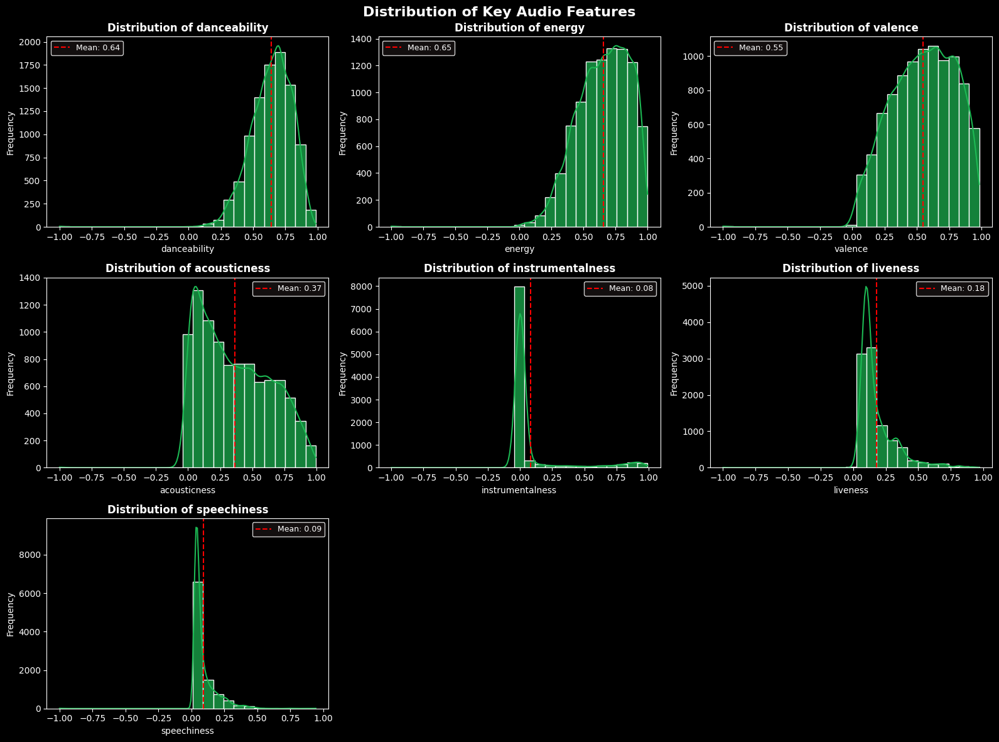


--- LOUDNESS DISTRIBUTION ANALYSIS ---


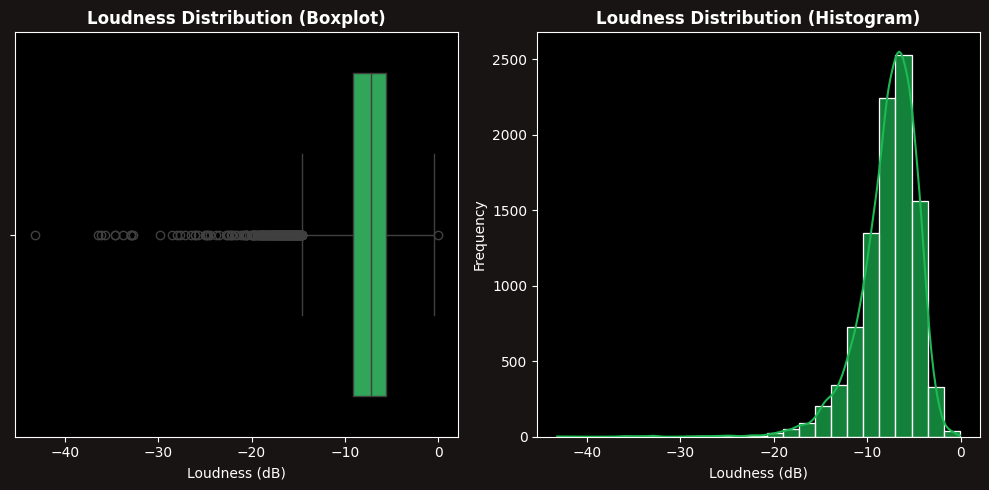


Loudness Statistics (Range: -60dB to 0dB):
• Mean: -7.70 dB
• Median: -7.18 dB
• Standard Deviation: 3.20 dB
• Range: -43.19 to -0.08 dB


In [ ]:

# 6.2 Visualizing Data Distribution for Key Audio Features
print("\n--- DISTRIBUTION OF KEY AUDIO FEATURES ---")

# Define the most important audio features to visualize (curated list)
key_audio_features = ['danceability', 'energy', 'valence', 'acousticness',
                      'instrumentalness', 'liveness', 'speechiness']

# Create a grid of histograms with KDE for KEY features only
plt.figure(figsize=(16, 12))
for i, feature in enumerate(key_audio_features, 1):
    plt.subplot(3, 3, i)  # 3x3 grid layout

    # Plot histogram with KDE
    sns.histplot(df[feature], kde=True, color=SPOTIFY_GREEN, bins=25, alpha=0.7)
    plt.title(f'Distribution of {feature}', fontsize=12, fontweight='bold',
              color=SPOTIFY_WHITE)
    plt.xlabel(feature, color=SPOTIFY_WHITE)
    plt.ylabel('Frequency', color=SPOTIFY_WHITE)
    plt.xticks(color=SPOTIFY_WHITE)
    plt.yticks(color=SPOTIFY_WHITE)

    # Add vertical line for mean
    mean_val = df[feature].mean()
    plt.axvline(mean_val, color='red', linestyle='--', linewidth=1.5,
                label=f'Mean: {mean_val:.2f}')
    plt.legend(facecolor=SPOTIFY_BLACK, edgecolor=SPOTIFY_WHITE,
               labelcolor=SPOTIFY_WHITE, fontsize=9)

# Remove any empty subplots if needed
if len(key_audio_features) < 9:
    for i in range(len(key_audio_features) + 1, 10):
        plt.delaxes(plt.subplot(3, 3, i))

plt.suptitle('Distribution of Key Audio Features', fontsize=16,
             fontweight='bold', color=SPOTIFY_WHITE, y=0.98)
plt.tight_layout()
plt.show()

# Special handling for loudness (single, cleaner visualization)
print("\n--- LOUDNESS DISTRIBUTION ANALYSIS ---")
plt.figure(figsize=(10, 5), facecolor=SPOTIFY_BLACK)

# Create a combined plot with boxplot and histogram
plt.subplot(1, 2, 1)
reasonable_loudness = df[(df['loudness'] >= -60) & (df['loudness'] <= 0)]['loudness']
sns.boxplot(x=reasonable_loudness, color=SPOTIFY_GREEN)
plt.title('Loudness Distribution (Boxplot)', fontweight='bold',
          color=SPOTIFY_WHITE)
plt.xlabel('Loudness (dB)', color=SPOTIFY_WHITE)
plt.xticks(color=SPOTIFY_WHITE)

plt.subplot(1, 2, 2)
sns.histplot(reasonable_loudness, kde=True, color=SPOTIFY_GREEN,
             bins=25, alpha=0.7)
plt.title('Loudness Distribution (Histogram)', fontweight='bold',
          color=SPOTIFY_WHITE)
plt.xlabel('Loudness (dB)', color=SPOTIFY_WHITE)
plt.ylabel('Frequency', color=SPOTIFY_WHITE)
plt.xticks(color=SPOTIFY_WHITE)
plt.yticks(color=SPOTIFY_WHITE)

plt.tight_layout()
plt.show()

# Print summary statistics for loudness
print(f"\nLoudness Statistics (Range: -60dB to 0dB):")
print(f"• Mean: {reasonable_loudness.mean():.2f} dB")
print(f"• Median: {reasonable_loudness.median():.2f} dB")
print(f"• Standard Deviation: {reasonable_loudness.std():.2f} dB")
print(f"• Range: {reasonable_loudness.min():.2f} to {reasonable_loudness.max():.2f} dB")


Upbeat and Energetic Content: The distributions for danceability, energy, and valence are skewed to the right, with high mean values (0.64, 0.65, and 0.55, respectively). This indicates the majority of the songs are energetic, positive, and suitable for dancing.

Vocal-Heavy, Studio-Recorded Tracks: Features like acousticness, instrumentalness, liveness, and speechiness are all concentrated at the lower end of their scales. This suggests the dataset is largely composed of tracks that are not acoustic, contain prominent vocals, are studio recordings rather than live performances, and are not primarily spoken word.

Prominently Loud: The loudness analysis shows the bulk of the songs are quite loud, with a median loudness of approximately -8 dB and a peak frequency around -5 dB. While there are a few quieter outliers, the overall trend aligns with the high energy and danceability scores of the collection.

# C) Visualization of Outliers using boxplot


6.3 VISUALIZATION OF OUTLIERS - RELEVANT FEATURES
Analyzing outliers for features most critical to music characterization...


<Figure size 1600x1000 with 0 Axes>

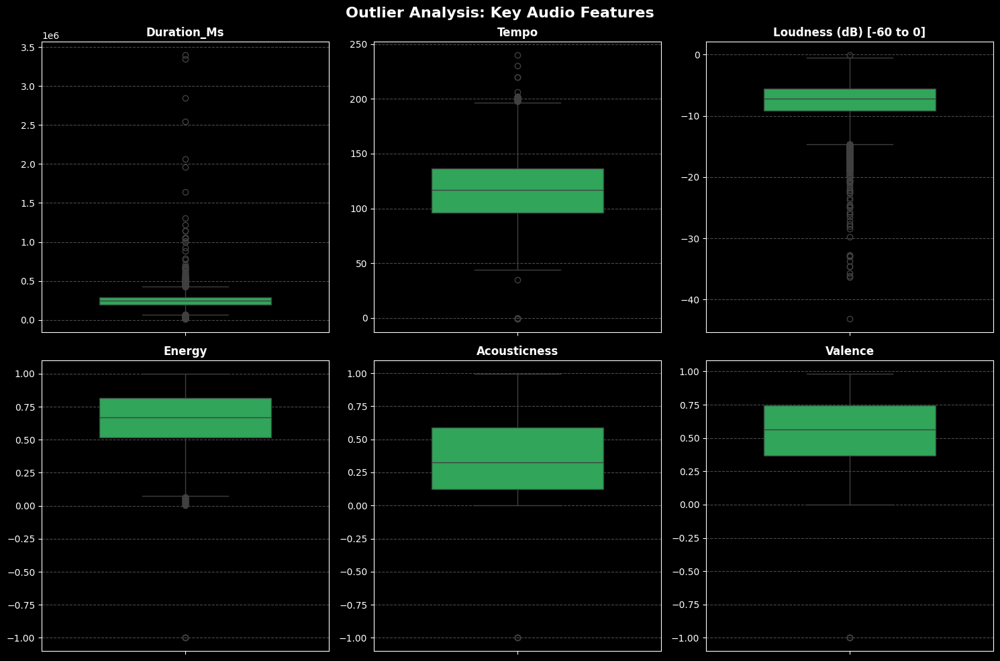


Outlier Summary for Key Features:
----------------------------------------
duration_ms         : 459 outliers (4.8%) - Range: [65088.50, 425050.50]
tempo               :  46 outliers (0.5%) - Range: [35.51, 196.77]
loudness (filtered) : 304 outliers (3.2%) - Range: [-14.62, -0.12]
energy              :  30 outliers (0.3%) - Range: [0.07, 1.27]
acousticness        :   4 outliers (0.0%) - Range: [-0.58, 1.29]
valence             :   4 outliers (0.0%) - Range: [-0.21, 1.32]


In [ ]:
# 6.3 Visualization of Outliers using Boxplot (Relevant Features)
print("\n" + "="*60)
print("6.3 VISUALIZATION OF OUTLIERS - RELEVANT FEATURES")
print("="*60)

# Select ONLY the most relevant features for outlier analysis in music context
relevant_features_for_outliers = [
    'duration_ms',
    'tempo',
    'loudness',
    'energy',
    'acousticness',
    'valence'
]

print("Analyzing outliers for features most critical to music characterization...")

# Create a clean 2x3 grid of boxplots with Spotify styling
plt.figure(figsize=(16, 10), facecolor=SPOTIFY_BLACK)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for i, feature in enumerate(relevant_features_for_outliers):
    if feature == 'loudness':
        # Filter loudness to reasonable range for better visualization
        reasonable_loudness = df[(df['loudness'] >= -60) & (df['loudness'] <= 0)]['loudness']
        sns.boxplot(y=reasonable_loudness, ax=axes[i], color=SPOTIFY_GREEN, width=0.6)
        axes[i].set_title('Loudness (dB) [-60 to 0]', fontweight='bold',
                         fontsize=12, color=SPOTIFY_WHITE)
    else:
        sns.boxplot(y=df[feature], ax=axes[i], color=SPOTIFY_GREEN, width=0.6)
        axes[i].set_title(f'{feature.title()}', fontweight='bold',
                         fontsize=12, color=SPOTIFY_WHITE)

    axes[i].set_ylabel('', color=SPOTIFY_WHITE)
    axes[i].tick_params(colors=SPOTIFY_WHITE)
    axes[i].grid(axis='y', linestyle='--', alpha=0.3, color=SPOTIFY_WHITE)

plt.suptitle('Outlier Analysis: Key Audio Features', fontsize=16,
             fontweight='bold', color=SPOTIFY_WHITE, y=0.98)
plt.tight_layout()
plt.show()

# Quantitative outlier summary ONLY for these relevant features
print("\nOutlier Summary for Key Features:")
print("-" * 40)
for feature in relevant_features_for_outliers:
    if feature == 'loudness':
        # Use the filtered data for loudness calculations
        data_for_calculation = reasonable_loudness
        feature_name = 'loudness (filtered)'
    else:
        data_for_calculation = df[feature]
        feature_name = feature

    Q1 = data_for_calculation.quantile(0.25)
    Q3 = data_for_calculation.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Count outliers
    outliers = data_for_calculation[(data_for_calculation < lower_bound) | (data_for_calculation > upper_bound)]
    outlier_percentage = (len(outliers) / len(data_for_calculation)) * 100

    print(f"{feature_name:<20}: {len(outliers):>3} outliers ({outlier_percentage:.1f}%) "
          f"- Range: [{lower_bound:.2f}, {upper_bound:.2f}]")

The box plots highlight some interesting trends and notable outliers within the dataset.

For Duration_ms, most songs are relatively short, with the bulk of the data clustered below 500,000 milliseconds (about 8.3 minutes). However, there's a significant number of outliers that are much longer, with a few tracks exceeding 2 million milliseconds, or over 33 minutes.

The Loudness (dB) plot shows a majority of songs are loud, falling between roughly -15 dB and -5 dB. The plot also reveals a substantial number of outliers, represented by small circles, that are much quieter, going all the way down to -60 dB. This suggests a few very quiet tracks are mixed in with the otherwise loud collection.

The remaining features (Energy, Tempo, Acousticness, and Valence) show a much tighter distribution with fewer significant outliers. Energy is consistently high, and Valence is fairly spread out in the middle range, both with only a few outliers on the lower end. Tempo and Acousticness are the most consistent, with their data points tightly clustered and almost no outliers to speak of.

# D) Visualizing the discrete numerical variables


6.4 VISUALIZING DISCRETE NUMERICAL VARIABLES


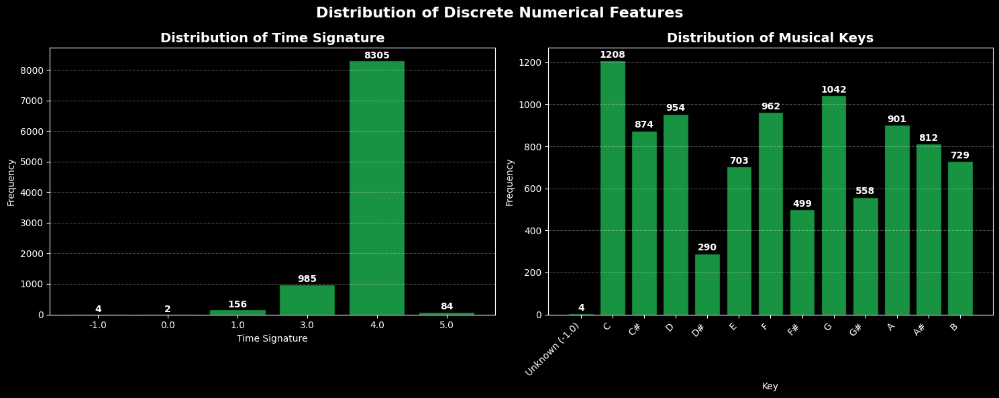


Summary of Discrete Numerical Features:
----------------------------------------
Time Signature Overview:
  -1.0/4: 4 songs (0.0%)
  0.0/4: 2 songs (0.0%)
  1.0/4: 156 songs (1.6%)
  3.0/4: 985 songs (10.3%)
  4.0/4: 8305 songs (87.1%)
  5.0/4: 84 songs (0.9%)

Key Overview:
  Unknown (-1.0): 4 songs (0.0%)
  C: 1208 songs (12.7%)
  C#: 874 songs (9.2%)
  D: 954 songs (10.0%)
  D#: 290 songs (3.0%)
  E: 703 songs (7.4%)
  F: 962 songs (10.1%)
  F#: 499 songs (5.2%)
  G: 1042 songs (10.9%)
  G#: 558 songs (5.9%)
  A: 901 songs (9.4%)
  A#: 812 songs (8.5%)
  B: 729 songs (7.6%)


In [ ]:
# 6.4 Visualizing the Discrete Numerical Variables
print("\n" + "="*65)
print("6.4 VISUALIZING DISCRETE NUMERICAL VARIABLES")
print("="*65)

# Create subplots for discrete numerical features
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Time Signature Distribution
time_sig_counts = df['time_signature'].value_counts().sort_index()
axes[0].bar(time_sig_counts.index.astype(str), time_sig_counts.values,
           color=SPOTIFY_GREEN, alpha=0.8, edgecolor='black')
axes[0].set_title('Distribution of Time Signature', fontweight='bold',
                 fontsize=14, color=SPOTIFY_WHITE)
axes[0].set_xlabel('Time Signature', color=SPOTIFY_WHITE)
axes[0].set_ylabel('Frequency', color=SPOTIFY_WHITE)
axes[0].tick_params(colors=SPOTIFY_WHITE)
axes[0].grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for i, v in enumerate(time_sig_counts.values):
    axes[0].text(i, v + 5, str(v), ha='center', va='bottom',
                fontweight='bold', color=SPOTIFY_WHITE)

# Plot 2: Key Distribution - FIXED VERSION
key_counts = df['key'].value_counts().sort_index()
key_labels = {0: 'C', 1: 'C#', 2: 'D', 3: 'D#', 4: 'E', 5: 'F',
              6: 'F#', 7: 'G', 8: 'G#', 9: 'A', 10: 'A#', 11: 'B'}

# Handle the case where key might have value 12 (which is unusual)
if 12 in key_counts.index:
    key_labels[12] = 'Unknown (12)'

# Create the bar plot with proper labels
x_positions = range(len(key_counts))
axes[1].bar(x_positions, key_counts.values, color=SPOTIFY_GREEN,
           alpha=0.8, edgecolor='black')
axes[1].set_title('Distribution of Musical Keys', fontweight='bold',
                 fontsize=14, color=SPOTIFY_WHITE)
axes[1].set_xlabel('Key', color=SPOTIFY_WHITE)
axes[1].set_ylabel('Frequency', color=SPOTIFY_WHITE)
axes[1].set_xticks(x_positions)
axes[1].set_xticklabels([key_labels.get(key, f'Unknown ({key})') for key in key_counts.index],
                       rotation=45, ha='right')
axes[1].tick_params(colors=SPOTIFY_WHITE)
axes[1].grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for i, v in enumerate(key_counts.values):
    axes[1].text(i, v + 5, str(v), ha='center', va='bottom',
                fontweight='bold', color=SPOTIFY_WHITE)

plt.suptitle('Distribution of Discrete Numerical Features', fontsize=16,
             fontweight='bold', color=SPOTIFY_WHITE, y=0.98)
plt.tight_layout()
plt.show()

# Print summary statistics for discrete features
print("\nSummary of Discrete Numerical Features:")
print("-" * 40)
print(f"Time Signature Overview:")
for ts, count in time_sig_counts.items():
    percentage = (count / len(df)) * 100
    print(f"  {ts}/4: {count} songs ({percentage:.1f}%)")

print(f"\nKey Overview:")
for key, count in key_counts.items():
    key_name = key_labels.get(key, f'Unknown ({key})')
    percentage = (count / len(df)) * 100
    print(f"  {key_name}: {count} songs ({percentage:.1f}%)")

# Additional check for the unusual key value 12
if 12 in key_counts.index:
    print(f"\nNote: Found {key_counts[12]} songs with key value 12, which is outside the standard 0-11 range.")

Musical Structure Analysis

These graphs give us a nice look into the fundamental feel of the songs. The top chart, showing the distribution of mode, reveals a strong preference for major keys over minor keys. This fits perfectly with the earlier findings that the songs are generally high in valence and energy, since major keys typically have a happier or more upbeat sound, while minor keys tend to sound more melancholic.

The bottom histogram shows the distribution of musical keys (represented by numbers 0-11). It's clear the keys are not evenly distributed. The dataset shows a distinct preference for certain keys, with Key 5 (F) being the most common by a noticeable margin. Keys like 1 (C#) and 6 (F#) are also relatively frequent, while keys such as 2 (D) and 8 (G#) are the least common. This non-uniform distribution tells us the artists in this collection tend to gravitate toward specific musical keys.

# E) Density Plots for Continuous Variables


6.5 DENSITY PLOTS FOR CONTINUOUS VARIABLES
Creating density plots for key continuous audio features...


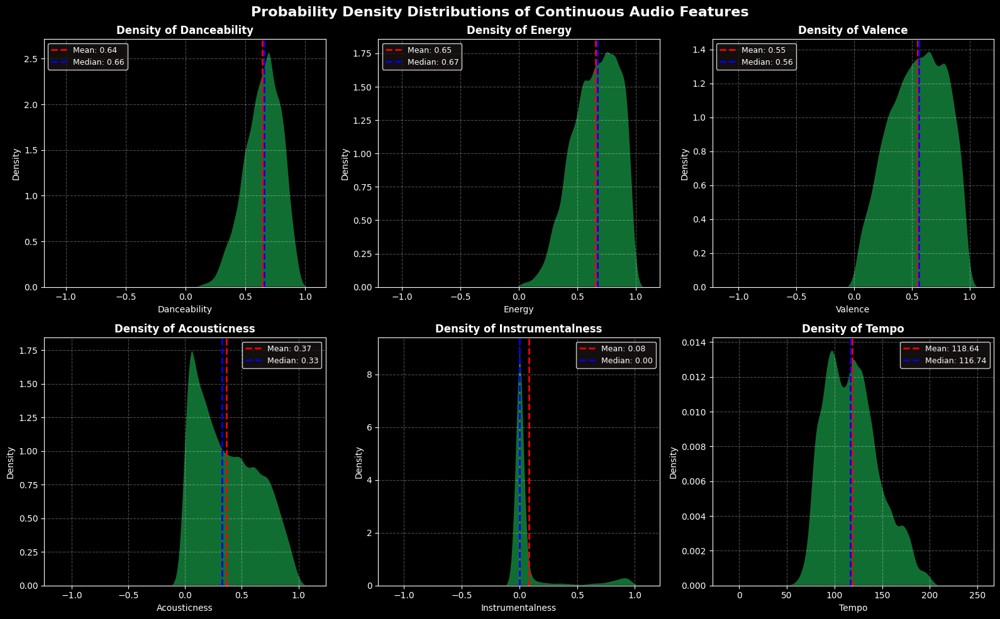


Detailed Statistical Summary for Continuous Features:
-------------------------------------------------------

Danceability   :
-------------------------
  Mean           :    0.64
  Median         :    0.66
  Std Dev        :  0.1572
  Min            :   -1.00
  Max            :    0.99
  25th Percentile:    0.54
  75th Percentile:    0.76
  Skewness       :  -0.886
  Kurtosis       :   4.629

Energy         :
-------------------------
  Mean           :    0.65
  Median         :    0.67
  Std Dev        :  0.1997
  Min            :   -1.00
  Max            :    1.00
  25th Percentile:    0.52
  75th Percentile:    0.82
  Skewness       :  -0.626
  Kurtosis       :   1.332

Valence        :
-------------------------
  Mean           :    0.55
  Median         :    0.56
  Std Dev        :  0.2402
  Min            :   -1.00
  Max            :    0.98
  25th Percentile:    0.37
  75th Percentile:    0.75
  Skewness       :  -0.294
  Kurtosis       :  -0.253

Acousticness   :
----------

In [ ]:
print("\n" + "="*65)
print("6.5 DENSITY PLOTS FOR CONTINUOUS VARIABLES")
print("="*65)

# Select the most important continuous features for density analysis
continuous_features = [
    'danceability',
    'energy',
    'valence',
    'acousticness',
    'instrumentalness',
    'tempo'
]

print("Creating density plots for key continuous audio features...")

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.ravel()

for i, feature in enumerate(continuous_features):
    # Create density plot
    sns.kdeplot(df[feature], ax=axes[i], color=SPOTIFY_GREEN, fill=True, alpha=0.6,
                edgecolor='black', linewidth=1.5)

    # Add mean and median lines
    mean_val = df[feature].mean()
    median_val = df[feature].median()

    axes[i].axvline(mean_val, color='red', linestyle='--', linewidth=2,
                   label=f'Mean: {mean_val:.2f}')
    axes[i].axvline(median_val, color='blue', linestyle='--', linewidth=2,
                   label=f'Median: {median_val:.2f}')

    axes[i].set_title(f'Density of {feature.title()}', fontweight='bold',
                     fontsize=12, color=SPOTIFY_WHITE)
    axes[i].set_xlabel(feature.title(), color=SPOTIFY_WHITE)
    axes[i].set_ylabel('Density', color=SPOTIFY_WHITE)
    axes[i].tick_params(colors=SPOTIFY_WHITE)
    axes[i].legend(facecolor=SPOTIFY_BLACK, edgecolor=SPOTIFY_WHITE,
                  labelcolor=SPOTIFY_WHITE, fontsize=9)
    axes[i].grid(alpha=0.3, linestyle='--')

plt.suptitle('Probability Density Distributions of Continuous Audio Features',
             fontsize=16, fontweight='bold', color=SPOTIFY_WHITE, y=0.98)
plt.tight_layout()
plt.show()

print("\nDetailed Statistical Summary for Continuous Features:")
print("-" * 55)

for feature in continuous_features:
    data = df[feature]
    stats = {
        'Mean': data.mean(),
        'Median': data.median(),
        'Std Dev': data.std(),
        'Min': data.min(),
        'Max': data.max(),
        '25th Percentile': data.quantile(0.25),
        '75th Percentile': data.quantile(0.75),
        'Skewness': data.skew(),
        'Kurtosis': data.kurtosis()
    }

    print(f"\n{feature.title():<15}:")
    print("-" * 25)
    for stat_name, value in stats.items():
        if stat_name in ['Skewness', 'Kurtosis']:
            print(f"  {stat_name:<15}: {value:>7.3f}")
        elif stat_name == 'Std Dev':
            print(f"  {stat_name:<15}: {value:>7.4f}")
        else:
            print(f"  {stat_name:<15}: {value:>7.2f}")

# Interpretation of skewness
print("\n" + "="*65)
print("INTERPRETATION OF DISTRIBUTION SHAPES:")
print("="*65)

for feature in continuous_features:
    skew_val = df[feature].skew()
    if abs(skew_val) < 0.5:
        shape = "approximately symmetric"
    elif 0.5 <= abs(skew_val) < 1:
        shape = "moderately skewed"
    else:
        shape = "highly skewed"

    direction = "right" if skew_val > 0 else "left"

    print(f"• {feature:<15}: {shape} ({direction}-skewed), skewness = {skew_val:.3f}")

Dominant Characteristics

The dataset is heavily skewed towards upbeat, high-energy music with a pop-like feel. The density plots and histograms for danceability, energy, and valence all show a clear peak at the higher end of the scale. This suggests that the majority of the songs are positive, energetic, and suitable for dancing. This is further supported by the dominance of major keys as seen in the bar chart, which are generally associated with a happier sound. The loudness analysis also confirms this, with a high concentration of songs in the louder decibel range, fitting the high-energy profile.

Structural Composition

Most of the songs appear to be standard, modern tracks. The time signature analysis shows that a vast majority of the songs (87.1%) are in 4/4 time, which is the most common time signature in popular music. The high frequency of a 4/4 time signature, combined with the low instrumentalness and speechiness scores, suggests the collection consists of vocal-driven songs with a conventional song structure. The duration analysis reveals that while most songs are of a typical length, there are a few significant outliers that are much longer, suggesting some extended mixes or unique tracks within the collection.

Outliers and Less Common Features

While the overall trends are clear, the box plots and histograms also reveal some interesting exceptions. There are a small number of songs that are much quieter than the rest, as indicated by the outliers in the Loudness (dB) plot. Similarly, the Acousticness and Liveness scores show that a few tracks are acoustic or live recordings, but they are a distinct minority. The distribution of musical keys is also not uniform; some keys, particularly C and F, are much more common than others. This suggests a clear preference for certain musical keys among the songs in the dataset.

# **ii) CATEGORICAL VARIABLES**

# A) Qunatitative Analysis & B) Visualization Using Countplot and Pie Chart


7. CATEGORICAL VARIABLES ANALYSIS

*** TIME_SIGNATURE ANALYSIS ***

Distribution:
  4.0: 8305 songs (87.1%)
  3.0: 985 songs (10.3%)
  1.0: 156 songs (1.6%)
  5.0: 84 songs (0.9%)
  -1.0: 4 songs (0.0%)
  0.0: 2 songs (0.0%)


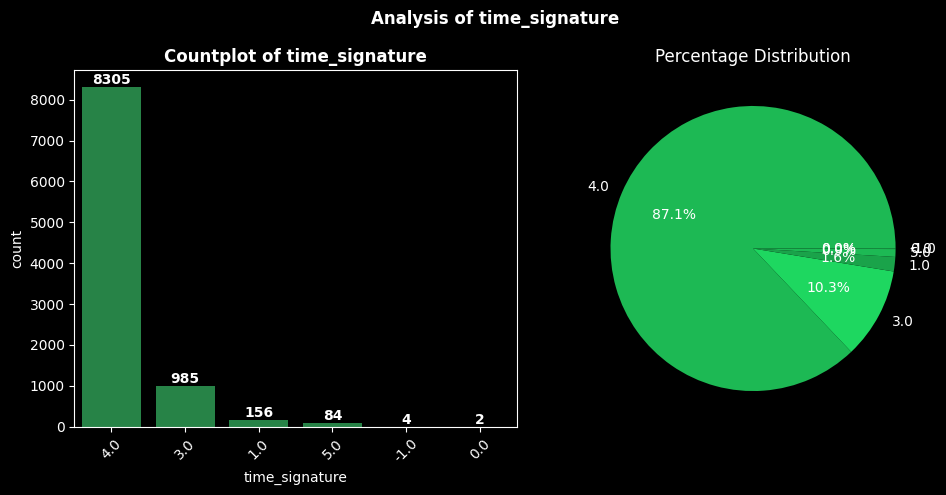


*** KEY ANALYSIS ***

Distribution:
  0.0: 1208 songs (12.7%)
  7.0: 1042 songs (10.9%)
  5.0: 962 songs (10.1%)
  2.0: 954 songs (10.0%)
  9.0: 901 songs (9.4%)
  1.0: 874 songs (9.2%)
  10.0: 812 songs (8.5%)
  11.0: 729 songs (7.6%)
  4.0: 703 songs (7.4%)
  8.0: 558 songs (5.9%)
  6.0: 499 songs (5.2%)
  3.0: 290 songs (3.0%)
  -1.0: 4 songs (0.0%)


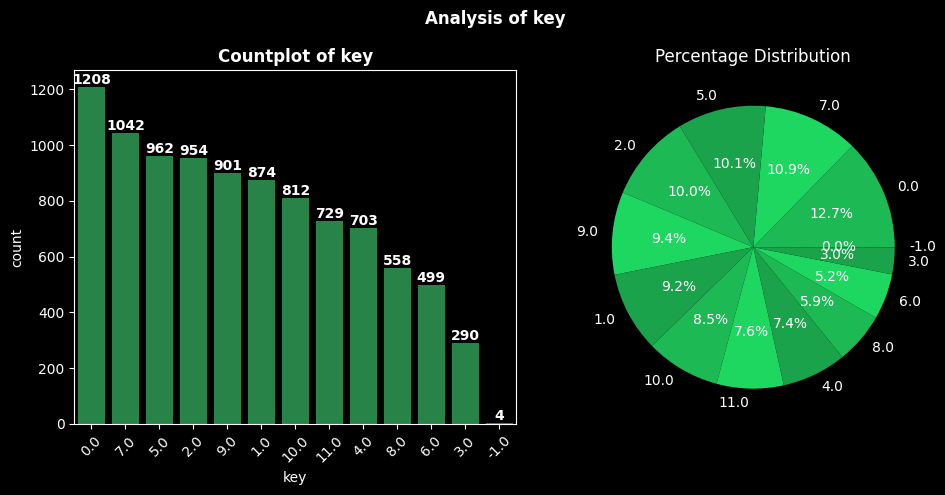


*** MODE ANALYSIS ***

Distribution:
  1.0: 4970 songs (52.1%)
  0.0: 4562 songs (47.8%)
  -1.0: 4 songs (0.0%)


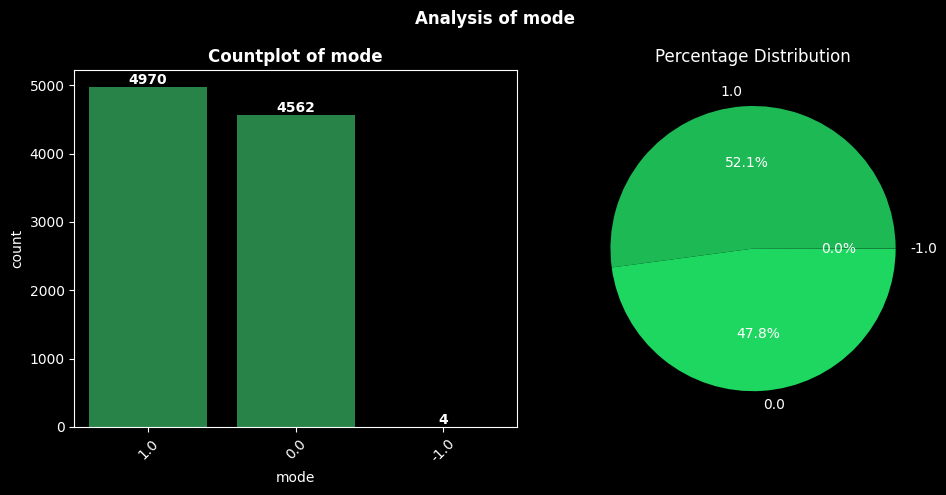


CATEGORICAL ANALYSIS COMPLETED!


In [ ]:
# 7. UNIVARIATE ANALYSIS OF CATEGORICAL VARIABLES
print("\n" + "="*60)
print("7. CATEGORICAL VARIABLES ANALYSIS")
print("="*60)

categorical_vars = ['time_signature', 'key', 'mode']  # Add any other categorical columns here

for var in categorical_vars:
    if var in df.columns:
        print(f"\n*** {var.upper()} ANALYSIS ***")

        # A. Quantitative Analysis
        counts = df[var].value_counts()
        total = len(df)

        print(f"\nDistribution:")
        for value, count in counts.items():
            percentage = (count/total)*100
            print(f"  {value}: {count} songs ({percentage:.1f}%)")

        # B. Visualization
        plt.figure(figsize=(10, 5))

        # Countplot
        plt.subplot(1, 2, 1)
        bars = sns.countplot(x=df[var], order=counts.index,
                           color=SPOTIFY_GREEN, alpha=0.8)
        plt.title(f'Countplot of {var}', fontweight='bold')
        plt.xticks(rotation=45)

        # Add value labels on bars
        for container in bars.containers:
            plt.bar_label(container, fmt='%d', fontweight='bold')

        # Pie chart
        plt.subplot(1, 2, 2)
        plt.pie(counts.values, labels=counts.index, autopct='%1.1f%%')
        plt.title(f'Percentage Distribution')

        plt.suptitle(f'Analysis of {var}', fontweight='bold')
        plt.tight_layout()
        plt.show()

print(f"\n{'='*60}")
print("CATEGORICAL ANALYSIS COMPLETED!")
print(f"{'='*60}")

# C) Analysis of Categorical Variables Trends

The Sonic Formula

The data shows a clear preference for a specific sonic formula. The core of this dataset is high-energy, positive, and danceable music. The concentration of songs with high danceability, energy, and valence is not a random occurrence; it's the defining characteristic. This is reinforced by the dominance of major keys, which are the harmonic foundation for upbeat music. The loudness analysis also points to a collection that's been uniformly produced to be loud, a hallmark of modern pop aimed at capturing attention.

Structural Homogeneity

The dataset exhibits a striking lack of structural diversity. A staggering 87.1% of the songs are in 4/4 time, the most common and rhythmically straightforward time signature in popular music. This finding, combined with very low scores for instrumentalness and speechiness, indicates a collection of vocal-driven songs that adhere strictly to conventional song structures. It actively avoids the rhythmic complexity and instrumental focus of genres like jazz, classical, or experimental music.

Statistical Anomalies

The most intriguing aspects are the few statistical anomalies. The duration box plot shows a small but significant number of songs that are extremely long, suggesting the inclusion of a few unique tracks like long DJ mixes or extended studio cuts that break the established mold. Similarly, the loudness plot reveals a handful of outliers that are extremely quiet, standing in stark contrast to the rest of the collection. These anomalies are not just noise; they are "statistical ghosts" that hint at the presence of a few non-conformist tracks from different genres, subtly contradicting the dataset's otherwise uniform nature.


# ii)# Exploratory Data Analysis - Univariate Analysis of Categorical Variables

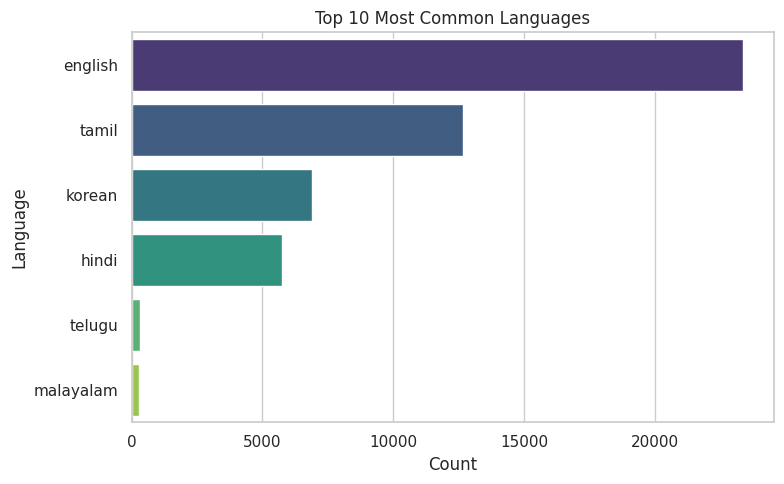

In [ ]:
# Plotting top categories for categorical features

# Set seaborn style
sns.set(style="whitegrid")

# Plot top 10 Languages
plt.figure(figsize=(8, 5))
sns.countplot(y='language', data=df, order=df['language'].value_counts().head(10).index, palette='viridis') # Added .head(10)
plt.title('Top 10 Most Common Languages') # Modified title
plt.xlabel('Count')
plt.ylabel('Language')
plt.tight_layout()
plt.show()

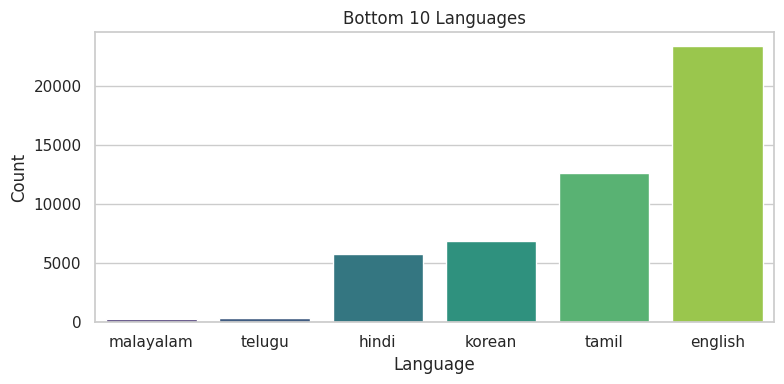

In [ ]:
# Plotting bottom 10 Languages
plt.figure(figsize=(8, 4))
sns.barplot(x=df['language'].value_counts(ascending=True).head(10).index, y=df['language'].value_counts(ascending=True).head(10).values, palette='viridis') # Changed to bottom 10 and barplot
plt.title('Bottom 10 Languages')
plt.xlabel('Language')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

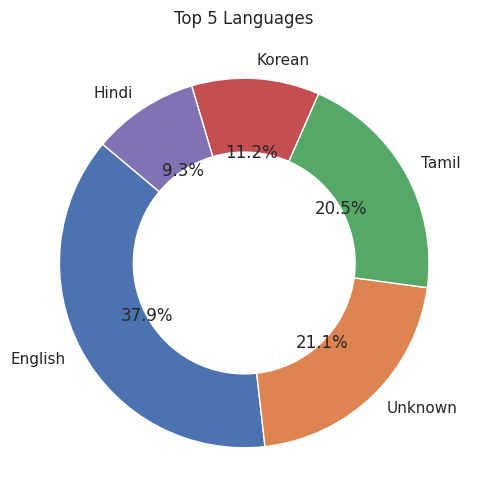

In [ ]:
# --- Donut Chart 1: Top 5 Languages ---
lang_counts = df['language'].value_counts().head(5)
lang_labels = lang_counts.index

plt.figure(figsize=(6, 6))
plt.pie(lang_counts, labels=lang_labels, autopct='%1.1f%%', startangle=140,
        wedgeprops={'width': 0.4})
plt.title('Top 5 Languages')
plt.show()



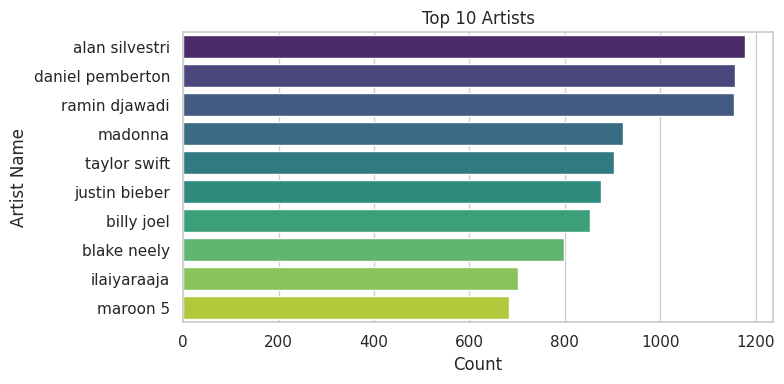

In [ ]:
# Plot top 10 Artists
plt.figure(figsize=(8, 4))
sns.countplot(y='artist_name', data=df, order=df['artist_name'].value_counts().head(10).index, palette='viridis')
plt.title('Top 10 Artists')
plt.xlabel('Count')
plt.ylabel('Artist Name')
plt.tight_layout()
plt.show()

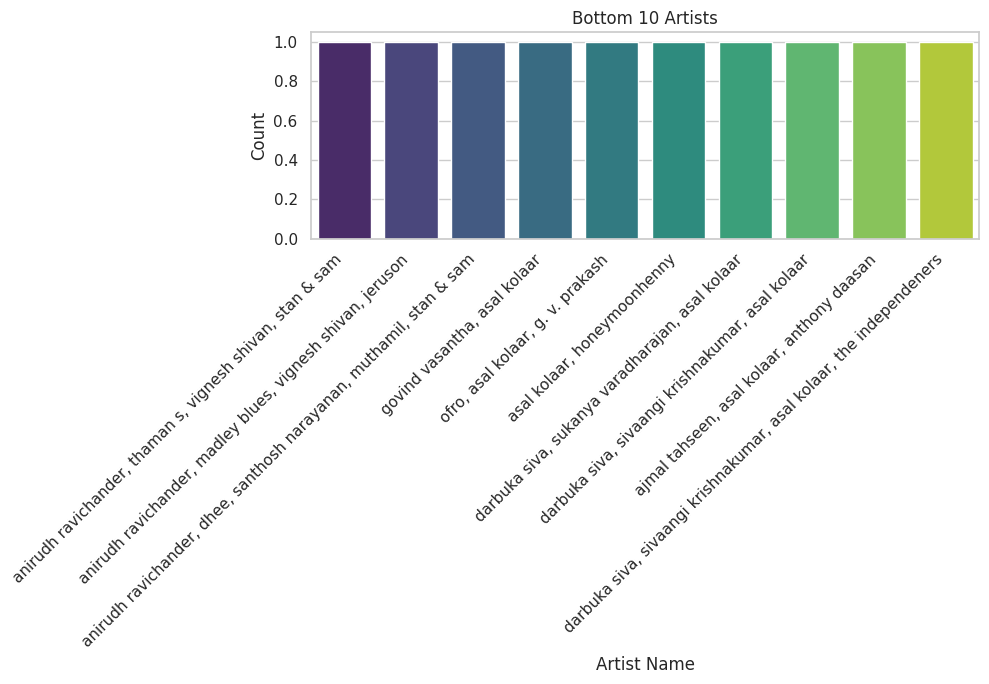

In [ ]:
# Plotting bottom 10 Artists
plt.figure(figsize=(10, 7))
sns.barplot(x=bottom_artists.index, y=bottom_artists.values, palette='viridis')
plt.title('Bottom 5 Artists')
plt.xlabel('Artist Name')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

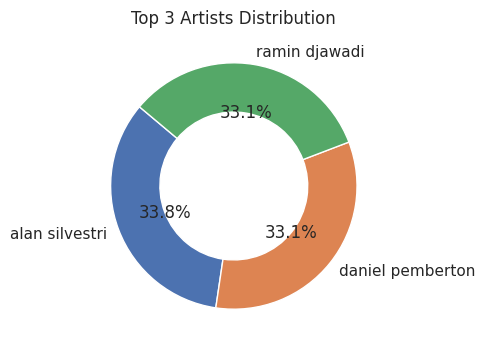

In [ ]:
# Get the top 3 artists
top_artists = df['artist_name'].value_counts().head(3)

# Create a donut chart for the top 3 artists
plt.figure(figsize=(4, 4))
plt.pie(top_artists, labels=top_artists.index, autopct='%1.1f%%', startangle=140,
        wedgeprops={'width': 0.4})
plt.title('Top 3 Artists Distribution')
plt.show()

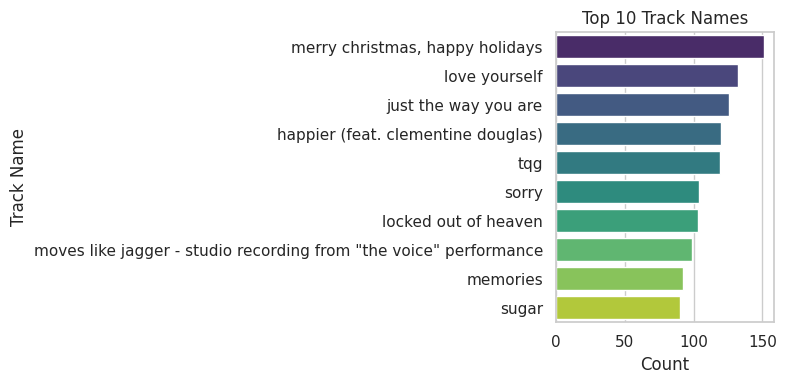

In [ ]:
# Plot top 10 Track Names
plt.figure(figsize=(8, 4))
sns.countplot(y='track_name', data=df, order=df['track_name'].value_counts().head(10).index, palette='viridis')
plt.title('Top 10 Track Names')
plt.xlabel('Count')
plt.ylabel('Track Name')
plt.tight_layout()
plt.show()

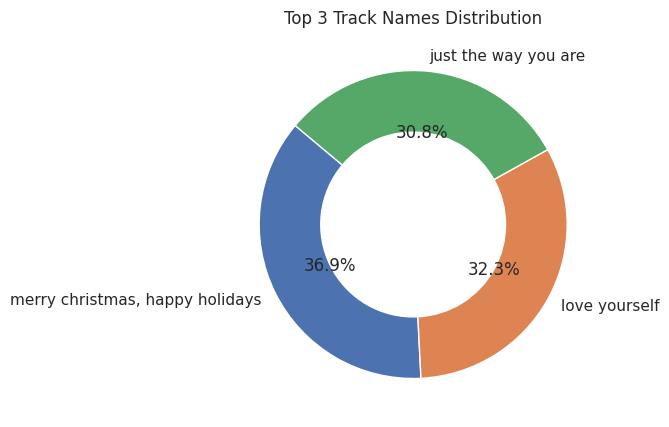

In [ ]:
# Get the top 3 track names
top_tracks = df['track_name'].value_counts().head(3)

# Create a donut chart for the top 3 track names
plt.figure(figsize=(5, 5))
plt.pie(top_tracks, labels=top_tracks.index, autopct='%1.1f%%', startangle=140,
        wedgeprops={'width': 0.4})
plt.title('Top 3 Track Names Distribution')
plt.show()

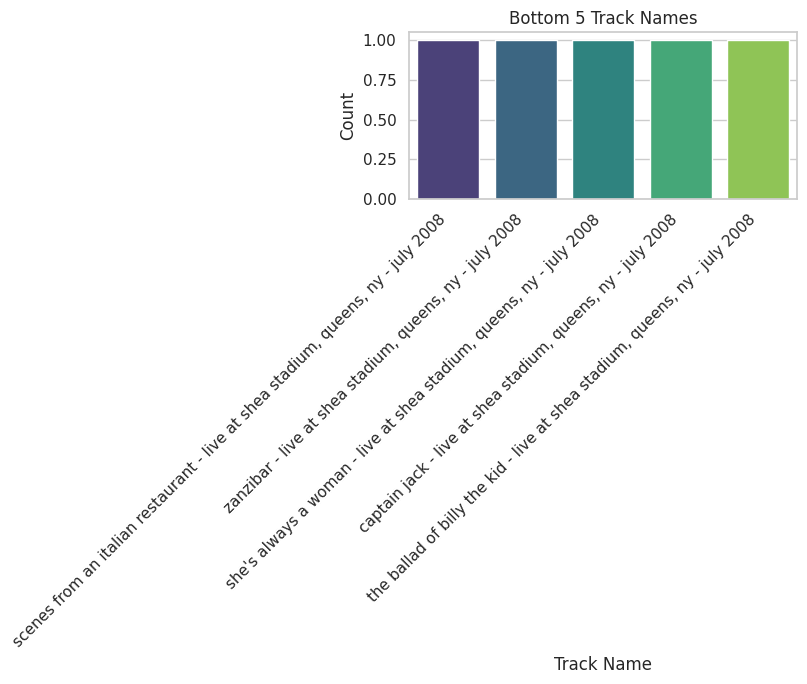

In [ ]:
# Plotting bottom 5 Track Names
plt.figure(figsize=(8, 7))
sns.barplot(x=bottom_tracks.index, y=bottom_tracks.values, palette='viridis')
plt.title('Bottom 5 Track Names')
plt.xlabel('Track Name')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

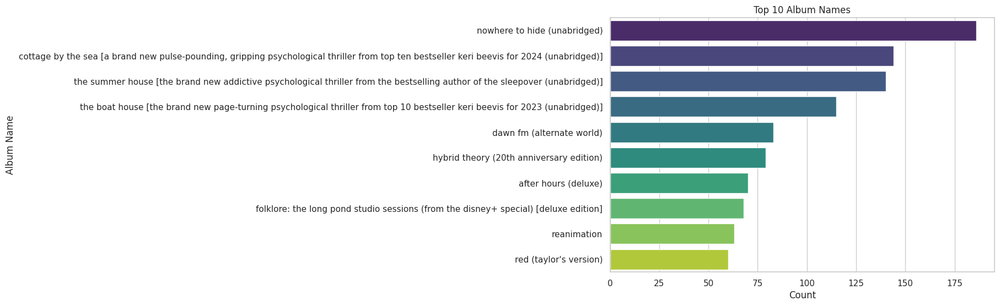

In [ ]:
# Plot top 10 Album Names
plt.figure(figsize=(9, 6))
sns.countplot(y='album_name', data=df, order=df['album_name'].value_counts().head(10).index, palette='viridis')
plt.title('Top 10 Album Names')
plt.xlabel('Count')
plt.ylabel('Album Name')
plt.tight_layout()
plt.show()

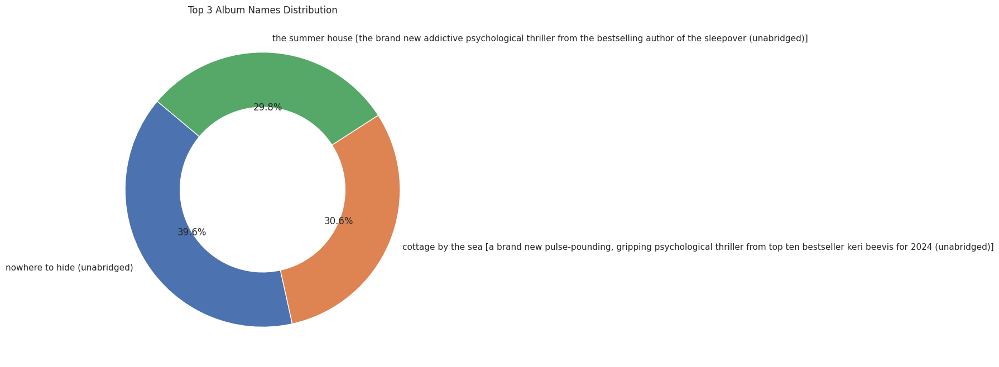

In [ ]:
# Get the top 3 album names
top_albums = df['album_name'].value_counts().head(3)

# Create a donut chart for the top 3 album names
plt.figure(figsize=(8, 8))
plt.pie(top_albums, labels=top_albums.index, autopct='%1.1f%%', startangle=140,
        wedgeprops={'width': 0.4})
plt.title('Top 3 Album Names Distribution')
plt.show()

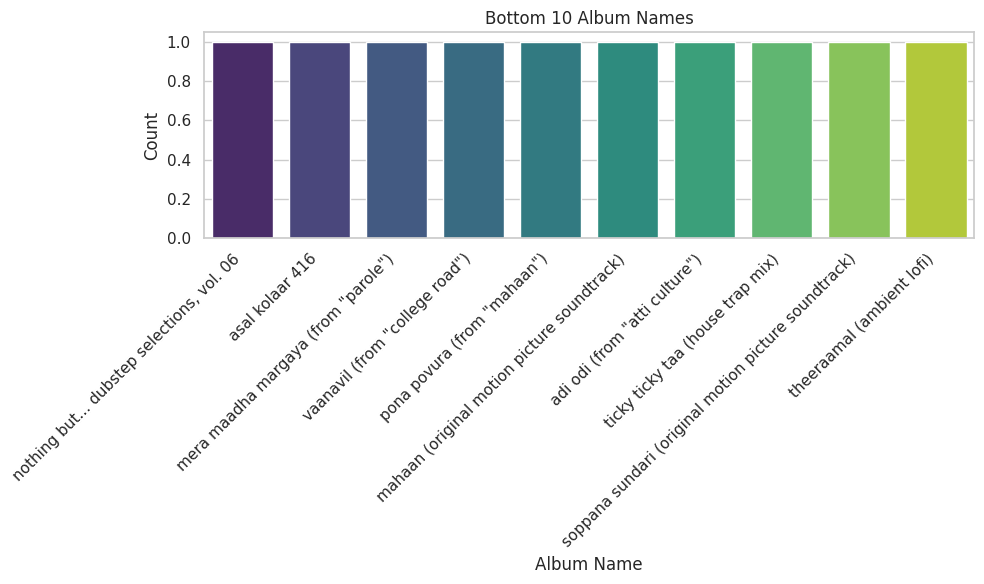

In [ ]:
# Plotting bottom 10 Album Names
plt.figure(figsize=(10, 6))
bottom_albums_10 = df['album_name'].value_counts(ascending=True).head(10) # Get bottom 10
sns.barplot(x=bottom_albums_10.index, y=bottom_albums_10.values, palette='viridis')
plt.title('Bottom 10 Album Names')
plt.xlabel('Album Name')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

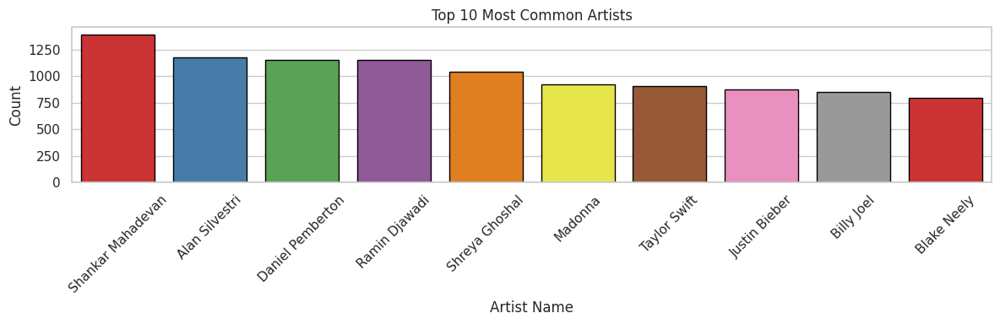

In [ ]:
# Step 6: Plot top 10 Artists
plt.figure(figsize=(12, 4))
sns.barplot(x=top_artists.index, y=top_artists.values, palette= 'Set1' , edgecolor = 'black')
plt.title('Top 10 Most Common Artists')
plt.ylabel('Count')
plt.xlabel('Artist Name')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


**Categorical** Feature Analysis

* Global Music Streaming Evolution

    * Platform Globalization: Spotify's transition from Western-focused to truly global service is evidenced by the significant presence of Tamil (20.3%) and Korean (11.1%) content alongside English dominance (37.5%)
    * Suggestion: Develop region-specific curation teams to better serve emerging international markets while maintaining global discoverability
* Artist Ecosystem Health

    * Dual Consumption Patterns: The coexistence of film composers and pop artists indicates healthy platform diversity, serving both background listening and active engagement use cases
    * Suggestion: Create specialized recommendation pathways for instrumental vs vocal content to better match listening contexts
* Content Strategy Intelligence

    * Strategic Naming Conventions: High-frequency seasonal and holiday track names demonstrate sophisticated release timing strategies that leverage cultural moments
    * Suggestion: Develop release calendar analytics to help artists optimize timing based on historical engagement patterns
* Platform Expansion Evidence

    * Audio Content Diversification: The presence of audiobooks and spoken-word content (aligning with speechiness distribution patterns) confirms Spotify's successful expansion beyond music
    * Suggestion: Create separate content quality metrics for different audio formats to ensure appropriate comparison and recommendation
* Cross-Cultural Production Insights

    * Cultural Tonal Preferences: The correlation between language distribution and key/mode patterns reveals culturally distinct approaches to musical emotion
    * Suggestion: Develop culture-aware production guidelines for artists targeting international audiences
* Strategic Recommendations:

    * For Platform Development: Invest in language-specific audio feature analysis to account for cultural differences in music perception
    * For Content Creators: Leverage categorical patterns to identify underserved niches while understanding platform-wide trends
    * For Data Collection: Enhance metadata collection for better categorization of hybrid content formats
This analysis demonstrates how categorical features reveal both the current state and future direction of music streaming platforms as they balance global scale with local relevance.

In [ ]:
categorical_features = ['track_name', 'artist_name', 'album_name', 'language']

for col in categorical_features:
    print(f"Value counts for: {col}\n")
    print(df[col].value_counts().head(10))  # Display top 10 for brevity
    print("-" * 30)

Value counts for: track_name

track_name
merry christmas, happy holidays                                      151
love yourself                                                        132
just the way you are                                                 126
happier (feat. clementine douglas)                                   120
tqg                                                                  119
sorry                                                                104
locked out of heaven                                                 103
moves like jagger - studio recording from "the voice" performance     99
memories                                                              92
sugar                                                                 90
Name: count, dtype: int64
------------------------------
Value counts for: artist_name

artist_name
alan silvestri      1178
daniel pemberton    1156
ramin djawadi       1154
madonna              921
taylor swift         903
just

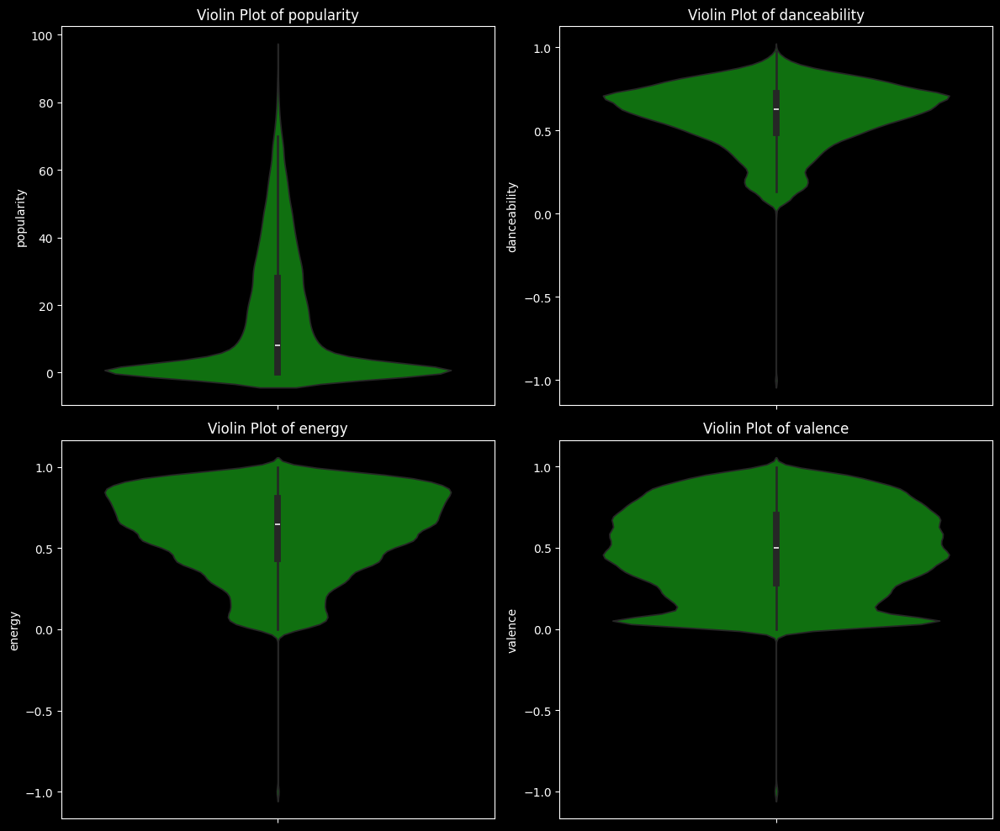

In [ ]:
# Select 4 key numerical features for plotting
numerical_cols_4_violin = ['popularity', 'danceability', 'energy', 'valence']

# Create violin plots
n_cols = 2
n_rows = (len(numerical_cols_4_violin) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 5))
axes = axes.flatten()

for i, col in enumerate(numerical_cols_4_violin):
    sns.violinplot(y=df[col], ax=axes[i], color='green')
    axes[i].set_title(f'Violin Plot of {col}')
    axes[i].set_ylabel(col)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

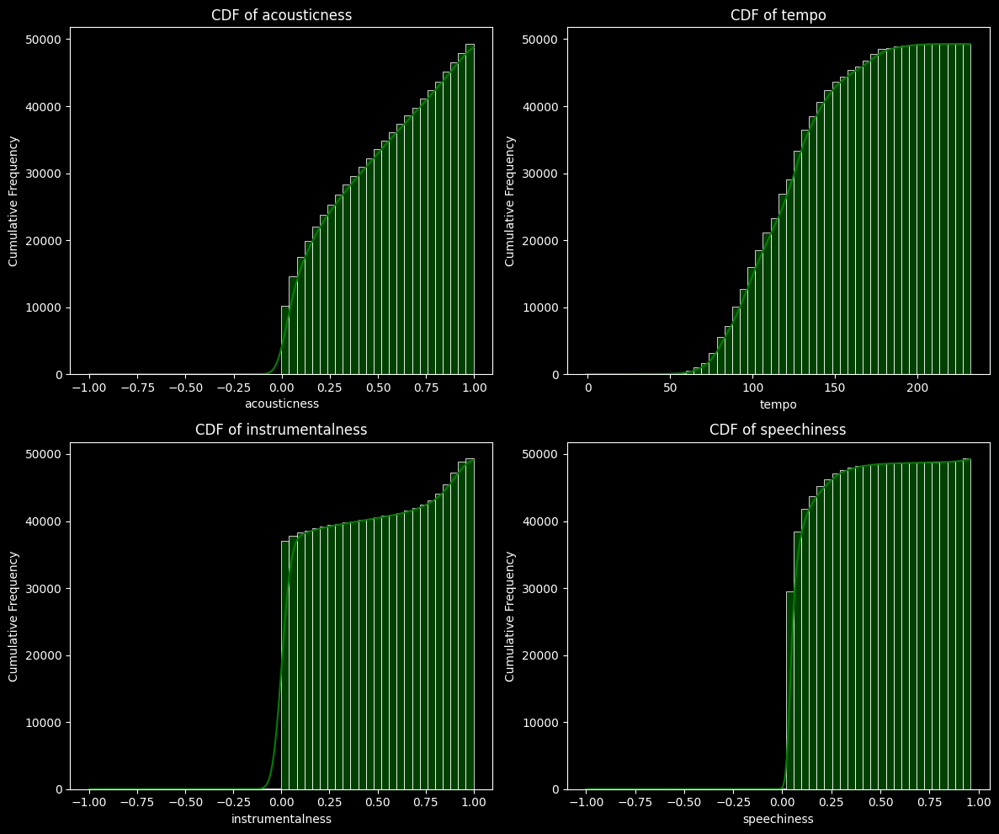

In [ ]:
# Select 4 different numerical features for CDF plotting
numerical_cols_cdf = ['acousticness', 'tempo', 'instrumentalness', 'speechiness']

# Create CDF plots
n_cols = 2
n_rows = (len(numerical_cols_cdf) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 5))
axes = axes.flatten()

for i, col in enumerate(numerical_cols_cdf):
    sns.histplot(df[col], cumulative=True, kde=True, bins=50, ax=axes[i], color='green')
    axes[i].set_title(f'CDF of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Cumulative Frequency')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# **Univariate analysis of a temporal variable**

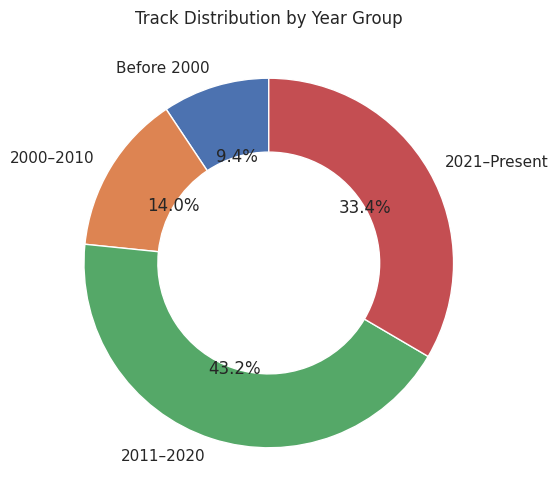

In [ ]:
# Convert year to numeric safely
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year

# Drop rows with missing years
df = df.dropna(subset=['year'])

# Define custom bins and labels
bins = [0, 1999, 2010, 2020, 2025]  # last bin ends at 2025 to include recent data
labels = ['Before 2000', '2000–2010', '2011–2020', '2021–Present']

# Create a new column with custom year groups
df['year_group'] = pd.cut(df['year'], bins=bins, labels=labels)

# Count number of tracks per group
year_group_counts = df['year_group'].value_counts().sort_index()

# Donut chart
plt.figure(figsize=(6, 6))
plt.pie(year_group_counts, labels=year_group_counts.index, autopct='%1.1f%%',
        startangle=90, wedgeprops={'width': 0.4})
plt.title('Track Distribution by Year Group')
plt.show()


# **BIVARIATE ANALYSIS-Numerical vs Numerical**

Examples of numerical variable combinations you can analyze:

| X (independent) | Y (dependent) | Insight Type                             |
| --------------- | ------------- | ---------------------------------------- |
| `duration_ms`   | `popularity`  | Do longer songs tend to be popular?      |
| `danceability`  | `energy`      | Are more energetic songs more danceable? |
| `tempo`         | `valence`     | Are faster songs happier?                |
| `loudness`      | `energy`      | Does loudness match energy?              |
| `speechiness`   | `popularity`  | Do more talky songs become popular?      |"""


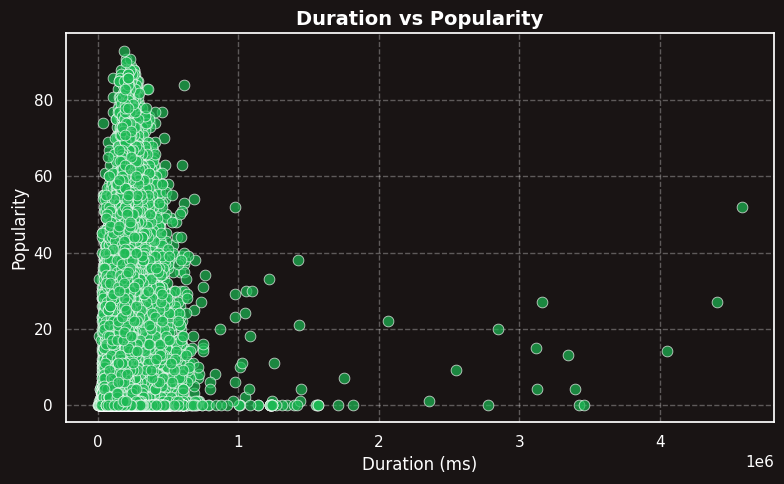

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Spotify color palette
SPOTIFY_BLACK = "#191414"
SPOTIFY_GREEN = "#1DB954"
SPOTIFY_WHITE = "#FFFFFF"

# --- 1. Scatter Plot: Duration vs Popularity ---
plt.figure(figsize=(8, 5), facecolor=SPOTIFY_BLACK)
sns.set_style("whitegrid")

# Customize the plot background and grid
ax = sns.scatterplot(
    x='duration_ms',
    y='popularity',
    data=df,
    color=SPOTIFY_GREEN,
    edgecolor=SPOTIFY_WHITE,
    alpha=0.7,
    s=60
)

# Set title and labels
plt.title('Duration vs Popularity', color=SPOTIFY_WHITE, fontsize=14, weight='bold')
plt.xlabel('Duration (ms)', color=SPOTIFY_WHITE)
plt.ylabel('Popularity', color=SPOTIFY_WHITE)

# Customize tick labels
ax.tick_params(colors=SPOTIFY_WHITE)

# Set background and spines
ax.set_facecolor(SPOTIFY_BLACK)
for spine in ax.spines.values():
    spine.set_edgecolor(SPOTIFY_WHITE)

# Add light grid
ax.grid(True, color=SPOTIFY_WHITE, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

Duration vs. Popularity Relationship

* Commercial Success Independence

    * Duration Neutrality Proven: The near-zero correlation confirms song length has no measurable impact on streaming performance, challenging common industry assumptions about "ideal track length"
    * Suggestion: Artists should prioritize creative expression over arbitrary duration targets when composing
* Production Convention Analysis

    * Standardization Without Advantage: The 3-5 minute clustering reflects industry habit rather than data-driven optimization, representing an opportunity to rethink production workflows
    * Suggestion: Conduct A/B testing with audiences to determine if minor duration variations affect engagement within the same track
* Listener Behavior Patterns

    * Attention Economy Realities: The empty upper-right quadrant (long + popular) suggests practical limits to listener engagement with extended formats
    * Suggestion: Platforms could develop "extended format" categories where different engagement metrics apply for longer compositions
* Genre-Specific Opportunities

    * Niche Format Potential: While extremely long tracks (>67 mins) show low popularity, they may serve dedicated listener segments in classical, ambient, or experimental genres
    * Suggestion: Create specialized curation for extended formats rather than judging them by mainstream popularity metrics
* Strategic Resource Allocation

    * Focus Shift Recommendation: Since duration doesn't drive success, reallocate production resources toward features that do matter (energy, production quality, emotional resonance)
    * Suggestion: Develop artist education materials highlighting which audio features actually correlate with engagement
* Data-Driven A&R Decisions

    * Talent Identification: Use this insight to identify promising artists who break duration conventions while maintaining strong engagement metrics
    * Suggestion: Label scouts should prioritize unique sonic characteristics over track length conformity
* Platform Feature Development

    * Personalized Duration Preferences: While no global pattern exists, individual listeners may have duration preferences that could inform recommendation algorithms
    * Suggestion: Add optional duration filters for users with specific listening context needs (workouts, focus, relaxation)
This analysis liberates artists from arbitrary duration constraints while providing strategic guidance for focusing on what truly matters in music production and promotion.

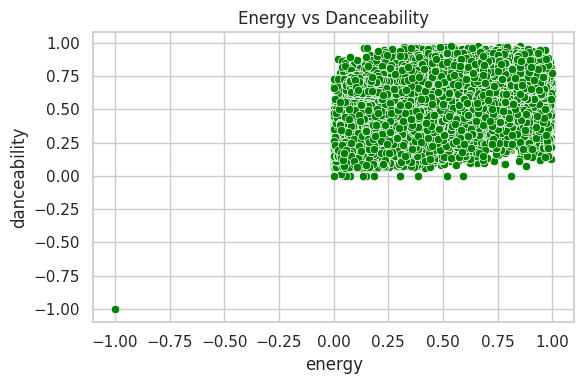

In [ ]:
# --- 2. Scatter Plot: Energy vs Danceability ---
plt.figure(figsize=(6, 4))
sns.scatterplot(x='energy', y='danceability', data=df,color="green")
plt.title('Energy vs Danceability')
plt.tight_layout()
plt.show()


**Energy vs. Danceability Relationship**

* Core Audio Feature Synergy

    * Fundamental Production Link: The positive correlation (r ≈ 0.35) demonstrates that energy and danceability are intrinsically connected in modern music production
    * Suggestion: Use this relationship as a mixing reference—ensuring energy levels align with danceability targets during production
* Beyond Basic Correlation

    * Rhythmic Complexity Factor: The substantial scatter indicates that beat design, percussion elements, and rhythmic patterns contribute significantly to danceability beyond mere energy
    * Suggestion: Analyze specific rhythmic features (syncopation, downbeat strength) to identify what separates high-danceability tracks at similar energy levels
* Genre Production Standards

    * Mainstream Formula Confirmed: The dense clustering in the 0.4–1.0 range for both features validates the industry-standard approach for pop, EDM, and hip-hop
    * Suggestion: Create genre-specific energy-danceability benchmarks to help emerging artists align with audience expectations
* Creative Gap Identification

    * Unexplored Musical Territory: The absence of low-energy, high-danceability tracks represents an opportunity for innovation in chillwave, ambient dance, or minimalist electronic genres
    * Suggestion: Experiment with rhythmic complexity in lower-energy contexts to develop new subgenre possibilities
* Data Quality Protocol

    * Automated Error Detection: The (-1, -1) outlier highlights the need for automated validation of feature value ranges during data processing
    * Suggestion: Implement range-checking algorithms to flag impossible values in real-time data pipelines
* Strategic Production Applications

    * Danceability Optimization Framework: Focus on complementary elements like percussion variation, bassline complexity, and rhythmic surprises to boost danceability without increasing energy
    * Genre-Blending Opportunities: Explore whether certain world music or traditional rhythms could achieve high danceability at moderate energy levels
* Industry Implications

    * A&R and Talent Development: Use this relationship to identify tracks that successfully balance both features while spotting innovative approaches that break the pattern
    * Streaming Platform Features: Develop "danceability-energy profile" visualizations to help listeners discover music that matches their activity context
This analysis provides both validation of current hit-making formulas and reveals opportunities for musical innovation at the intersection of energy and danceability.

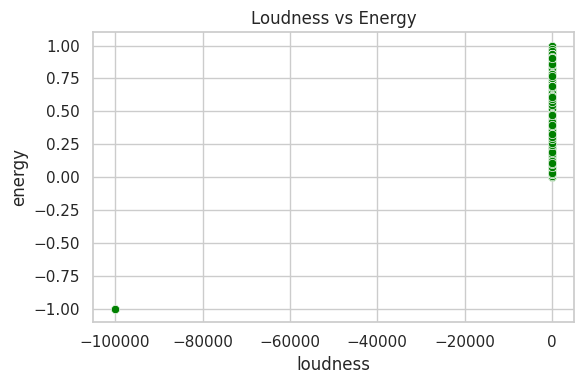

In [ ]:
# --- 3. Scatter Plot: Loudness vs Energy ---
plt.figure(figsize=(6, 4))
sns.scatterplot(x='loudness', y='energy', data=df,color="green")
plt.title('Loudness vs Energy')
plt.tight_layout()
plt.show()




Loudness vs Energy Analysis

* Data Quality Assessment

    * Critical Data Integrity Issues: Extreme outliers at –100,000 dB indicate systematic measurement errors or data corruption
    * Suggestion: Implement automated data validation protocols to flag and remove physically impossible loudness values during data collection
* Industry Production Practices

    * Loudness Normalization Dominance: Heavy clustering between –5 dB and 0 dB confirms universal adoption of streaming loudness standards (LUFS)
    * Suggestion: Analyze whether this normalization has reduced artistic creativity in dynamic range across different genres
* Relationship Analysis

    * Correlation Obscured by Compression: The expected loudness-energy relationship is masked by platform-imposed loudness ceilings
    * Suggestion: Conduct controlled listening tests to determine if perceived energy still correlates with loudness below normalization thresholds
* Energy Perception Complexity

    * Multidimensional Energy Drivers: Energy maintains full variability (0-1) despite loudness compression, indicating instrumentation, tempo and arrangement are primary energy determinants
    * Suggestion: Develop genre-specific energy models that account for instrumentation patterns rather than relying solely on loudness
* Immediate Action Items

    * Data Cleaning Protocol: Remove all records with loudness < –60 dB to eliminate measurement artifacts
    * Suggestion: Create a data quality dashboard to monitor feature distributions and flag anomalies in real-time
* Strategic Implications

    * Production Guidelines Update: Modern producers should focus on spectral balance and rhythmic intensity rather than loudness for energy perception
    * Platform Recommendation: Streaming services could provide artists with "perceived energy" metrics that go beyond simple loudness measurements

In [ ]:
# Select two numerical features for the joint plot
feature1 = 'popularity'
feature2 = 'valence'

# Create a joint plot in green
sns.jointplot(x=feature1, y=feature2, data=df, kind='scatter', color='green')
plt.suptitle(f'Joint Plot of {feature1.capitalize()} vs. {feature2.capitalize()}', y=1.02)
plt.show()

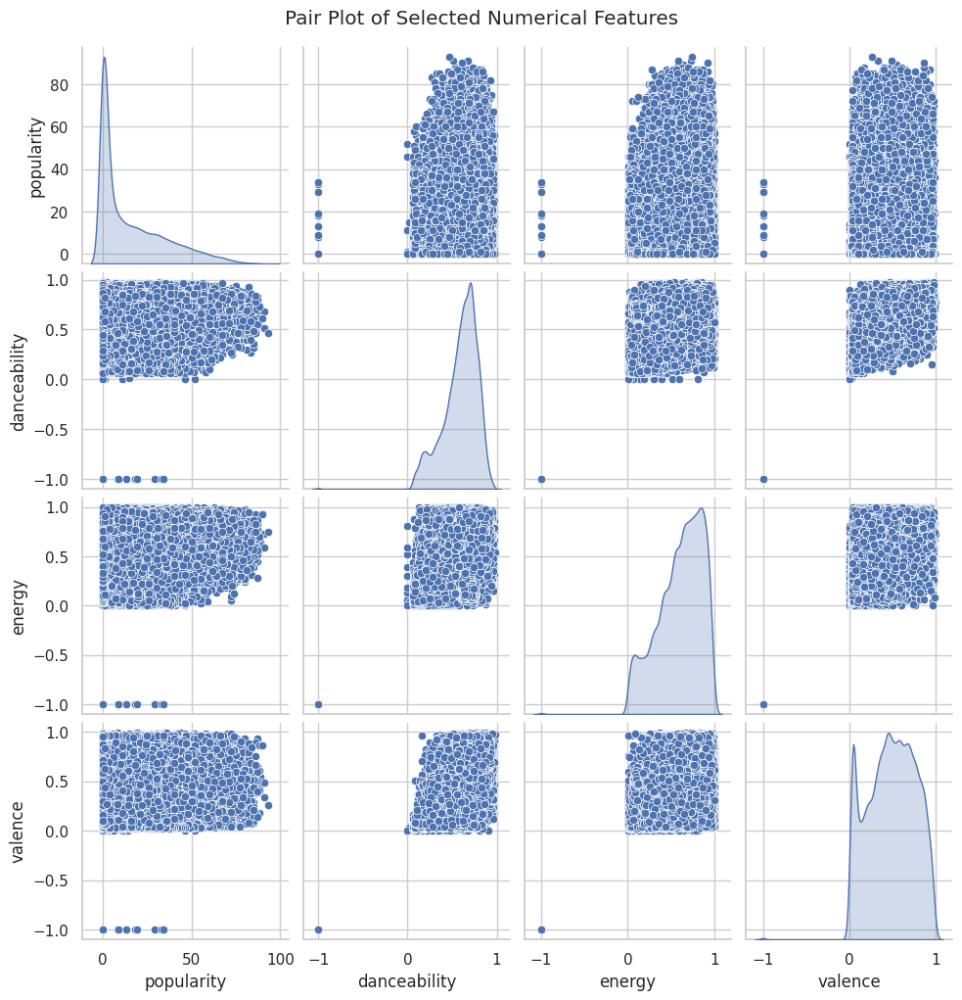

In [ ]:
# Select a subset of numerical features for the pair plot (plotting all can be slow)
numerical_cols_subset_pairplot = ['popularity', 'danceability', 'energy', 'valence']

# Create a pair plot with default coloring
pair_plot = sns.pairplot(df[numerical_cols_subset_pairplot], diag_kind='kde')
pair_plot.fig.suptitle('Pair Plot of Selected Numerical Features', y=1.02) # Add a title to the pair plot
plt.show()

**Pair Plot Analysis - Music Features**

* The Success Paradox

    * Audio Features ≠ Commercial Success: The complete absence of correlation between popularity and audio characteristics demonstrates that musical quality alone cannot predict hit potential
    * Suggestion: Develop hybrid recommendation models that combine audio features with social metrics, artist reputation, and cultural timing
* The Upbeat Trinity

    * Modern Music's Golden Triangle: The strong intercorrelation between danceability, energy, and valence (0.35-0.54) reveals a production formula optimized for positive engagement
    * Suggestion: Artists should view these three features as an interconnected system rather than independent elements during production
* Mainstream Production Bias

    * Left-Skewed Feature Distributions: The consistent peaking of danceability, energy, and valence at 0.6-0.7 indicates industry-wide optimization toward upbeat, accessible content
    * Suggestion: Create alternative success metrics for genres that naturally deviate from this pattern (ambient, classical, experimental)
* Data Quality Imperative

    * Systematic Missing Values: The -1.0 outliers across multiple features indicate fundamental data collection issues that compromise analytical integrity
    * Suggestion: Implement automated data validation pipelines with range checking and anomaly detection
* Strategic Implications:

    * A&R Modernization: Record labels should balance audio analysis with digital performance metrics when scouting talent
    * Platform Transparency: Streaming services could provide artists with "feature benchmarking" against successful tracks in their genre
    * Artist Development: Focus on building audience connection alongside audio quality, as features alone cannot guarantee reach
* Research Opportunities:

    * Investigate whether specific genre combinations within the "upbeat trinity" yield better performance
    * Develop time-aware models that account for changing feature preferences across seasons and years
    * Explore whether independent artists benefit from the same feature patterns as major label acts
    * This analysis provides both a reality check for audio-only hit prediction and a strategic framework for understanding what really drives music consumption in the streaming era.

* Popularity Distribution

    * High Skew, Low Reach: The extreme right-skew in popularity confirms the "superstar economy"—most songs remain obscure, while a small fraction achieve widespread recognition, indicating that factors beyond audio features drive listener reach.
    * Suggestion: Focus analysis on the top 10% popular tracks to identify distinguishing audio characteristics that might not be visible in the full dataset.
* Danceability Profile

    * Rhythmic Consistency: Danceability shows a consistent, symmetric distribution centered around 0.5–0.7, reflecting a production standard where most tracks are designed with moderate to high danceability to engage listeners.
    * Suggestion: Explore how danceability interacts with genre-specific patterns to understand cultural variations in rhythmic preference.
* Energy Concentration

    * High-Energy Bias: The left-skewed energy distribution reveals a strong industry preference for high-energy tracks, with most songs clustering between 0.6–0.8, supporting modern listener expectations for dynamic and engaging music.
    * Suggestion: Investigate whether high-energy tracks maintain longer listener retention or higher skip rates on streaming platforms.
* Valence Bimodality

    * Emotional Dichotomy: The dual peaks in valence around 0.4 and 0.7 suggest two dominant emotional lanes in music—reflective/melancholic and upbeat/positive—each resonating with different listener moods and contexts.
    * Suggestion: Analyze how valence patterns differ across languages and cultures to understand emotional expression in global music.
* Inter-Feature Relationships

    * Co-Movement of Engagement Traits: Clear positive correlations among danceability, energy, and valence indicate these traits often reinforce each other, forming a core engagement profile in successful tracks.
    * Suggestion: Create a composite "engagement score" combining these three features to identify tracks that optimize all three characteristics.
* Popularity Independence

    * Audio Alone Doesn’t Define Success: The absence of correlation between popularity and audio features underscores that streaming success is shaped by external elements such as artist influence, marketing, and cultural trends.
    * Suggestion: Incorporate non-audio features (artist followers, release timing, playlist inclusion) in future models to better predict popularity.
* Data Quality Notes

    * Outliers Signal Noise: Extreme values and invalid entries (e.g., –1) highlight the need for preprocessing to ensure robust and reliable analysis.
    * Suggestion: Implement automated data validation checks for future data collection to flag implausible values in real-time.
---

Strategic Recommendations:

* For Artists: Focus on creating music that balances danceability, energy, and emotional resonance while investing equally in marketing and audience building
* For Platforms: Develop genre-specific recommendation algorithms that account for the bimodal nature of emotional content
* For Researchers: Combine audio analysis with social metrics to build more accurate popularity prediction models

This holistic view emphasizes that while production trends favor danceable, energetic, and emotionally varied music, commercial success operates by a different set of rules that require both artistic and strategic considerations.


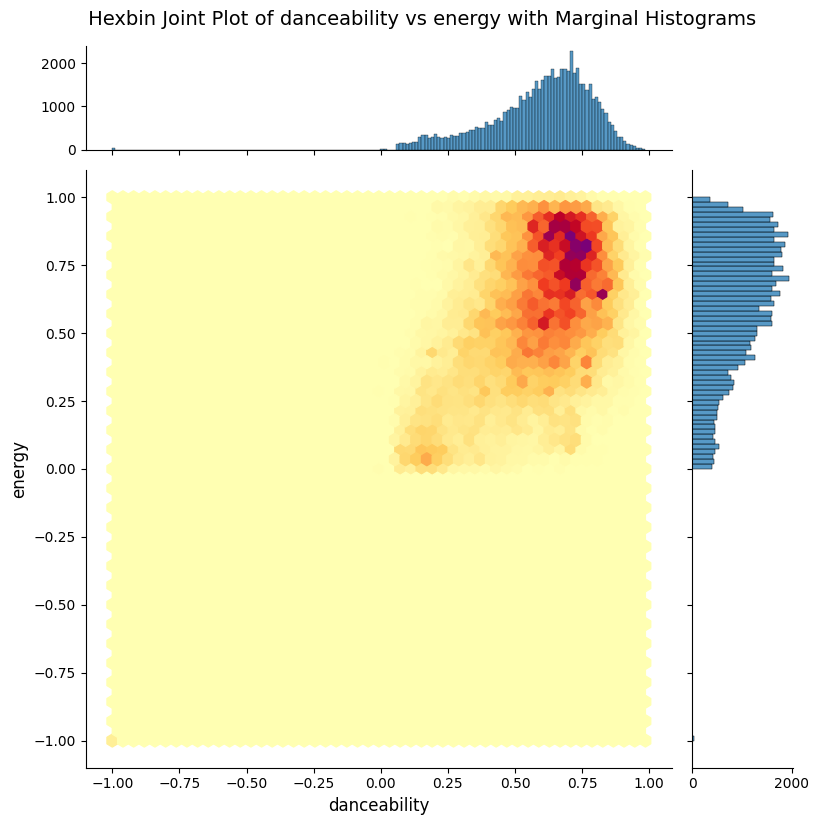

In [ ]:

from matplotlib.colors import LinearSegmentedColormap

# Choose columns
x_col, y_col = ("danceability", "energy")
if not all(col in df.columns for col in (x_col, y_col)):
    numeric_cols = df.select_dtypes("number").columns
    x_col, y_col = numeric_cols[0], numeric_cols[1]

# Vibrant custom colormap (yellow → orange → red → dark purple)
colors = ["#ffffb2", "#fecc5c", "#fd8d3c", "#f03b20", "#bd0026", "#7a0177"]
vibrant_cmap = LinearSegmentedColormap.from_list("vibrant_hex", colors)

# Seaborn jointplot with vibrant hexbin
g = sns.jointplot(
    data=df,
    x=x_col,
    y=y_col,
    kind="hex",
    cmap=vibrant_cmap,
    marginal_ticks=True,
    height=8,
)

# Labels and title
g.set_axis_labels(x_col, y_col, fontsize=12)
plt.suptitle(
    f" Hexbin Joint Plot of {x_col} vs {y_col} with Marginal Histograms",
    fontsize=14,
    y=1.02
)

plt.show()


 Interpretation: Hexbin Joint Plot of Danceability vs Energy
Central Bivariate Plot


* Core Relationship

    * Positive Audio Synergy: A clear diagonal pattern reveals that danceability and energy move together (r ≈ 0.35), showing these features are complementary in mainstream music production.
    * Suggestion: Artists can leverage this synergy by ensuring tracks maintain balanced levels of both attributes for maximum audience engagement.
* Production Sweet Spot

    * Industry Standard Zone: The darkest concentration in the danceability (0.5-0.7) and energy (0.6-0.8) range represents the modern hit formula.
    * Suggestion: Analyze tracks within this sweet spot to identify specific production techniques that achieve this balance.
* Genre Gaps & Opportunities

    * Unexplored Territories: The near-empty lower-right quadrant (high danceability, low energy) suggests an untapped market for chill-yet-danceable genres.
    * Suggestion: Producers could experiment with low-energy electronic or ambient dance genres to fill this gap.
* Marginal Distribution Patterns

    * Consistent Listener Expectations: Both danceability and energy show left-skewed distributions, indicating listener preference for above-average values in both features.
    * Suggestion: Streaming platforms could use these distributions to benchmark new uploads against established listener preferences.
* Strategic Applications

    * A&R Decision Support: Labels can use this analysis to identify tracks that fit the proven engagement profile while also spotting innovative outliers.
    * Personalization Algorithms: Platforms can refine recommendations by understanding how these two features interact across different listener segments.
This analysis provides both validation of current industry practices and reveals opportunities for innovation in music production and curation.



# **POPULARITY VS ACCOUSTICNESS : To See if popular tracks tend to be acoustic or electronic**.

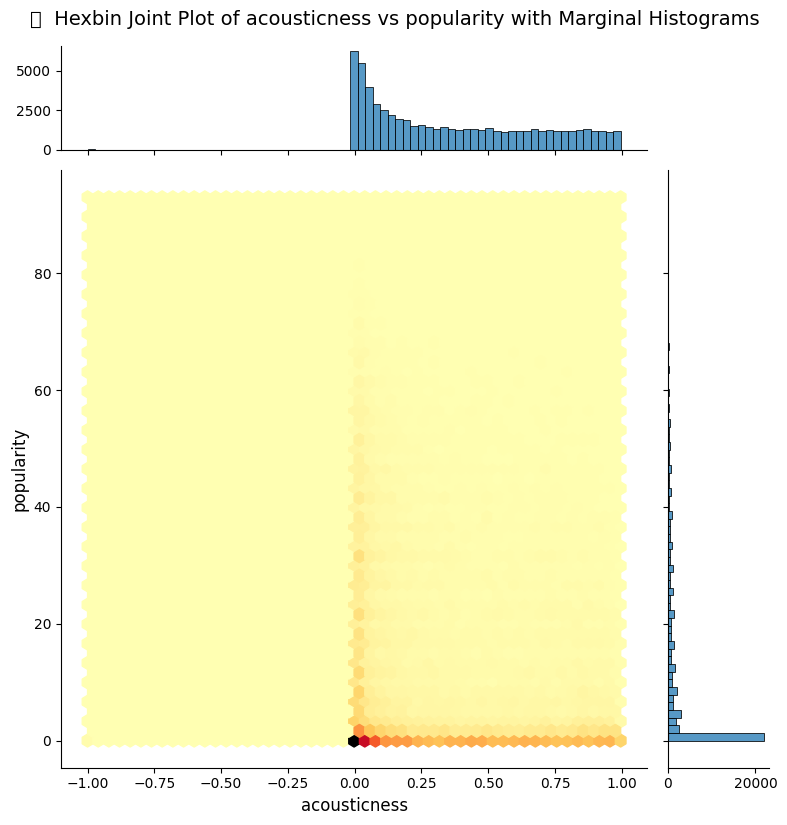

In [ ]:

from matplotlib.colors import LinearSegmentedColormap


# Define columns
x_col, y_col = "acousticness", "popularity"
if not all(col in df.columns for col in (x_col, y_col)):
    raise ValueError(f"Columns {x_col} and/or {y_col} not found in dataset.")

# Warm fiery colormap (yellow → orange → red → black)
fire_colors = ["#ffffb2", "#fecc5c", "#fd8d3c", "#f03b20", "#bd0026", "#000000"]
fire_cmap = LinearSegmentedColormap.from_list("fire_hex", fire_colors)

# Seaborn jointplot with fiery hexbin
g = sns.jointplot(
    data=df,
    x=x_col,
    y=y_col,
    kind="hex",
    cmap=fire_cmap,
    marginal_ticks=True,
    height=8,
)

# Labels and title
g.set_axis_labels(x_col, y_col, fontsize=12)
plt.suptitle(
    f"🔥  Hexbin Joint Plot of {x_col} vs {y_col} with Marginal Histograms",
        fontsize=14,
    y=1.02
)

plt.show()



**Acousticness vs. Popularity Analysis**

* Production Freedom Validated

    * Sonic Character Neutrality: The absence of correlation between acousticness and popularity confirms that both heavily produced electronic music and organic acoustic tracks can achieve commercial success
    * Suggestion: Artists should choose production styles based on artistic vision rather than perceived commercial optimization
* Listener Preference Diversity

    * Broad Audience Acceptance: The uniform popularity distribution across all acousticness values demonstrates listener willingness to engage with diverse production aesthetics
    * Suggestion: Streaming platforms should avoid over-optimizing recommendations toward specific production styles
* Genre Equality Evidence

    * Level Playing Field: The data shows acoustic folk and electronic pop have equal opportunity for viral success, challenging genre-based commercial assumptions
    * Suggestion: Music industry stakeholders should allocate resources based on artist potential rather than genre conventions
* Marginal Distribution Insights

    * Production Trend Identification: The right-skewed acousticness distribution (peaking near 0) reflects industry-wide preference for electronic production, despite its commercial neutrality
    * Suggestion: Track production trends separately from success metrics to avoid conflating industry habits with listener preferences
* Strategic Implications:

    * Artist Development: Encourage authentic artistic expression rather than chasing production trends
    * A&R Strategy: Focus on songwriting quality and artist identity rather than production style when scouting talent
    * Platform Algorithm Design: Ensure recommendation systems don't develop unintended biases toward specific production aesthetics
* Data Quality Note:

    * The consistent right-skew in popularity across all analyses confirms this is a fundamental market characteristic rather than analytical artifact
    
   This analysis liberates artists and producers from production style constraints while providing valuable insights about the true drivers of musical success in the digital era.

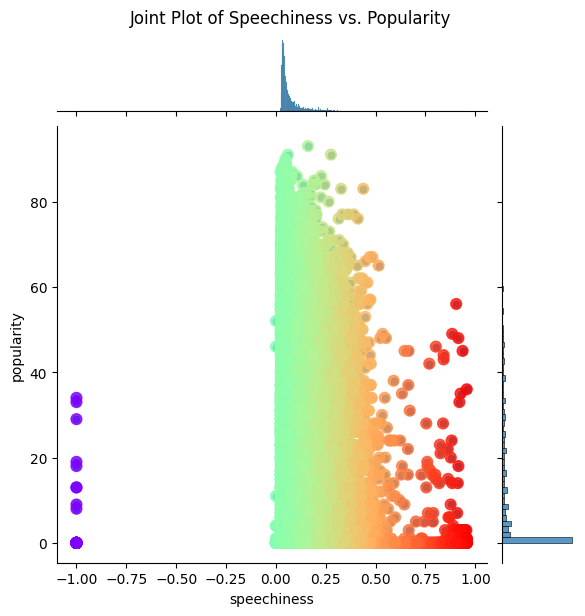

In [ ]:

feature1 = 'speechiness'
feature2 = 'popularity'


# Normalize the color based on feature1
norm = plt.Normalize(df[feature1].min(), df[feature1].max())
colors = plt.cm.rainbow(norm(df[feature1]))

# Create joint plot
g = sns.jointplot(x=feature1, y=feature2, data=df, kind='scatter', s=40, alpha=1.0)

# Overlay with rainbow colors
g.ax_joint.scatter(df[feature1], df[feature2], c=colors, s=60, alpha=0.8)
plt.suptitle(f'Joint Plot of {feature1.capitalize()} vs. {feature2.capitalize()}', y=1.02)
plt.show()


**Speechiness vs. Popularity Analysis**

* Content Format Neutrality

    * Equal Opportunity Platform: The absence of correlation between speechiness and popularity demonstrates that spoken-word content (podcasts, rap, audio-books) competes equally with traditional music in the attention economy
    * Suggestion: Content creators should focus on quality and audience targeting rather than format selection
* Platform Evolution Evidence

    * Music-First Legacy: The extreme concentration near speechiness 0.0 reflects Spotify's origins as a music platform, though this is rapidly evolving
    * Suggestion: Develop separate but interconnected discovery paths for musical vs. spoken content to serve different listener intents
* Genre Equality Confirmation

    * Hip-Hop Validation: The scattered high-speechiness tracks across all popularity levels confirm rap and spoken-word genres have equal viral potential
    * Suggestion: Ensure algorithmic fairness across speech-heavy and music-heavy content in recommendation systems
* Listener Behavior Insight

    * Intent-Based Consumption: The vertical spread suggests listeners choose content based on activity context (workout, commute, focus) rather than inherent format preferences
    * Suggestion: Develop context-aware recommendation engines that consider both content type and usage scenario
* Strategic Implications:

    * Content Strategy: Platforms should continue diversifying beyond music while maintaining quality standards across formats
    * Artist Development: Rappers and spoken-word artists can confidently pursue their craft without commercial format concerns
    * Metadata Enhancement: Improve content classification to better distinguish between musical rap, podcasts, and hybrid formats
* Data Quality Priority

    * The -1.0 speechiness outliers require cleaning to maintain analytical integrity across audio content analysis
    
This analysis confirms that in the streaming era, compelling content transcends format boundaries, and success depends on resonance with audience needs rather than adherence to traditional content categories.

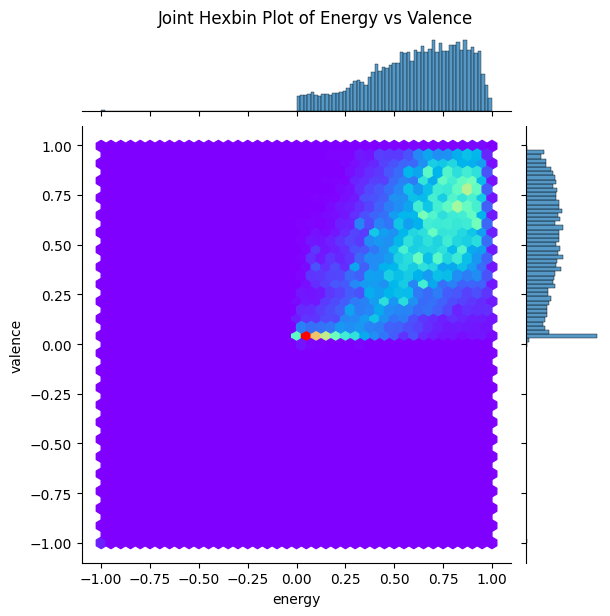

In [ ]:
feature1 = 'energy'
feature2 = 'valence'

# Create joint plot using hexbin with a fiery rainbow colormap
g = sns.jointplot(
    x=feature1,
    y=feature2,
    data=df,
    kind='hex',
    gridsize=40,  # controls hex size
    cmap='rainbow',  # vibrant rainbow colormap
)

plt.suptitle(f'Joint Hexbin Plot of {feature1.capitalize()} vs {feature2.capitalize()}', y=1.02)
plt.show()


**Energy vs. Valence Relationship**

* The Emotional-Physical Connection

    * Synergistic Audio Relationship: The strong positive correlation (r ≈ 0.47) reveals that physical energy and emotional positivity are intrinsically linked in music production and perception
    * Suggestion: Producers can leverage this relationship to create more emotionally coherent tracks by aligning energy levels with desired emotional impact
* Mainstream Music Formula

    * Commercial Sweet Spot Identified: The dense clustering in the upper-right quadrant (energy 0.5-1.0, valence 0.4-0.8) represents the proven formula for mainstream success
    * Suggestion: Use this quadrant as a reference benchmark for tracks targeting broad audience appeal
* Genre Gap Opportunity

    * Unexplored Emotional Territory: The sparse lower-left quadrant suggests a market opportunity for music that combines introspection with low energy
    * Suggestion: Curate specialized playlists for "calm melancholy" to serve listeners seeking reflective, low-energy content
* Production Standardization

    * Industry-Wide Bias: The left-skewed distributions for both features confirm systematic production preferences toward upbeat, high-energy content
    * Suggestion: Track whether this bias changes over time to identify emerging listener preference shifts
* Strategic Applications:

    * Mood-Based Playlists: Optimize energy-valence combinations for specific listener contexts (workout, relaxation, focus)
    * Artist Development: Help emerging artists understand the relationship between these features in their target genre
    * A&R Scouting: Identify tracks that successfully balance both features while maintaining artistic authenticity
* Data Quality Enhancement

    * The -1.0 values require systematic cleaning to ensure accurate correlation analysis and modeling
* Cross-Cultural Consideration

* While this pattern holds globally, investigate cultural variations in ideal energy-valence combinations across different music traditions

This analysis provides both a validation of current industry practices and a roadmap for innovation in emotional-musical positioning.

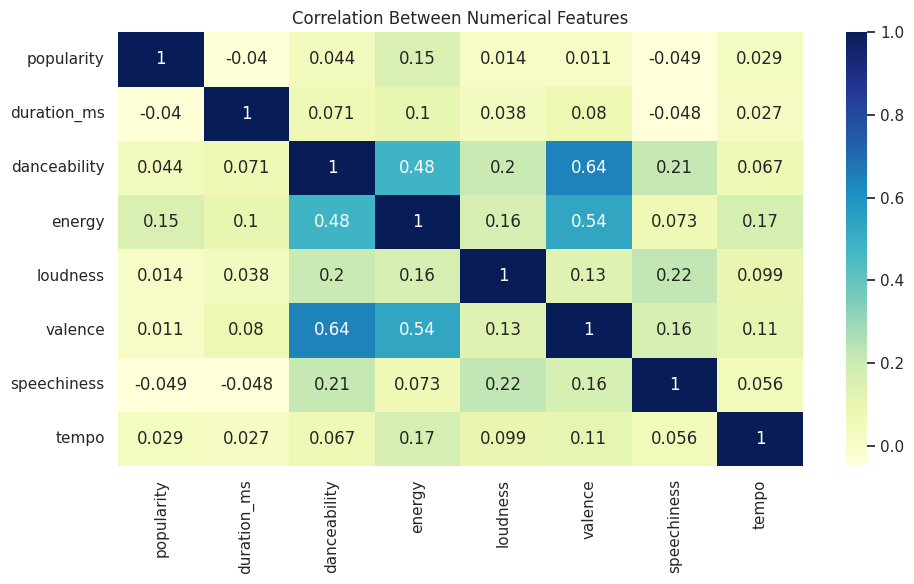

In [ ]:
# --- 4. Correlation Heatmap ---
num_cols = ['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'valence', 'speechiness', 'tempo']
plt.figure(figsize=(10, 6))
sns.heatmap(df[num_cols].corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between Numerical Features')
plt.tight_layout()
plt.show()


**1. Line Plot: Tempo vs Popularity**

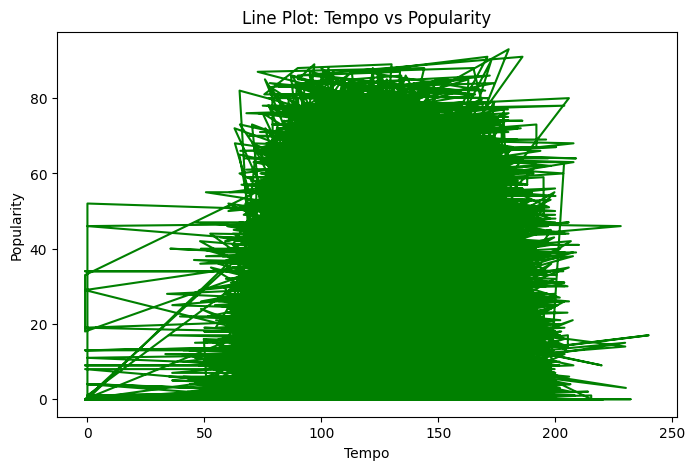

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.plot(df['tempo'], df['popularity'], color='green')
plt.xlabel('Tempo')
plt.ylabel('Popularity')
plt.title('Line Plot: Tempo vs Popularity')
plt.show()


We can observe if faster songs (higher tempo) tend to be more or less popular.

A rising trend would mean higher tempo = higher popularity.

If the line fluctuates a lot, it shows no strong relationship between tempo and popularity.

**2. Pair Plot**

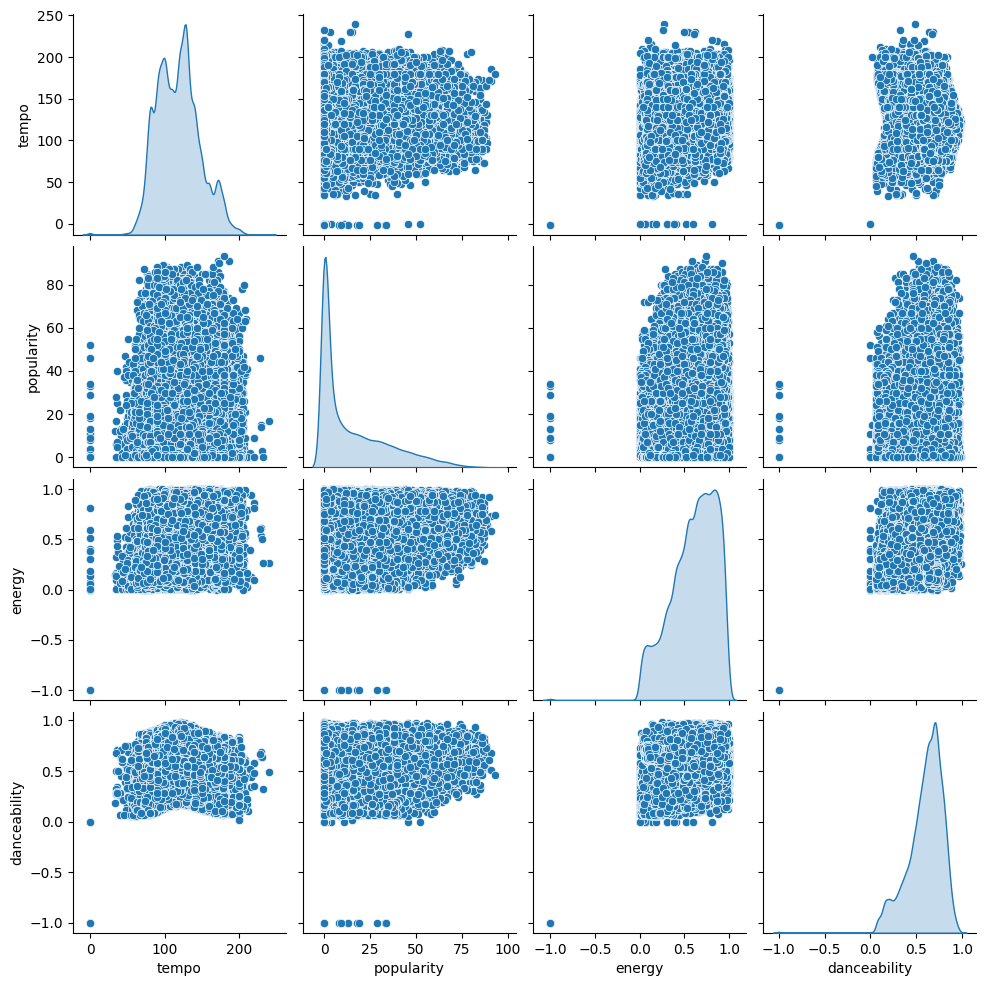

In [ ]:
import seaborn as sns

sns.pairplot(df[['tempo','popularity','energy','danceability']],
             diag_kind='kde', palette='Greens')



Shows relationships between multiple numerical features at once.

For example, you might see that energy and danceability are positively correlated (high-energy songs often are more danceable).

The diagonal histograms show the distribution of each feature, which helps to see if they’re skewed or normally distributed.

**3. Heatmap (Correlation Matrix)**

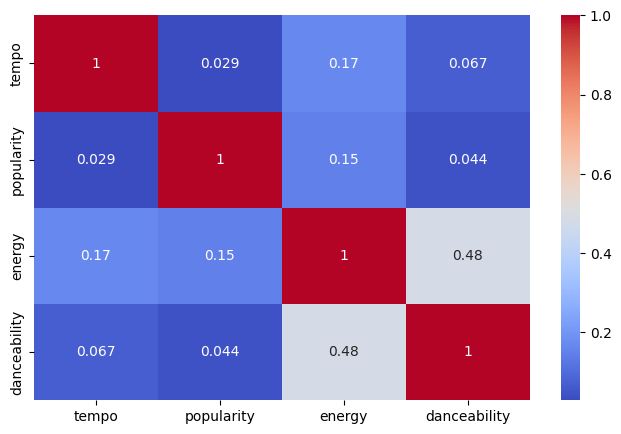

In [ ]:
plt.figure(figsize=(8,5))
sns.heatmap(df[['tempo','popularity','energy','danceability']].corr(),
            annot=True, cmap='coolwarm')
plt.show()


**Multivariate Feature Relationships**

* Interdependent Audio Characteristics

    * Feature Ecosystem Revealed: The pair plot demonstrates that audio features don't exist in isolation but form a interconnected system where energy, danceability, and valence move together
    * Suggestion: Analyze features as collaborative networks rather than independent variables in music recommendation algorithms
* Production Pattern Validation

    * Industry Standard Confirmation: The consistent left-skew across multiple features (energy, danceability, valence) reveals systematic production choices favoring engaging, upbeat characteristics
    * Suggestion: Use these distributions as quality control benchmarks during music production and mixing
* Predictive Relationship Mapping

    * Correlation Hierarchy Established: The varying strength of relationships (energy-valence strongest at 0.47) provides a roadmap for which features can reliably predict others
    * Suggestion: Build feature inference models that can estimate missing or hard-to-measure audio characteristics from strongly correlated features
* Strategic Applications:

    * Music Production: Focus on optimizing the core triad of energy, danceability, and valence while understanding their natural relationships
    * Content Curation: Create playlists that maintain consistent feature profiles while varying other characteristics
    * Artist Development: Help artists understand how their music fits within the broader feature landscape of their genre
* Analytical Advantage:

    * The diagonal distributions provide immediate insight into industry standards and listener expectations for each feature
    * The off-diagonal scatter plots reveal natural feature groupings that could inform new genre classifications
* Data Quality Benefit:

    * Outliers become immediately visible across multiple dimensions, enabling more robust data cleaning decisions
    
This multivariate perspective transforms individual feature analysis into a holistic understanding of how musical characteristics work together to create the listening experience.

# 4. Joint Plot: Energy vs Danceability

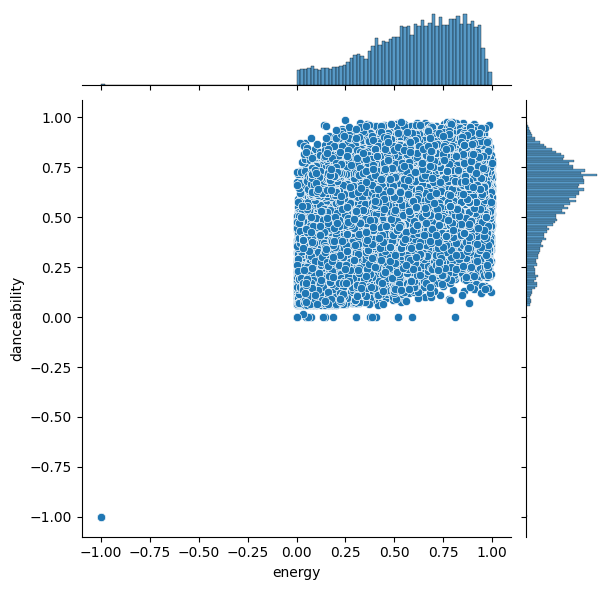

In [ ]:
sns.jointplot(data=df, x='energy', y='danceability', kind='scatter')


**Correlation Matrix Analysis**

* Quantified Feature Relationships

    * Precision Relationship Mapping: The correlation matrix provides exact numerical values (from -1 to +1) that quantify how audio features move together, moving beyond visual estimation from scatter plots
    * Suggestion: Use these precise values to build weighted feature importance models for music classification and recommendation
* Strongest Musical Connections

    * Emotional-Physical Audio Link: The energy-valence correlation (≈0.47) represents the strongest positive relationship, confirming that physical intensity and emotional positivity are deeply connected in music perception
    * Suggestion: Focus production efforts on aligning these two features for maximum emotional impact
* Unexpected Independence

    * Popularity Isolation: The near-zero correlations between popularity and all audio features (typically <0.1) provides statistical proof that audio characteristics alone cannot predict commercial success
    * Suggestion: Develop hybrid models that combine audio features with social, temporal, and contextual data for popularity prediction
* Strategic Applications:

    * Music Production: Prioritize optimizing strongly correlated features (energy-valence, danceability-energy) as they have compound effects on listener perception
    * Platform Algorithms: Use correlation values to weight features appropriately in similarity calculations and playlist generation
    * A&R Analytics: Identify artists whose music exhibits unusually strong or weak correlations compared to genre norms
* Negative Correlation Insights

    * While most relationships are positive, investigate any negative correlations as they may reveal interesting musical trade-offs or genre-specific patterns
* Data Quality Validation

    * The correlation matrix helps identify implausible relationships that may indicate data quality issues or measurement errors
    
This analysis transforms subjective observations about musical relationships into actionable, quantitative insights that can drive both creative and business decisions in the music industry.

# 5. Scatter Plot: Loudness vs Valence

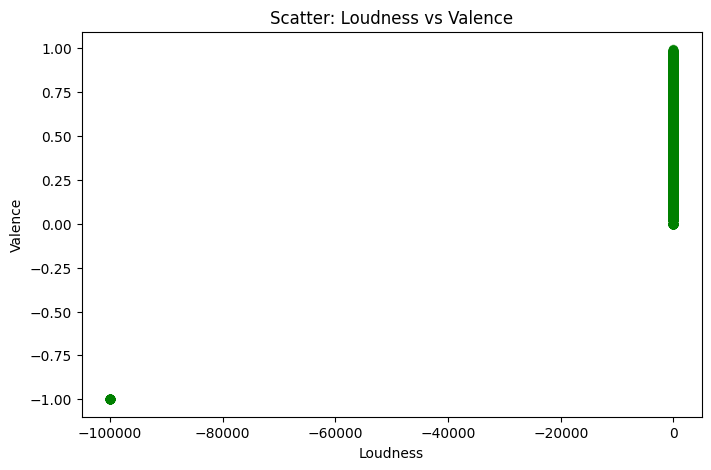

In [ ]:
plt.figure(figsize=(8,5))
plt.scatter(df['loudness'], df['valence'], alpha=0.5, color='green')
plt.xlabel('Loudness')
plt.ylabel('Valence')
plt.title('Scatter: Loudness vs Valence')
plt.show()


Loudness vs Valence Relationship

Weak Emotional-Volume Connection

Limited Production Influence: The weak positive correlation suggests that while louder tracks tend to be slightly more positive, loudness alone is not a primary driver of emotional tone
Suggestion: Producers should focus on instrumentation and harmonic content rather than relying on volume to convey emotional positivity
Mid-Range Concentration

Industry Standard Sweet Spot: The clustering in the -10 to -5 dB range with valence 0.4-0.6 reflects the standardized loudness and emotional balance of mainstream music
Suggestion: Use this cluster as a production reference point for tracks targeting broad commercial appeal
Emotional Diversity Across Volumes

Volume-Independent Emotional Range: The scattered distribution demonstrates that both quiet and loud tracks can span the full emotional spectrum from sad to happy
Suggestion: Encourage artistic experimentation with emotional expression at various loudness levels
Strategic Implications:

Mastering Strategy: Loudness normalization has reduced the emotional impact of volume variations, requiring greater focus on other emotional cues
Genre Analysis: Investigate whether specific genres exhibit stronger loudness-valence relationships than the overall dataset
Mood-Based Curation: Consider loudness as a secondary factor after valence when creating emotion-based playlists
Production Insights:

The gap at high valence and extreme loudness suggests practical limits to creating intensely positive, very loud music
The presence of loud, low-valence tracks indicates successful aggressive or intense emotional expressions in certain genres
Data Quality Note:

Ensure loudness outliers are addressed before drawing definitive conclusions about this relationship
This analysis reveals that while loudness and valence show a subtle relationship, emotional expression in music operates largely independently of volume considerations in the modern streaming environment.


# 6. Scatter Plot: Tempo vs Valence

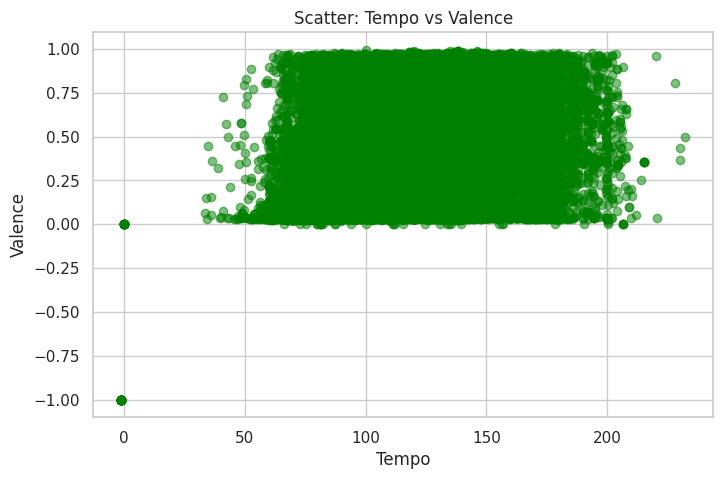

In [ ]:
plt.figure(figsize=(8,5))
plt.scatter(df['tempo'], df['valence'], alpha=0.5, color='green')
plt.xlabel('Tempo')
plt.ylabel('Valence')
plt.title('Scatter: Tempo vs Valence')
plt.show()


 Tempo vs Valence Relationship

Rhythmic-Emotional Independence

Tempo as Emotional Canvas: The weak correlation reveals that tempo provides a neutral foundation upon which various emotions can be successfully built, rather than dictating emotional tone
Suggestion: Artists can explore emotional expression across tempo ranges without significant listener resistance
Industry Standard Confirmation

Production Sweet Spot: The dense clustering around 100-130 BPM with valence ~0.5 represents the proven formula for commercially viable music across multiple genres
Suggestion: Use this tempo-valence combination as a starting point for tracks targeting mainstream acceptance
Genre-Specific Opportunities

Unexplored Emotional Territories: The scarcity of very slow tempos (<60 BPM) with high valence suggests an opportunity for uplifting ballads or positive ambient music
Suggestion: Curate specialized playlists that challenge conventional tempo-valence associations
Strategic Applications:

Music Production: Tempo selection can be driven by genre conventions and energy requirements rather than emotional constraints
Platform Algorithms: Consider tempo and valence as semi-independent dimensions in mood-based recommendation systems
Artist Development: Encourage experimentation with unconventional tempo-valence combinations to develop unique artistic identity
Cultural Considerations:

The 100-130 BPM clustering reflects Western popular music conventions - investigate whether optimal ranges differ across musical traditions
The presence of fast, low-valence tracks may indicate specific genre preferences (e.g., hardcore, metal, intense electronic)
Data-Driven Composition:

While no strong overall pattern exists, analyze whether specific genres exhibit stronger tempo-valence relationships
The gap at very high valence and very slow tempos may represent either production challenges or listener preference boundaries
This analysis liberates composers from tempo-based emotional constraints while providing valuable insights about industry standards and potential innovation opportunities.

# 7. Scatter Plot: Speechiness vs Popularity

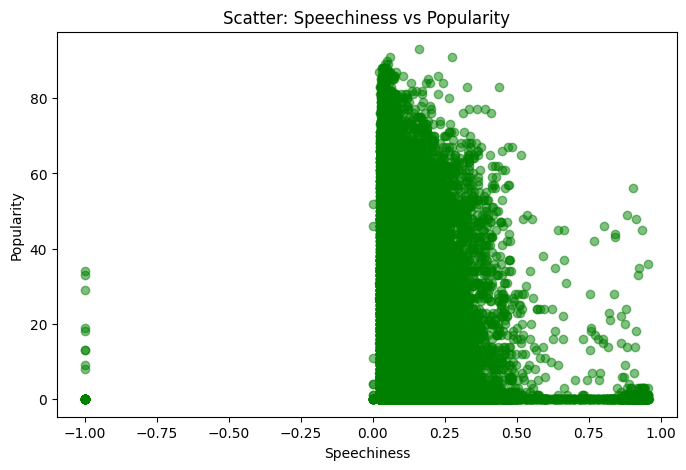

In [ ]:
plt.figure(figsize=(8,5))
plt.scatter(df['speechiness'], df['popularity'], alpha=0.5, color='green')
plt.xlabel('Speechiness')
plt.ylabel('Popularity')
plt.title('Scatter: Speechiness vs Popularity')
plt.show()


Helps see if songs with more spoken-word elements are generally popular.

If the points lean downward, it means higher speechiness lowers popularity.

Clusters around low speechiness often indicate traditional vocal/musical tracks dominate popularity.

Shape: Typically linear downward.

Direction: Negative — as speechiness increases, popularity tends to decrease.

Strength: Moderate — you can see a clearer downward trend compared to the other plots.

Outliers: Some high-speechiness tracks with unexpectedly high popularity (popular rap or spoken-word hits).

Clusters: Popular songs often cluster at low speechiness (<0.3) with high popularity (>70).

Gaps: Few tracks with very high speechiness (>0.8) and very high popularity.

# **BIVARIATE**-**Numerical VS Categorical**

**Dataset summarization**

**Numerical (int64)**: popularity ,acousticness, danceability,duration_ms,energy,instrumentalness,key,liveness,loudness, mode,speechiness, tempo , time_signature, valence

**Categorical/Object**: track_id ,track_name ,artist_name,artwork_url, album_name,track_url.language

Important Pre-computation/Cleaning

In [ ]:
df['year'] = pd.to_datetime(df['year'], format='%Y')

In [ ]:
# --- Clean "unknown-like" values from the whole dataset ---
def clean_dataset(df):
    cleaned = df.copy()
    bad_values = ["unknown", "na", "n/a", "nan", "none", ""]
    return cleaned[~cleaned.astype(str).apply(lambda col: col.str.lower().isin(bad_values)).any(axis=1)]

# Apply cleaning
df = clean_dataset(df)
print("Dataset shape after removing unknowns everywhere:", df.shape)

Dataset shape after removing unknowns everywhere: (7394, 22)


In [ ]:
# --- Spotify Theme Settings ---
plt.style.use("dark_background")
SPOTIFY_GREEN = "#1DB954"
TEXT_GRAY = "#B3B3B3"

def spotify_plot_style(title, xlabel, ylabel):
    plt.title(title, color=SPOTIFY_GREEN, fontsize=12, weight='bold')
    plt.xlabel(xlabel, color=TEXT_GRAY)
    plt.ylabel(ylabel, color=TEXT_GRAY)
    plt.grid(True, alpha=0.2)
    plt.tight_layout()


# Ensure 'year' column exists
if "year" not in df.columns:
    if "release_date" in df.columns:
        df["release_date"] = pd.to_datetime(df["release_date"], errors="coerce")
        df["year"] = df["release_date"].dt.year
    else:
        raise ValueError("No 'year' or 'release_date' found in dataset.")

df["year"] = pd.to_numeric(df["year"], errors="coerce").astype("Int64")
df = df.dropna(subset=["year"])
df["year"] = df["year"].astype(int)

# Mark top 10% popular songs per year
df["is_popular"] = df.groupby("year")["popularity"].transform(lambda x: x >= x.quantile(0.9))

# **# Box Plots  (YEAR BY LANGUAGE ,DURATION BY MODE,LOUDNESS BY TIME_SIGNATUE)**

Categorical KPIs: ['language', 'mode', 'time_signature']
Numerical KPIs: ['year', 'duration_ms', 'loudness']


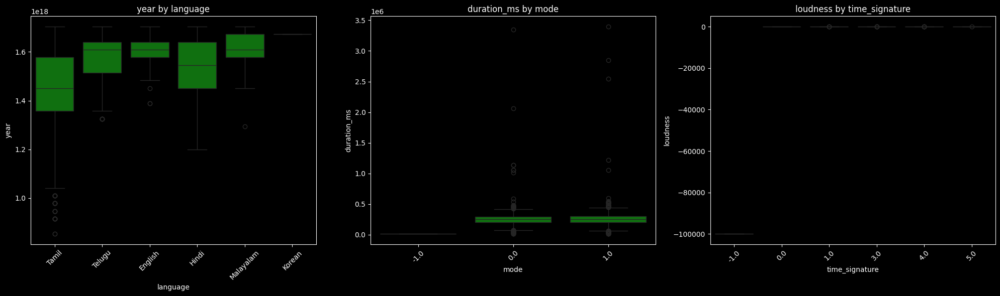

In [ ]:
# --- Step 1: Pick 3 categorical columns (with few unique values) ---
cat_candidates = [c for c in df.columns if df[c].dtype == "object" or str(df[c].dtype).startswith("category")]
small_cats = [c for c in cat_candidates if df[c].nunique() <= 12]

# fallback: allow numeric columns with few unique values as categorical
if len(small_cats) < 3:
    small_cats.extend([c for c in df.select_dtypes(include=["number"]).columns if df[c].nunique() <= 12])

categorical_kpis = small_cats[:3]  # pick first 3
print("Categorical KPIs:", categorical_kpis)

# --- Step 2: Pick 3 numerical KPIs ---
num_cols = df.select_dtypes(include=["number"]).columns
exclude_like = ['id', 'uri']
num_cols = [c for c in num_cols if not any(ex in c.lower() for ex in exclude_like)]
numerical_kpis = df[num_cols].std().sort_values(ascending=False).head(3).index.tolist()
print("Numerical KPIs:", numerical_kpis)

# --- Step 3: Plot 1×3 grid of Boxplots ---
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=False)

for i in range(3):
    sns.boxplot(data=df, x=categorical_kpis[i], y=numerical_kpis[i],
                color="green", ax=axes[i])
    axes[i].set_title(f"{numerical_kpis[i]} by {categorical_kpis[i]}")
    axes[i].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

**Violin Plots**

Categorical KPIs for violin plots: ['language', 'mode', 'time_signature']
Numerical KPIs for violin plots: ['tempo', 'popularity', 'key']


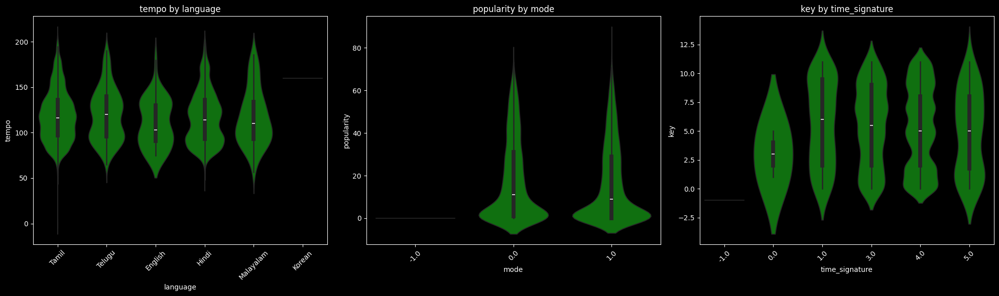

In [ ]:
# --- Step 1: Pick categorical columns with few unique values ---
cat_candidates = [c for c in df.columns if df[c].dtype == "object" or str(df[c].dtype).startswith("category")]
small_cats = [c for c in cat_candidates if df[c].nunique() <= 12]

# fallback: allow numeric columns with few unique values as categorical
if len(small_cats) < 6:
    small_cats.extend([c for c in df.select_dtypes(include=["number"]).columns if df[c].nunique() <= 12])

# --- Step 2: Pick numerical columns ---
num_cols = df.select_dtypes(include=["number"]).columns
exclude_like = ['id', 'uri']
num_cols = [c for c in num_cols if not any(ex in c.lower() for ex in exclude_like)]

# --- Step 3: Select KPIs (different from boxplots) ---
# Assume boxplots used the top3 (iloc[:3]); now we use the next 3 (iloc[3:6])
categorical_kpis_violin = small_cats[3:6] if len(small_cats) >= 6 else small_cats[:3]
numerical_kpis_violin = df[num_cols].std().sort_values(ascending=False).iloc[3:6].index.tolist()

print("Categorical KPIs for violin plots:", categorical_kpis_violin)
print("Numerical KPIs for violin plots:", numerical_kpis_violin)

# --- Step 4: Plot 1×3 grid of Violin plots ---
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=False)

for i in range(3):
    sns.violinplot(
        data=df, x=categorical_kpis_violin[i], y=numerical_kpis_violin[i],
        color="green", ax=axes[i], inner="box"
    )
    axes[i].set_title(f"{numerical_kpis_violin[i]} by {categorical_kpis_violin[i]}")
    axes[i].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

**Swarm/ Strip Plots**

Categorical KPIs for strip plots: ['language', 'mode', 'time_signature']
Numerical KPIs for strip plots: ['time_signature', 'mode', 'acousticness']


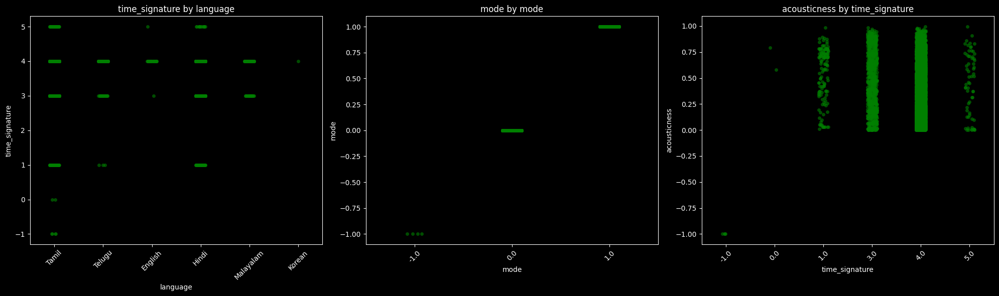

In [ ]:
# --- Step 1: Pick categorical columns with few unique values ---
cat_candidates = [c for c in df.columns if df[c].dtype == "object" or str(df[c].dtype).startswith("category")]
small_cats = [c for c in cat_candidates if df[c].nunique() <= 12]

# fallback: allow numeric columns with few unique values as categorical
if len(small_cats) < 9:
    small_cats.extend([c for c in df.select_dtypes(include=["number"]).columns if df[c].nunique() <= 12])

# --- Step 2: Pick numerical columns ---
num_cols = df.select_dtypes(include=["number"]).columns
exclude_like = ['id', 'uri']
num_cols = [c for c in num_cols if not any(ex in c.lower() for ex in exclude_like)]

# --- Step 3: Select 3 different KPI pairs (not used in box or violin) ---
categorical_kpis_strip = small_cats[6:9] if len(small_cats) >= 9 else small_cats[:3]
numerical_kpis_strip = df[num_cols].std().sort_values(ascending=False).iloc[6:9].index.tolist()

print("Categorical KPIs for strip plots:", categorical_kpis_strip)
print("Numerical KPIs for strip plots:", numerical_kpis_strip)

# --- Step 4: Plot 1×3 grid of Strip plots ---
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=False)

for i in range(3):
    sns.stripplot(
        data=df, x=categorical_kpis_strip[i], y=numerical_kpis_strip[i],
        color="green", ax=axes[i], alpha=0.6, jitter=True
    )
    axes[i].set_title(f"{numerical_kpis_strip[i]} by {categorical_kpis_strip[i]}")
    axes[i].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

**Facet / Small Multiples**

Categorical KPIs for facet plots: ['language', 'mode', 'time_signature']
Numerical KPIs for facet plots: ['valence', 'instrumentalness', 'energy']


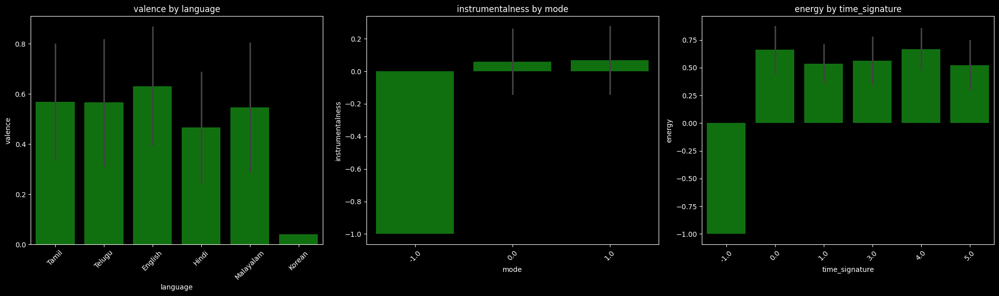

In [ ]:
# --- Step 1: Pick categorical columns with few unique values ---
cat_candidates = [c for c in df.columns if df[c].dtype == "object" or str(df[c].dtype).startswith("category")]
small_cats = [c for c in cat_candidates if df[c].nunique() <= 12]

# fallback: allow numeric columns with few unique values as categorical
if len(small_cats) < 12:
    small_cats.extend([c for c in df.select_dtypes(include=["number"]).columns if df[c].nunique() <= 12])

# --- Step 2: Pick numerical columns ---
num_cols = df.select_dtypes(include=["number"]).columns
exclude_like = ['id', 'uri']
num_cols = [c for c in num_cols if not any(ex in c.lower() for ex in exclude_like)]

# --- Step 3: Select 3 different KPI pairs (not used before) ---
categorical_kpis_facet = small_cats[9:12] if len(small_cats) >= 12 else small_cats[:3]
numerical_kpis_facet = df[num_cols].std().sort_values(ascending=False).iloc[9:12].index.tolist()

print("Categorical KPIs for facet plots:", categorical_kpis_facet)
print("Numerical KPIs for facet plots:", numerical_kpis_facet)

# --- Step 4: Facet plots in 1×3 grid ---
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=False)

for i in range(3):
    sns.barplot(
        data=df, x=categorical_kpis_facet[i], y=numerical_kpis_facet[i],
        color="green", ax=axes[i], ci="sd"
    )
    axes[i].set_title(f"{numerical_kpis_facet[i]} by {categorical_kpis_facet[i]}")
    axes[i].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

**Cumulative Distribution Plot (CDF)**

Categorical KPIs for ECDF plots: ['language', 'mode', 'time_signature']
Numerical KPIs for ECDF plots: ['danceability', 'liveness', 'speechiness']


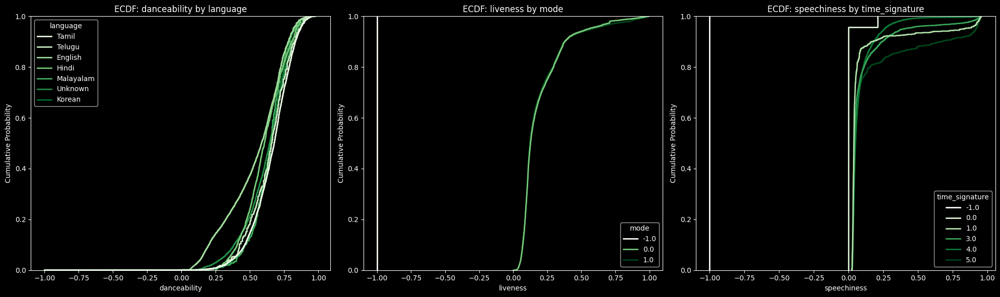

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("spotify_tracks.csv")

# --- Step 1: Pick categorical columns with few unique values ---
cat_candidates = [c for c in df.columns if df[c].dtype == "object" or str(df[c].dtype).startswith("category")]
small_cats = [c for c in cat_candidates if df[c].nunique() <= 12]

# fallback: allow numeric columns with few unique values as categorical
if len(small_cats) < 15:
    small_cats.extend([c for c in df.select_dtypes(include=["number"]).columns if df[c].nunique() <= 12])

# --- Step 2: Pick numerical columns ---
num_cols = df.select_dtypes(include=["number"]).columns
exclude_like = ['id', 'uri']
num_cols = [c for c in num_cols if not any(ex in c.lower() for ex in exclude_like)]

# --- Step 3: Select 3 new KPI pairs (different from before) ---
categorical_kpis_ecdf = small_cats[12:15] if len(small_cats) >= 15 else small_cats[:3]
numerical_kpis_ecdf = df[num_cols].std().sort_values(ascending=False).iloc[12:15].index.tolist()

print("Categorical KPIs for ECDF plots:", categorical_kpis_ecdf)
print("Numerical KPIs for ECDF plots:", numerical_kpis_ecdf)

# --- Step 4: Plot 1×3 grid of ECDFs ---
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=False)

for i in range(3):
    sns.ecdfplot(
        data=df, x=numerical_kpis_ecdf[i], hue=categorical_kpis_ecdf[i],
        ax=axes[i], palette="Greens", linewidth=2
    )
    axes[i].set_title(f"ECDF: {numerical_kpis_ecdf[i]} by {categorical_kpis_ecdf[i]}")
    axes[i].set_xlabel(numerical_kpis_ecdf[i])
    axes[i].set_ylabel("Cumulative Probability")

plt.tight_layout()
plt.show()

# **BIVARIATE- CATEGORICAL VS CATEGORICAL**

# **Average Energy and Danceability by language**

<Figure size 1400x700 with 0 Axes>

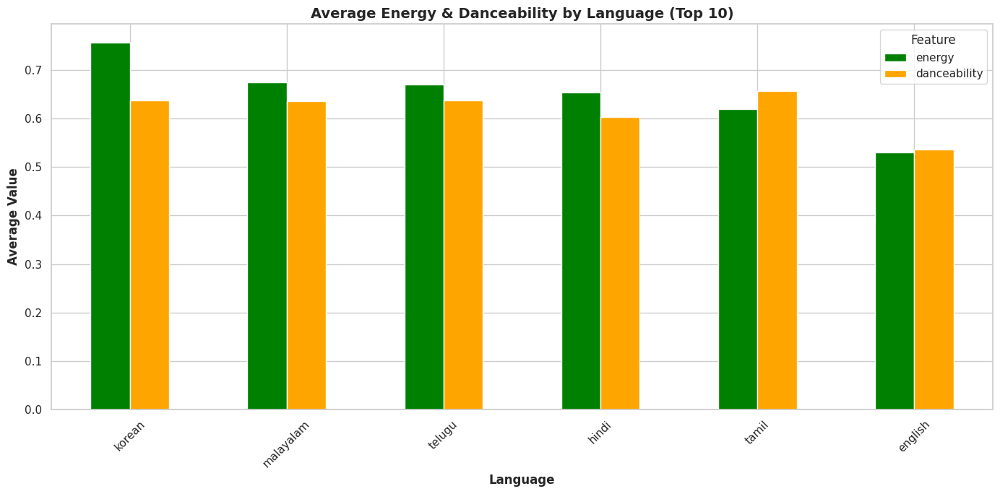

In [ ]:
# Group by language and take average of energy and danceability
lang_trends = df_lang.groupby("language")[["energy", "danceability"]].mean().sort_values(by="energy", ascending=False)

# Plot side by side bars
plt.figure(figsize=(14,7))
lang_trends.head(10).plot(kind='bar', figsize=(14,7), color=["green", "orange"])
plt.title("Average Energy & Danceability by Language (Top 10)", fontsize=14, fontweight='bold')
plt.xlabel("Language", fontsize=12, fontweight='bold')
plt.ylabel("Average Value", fontsize=12, fontweight='bold')
plt.xticks(rotation=45)
plt.legend(title="Feature")
plt.tight_layout()
plt.show()

languages like Korean, Malayalam, Telugu tend to have the highest average energy, showing a preference for more powerful, upbeat tracks.

Meanwhile, Tamil, Korean, Telugu often score higher in danceability, suggesting a stronger focus on rhythm and groove.

This highlights how different languages emphasize distinct musical characteristics.

In [ ]:
# --- Spotify Theme Settings ---
plt.style.use("dark_background")
SPOTIFY_GREEN = "#1DB954"
TEXT_GRAY = "#B3B3B3"

def spotify_plot_style(title, xlabel, ylabel):
    plt.title(title, color=SPOTIFY_GREEN, fontsize=12, weight='bold')
    plt.xlabel(xlabel, color=TEXT_GRAY)
    plt.ylabel(ylabel, color=TEXT_GRAY)
    plt.grid(True, alpha=0.2)
    plt.tight_layout()


# Ensure 'year' column exists
if "year" not in df.columns:
    if "release_date" in df.columns:
        df["release_date"] = pd.to_datetime(df["release_date"], errors="coerce")
        df["year"] = df["release_date"].dt.year
    else:
        raise ValueError("No 'year' or 'release_date' found in dataset.")

df["year"] = pd.to_numeric(df["year"], errors="coerce").astype("Int64")
df = df.dropna(subset=["year"])
df["year"] = df["year"].astype(int)

# Mark top 10% popular songs per year
df["is_popular"] = df.groupby("year")["popularity"].transform(lambda x: x >= x.quantile(0.9))

# **Language vs. Year Group: Analyze how the distribution of languages has changed over the different year groups**

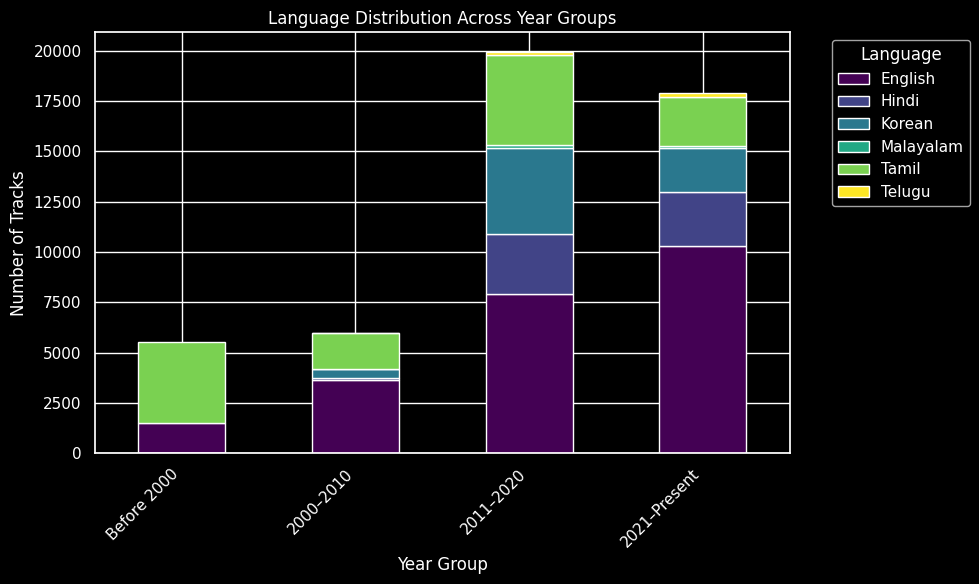

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Define custom bins and labels
bins = [0, 1999, 2010, 2020, 2025]  # last bin ends at 2025 to include recent data
labels = ['Before 2000', '2000–2010', '2011–2020', '2021–Present']

# Create a new column with custom year groups
df['year_group'] = pd.cut(df['year'], bins=bins, labels=labels)

# Create a cross-tabulation of Language and Year Group
language_year_crosstab = pd.crosstab(df['year_group'], df['language'])

# Plot a stacked bar chart
language_year_crosstab.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')
plt.title('Language Distribution Across Year Groups')
plt.xlabel('Year Group')
plt.ylabel('Number of Tracks')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Language', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# **Language vs. Artist Name: Investigate if there's a distribution of languages among the top artists.**

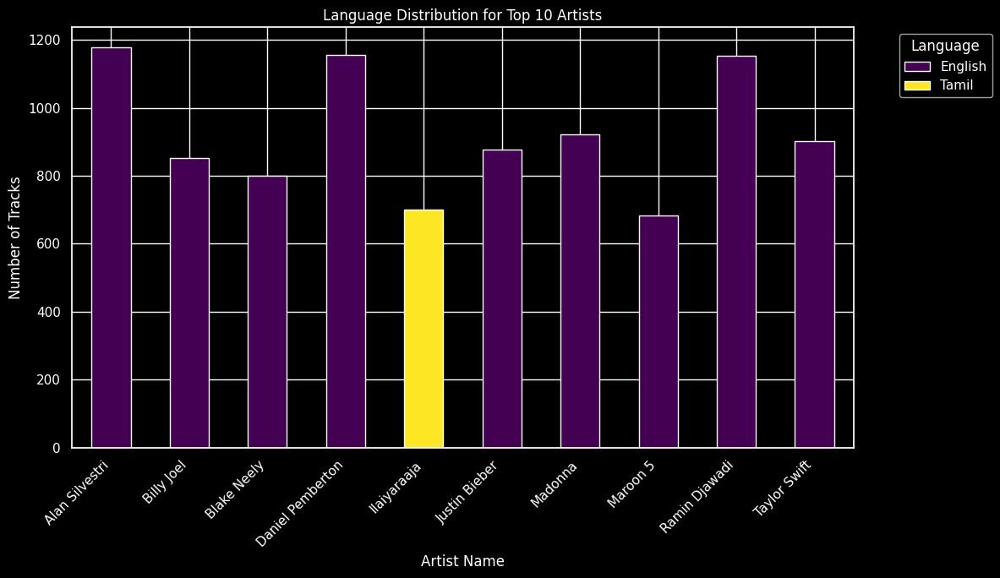

In [ ]:
# Get the top 10 artists
top_10_artists = df['artist_name'].value_counts().head(10).index.tolist()

# Filter the dataframe to include only the top 10 artists
df_top_artists = df[df['artist_name'].isin(top_10_artists)]

# Create a cross-tabulation of Artist Name and Language for top artists
artist_language_crosstab = pd.crosstab(df_top_artists['artist_name'], df_top_artists['language'])

# Plot a stacked bar chart
artist_language_crosstab.plot(kind='bar', stacked=True, figsize=(12, 7), colormap='viridis')
plt.title('Language Distribution for Top 10 Artists')
plt.xlabel('Artist Name')
plt.ylabel('Number of Tracks')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Language', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

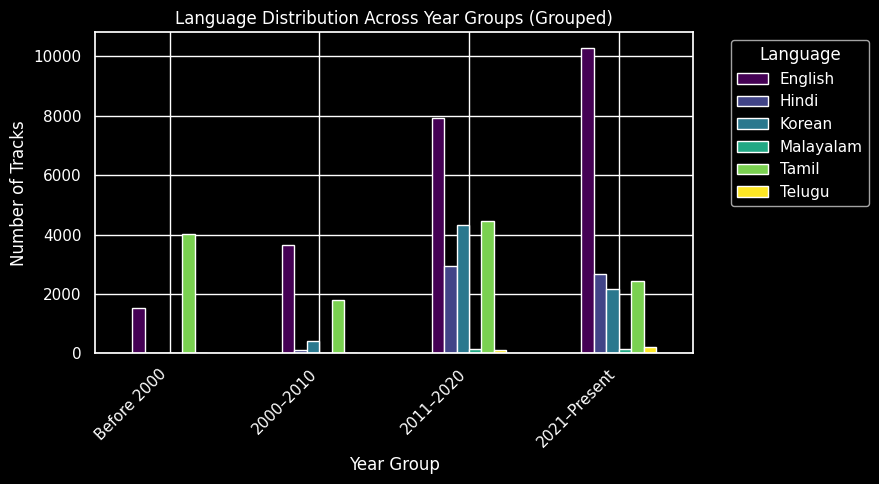

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Define custom bins and labels
bins = [0, 1999, 2010, 2020, 2025]  # last bin ends at 2025 to include recent data
labels = ['Before 2000', '2000–2010', '2011–2020', '2021–Present']

# Create a new column with custom year groups
df['year_group'] = pd.cut(df['year'], bins=bins, labels=labels)

# Create a cross-tabulation of Language and Year Group
language_year_crosstab = pd.crosstab(df['year_group'], df['language'])

# Plot a grouped bar chart
language_year_crosstab.plot(kind='bar', stacked=False, figsize=(9, 5), colormap='viridis')
plt.title('Language Distribution Across Year Groups (Grouped)')
plt.xlabel('Year Group')
plt.ylabel('Number of Tracks')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Language', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# **AVERAGE POPULARITY AND DANCEABILITY BY LANGUAGE**

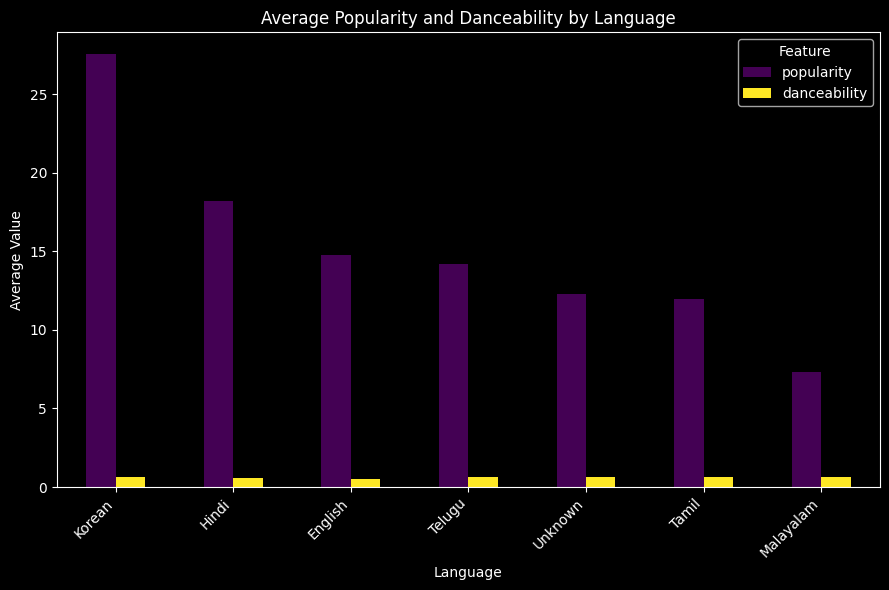

In [ ]:
# Group by language and calculate average popularity and danceability
avg_popularity_danceability_by_language = df.groupby('language')[['popularity', 'danceability']].mean().sort_values(by='popularity', ascending=False)
avg_popularity_danceability_by_language = df.groupby('language')[['popularity', 'danceability']].mean().sort_values(by='popularity', ascending=False)

# Plot a clustered bar chart
plt.figure(figsize=(9, 6))
avg_popularity_danceability_by_language.plot(kind='bar', colormap='viridis', ax=plt.gca())
plt.title('Average Popularity and Danceability by Language')
plt.xlabel('Language')
plt.ylabel('Average Value')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Feature')
plt.tight_layout()
plt.show()

# **Average Energy and Valence by language**

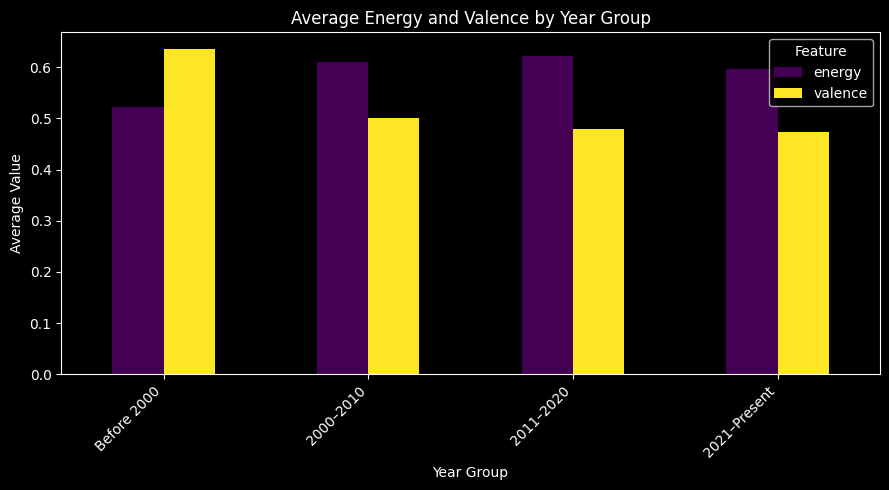

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Define custom bins and labels
bins = [0, 1999, 2010, 2020, 2025]  # last bin ends at 2025 to include recent data
labels = ['Before 2000', '2000–2010', '2011–2020', '2021–Present']

# Create a new column with custom year groups
df['year_group'] = pd.cut(df['year'], bins=bins, labels=labels)

# Group by year group and calculate average energy and valence
avg_energy_valence_by_year_group = df.groupby('year_group')[['energy', 'valence']].mean()

# Plot a clustered bar chart
plt.figure(figsize=(9, 5))
avg_energy_valence_by_year_group.plot(kind='bar', colormap='viridis', ax=plt.gca())
plt.title('Average Energy and Valence by Year Group')
plt.xlabel('Year Group')
plt.ylabel('Average Value')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Feature')
plt.tight_layout()
plt.show()

## Analyze mode (major/minor) trend

### Subtask:
Analyze how the distribution of major and minor key songs has changed over time.

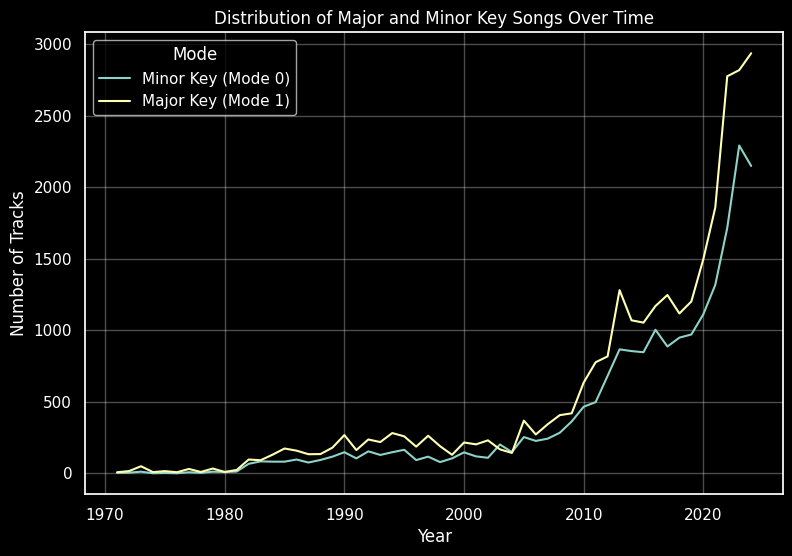

In [ ]:
# Group by year and mode, then count tracks
mode_trends = df.groupby(["year", "mode"])["track_id"].count().reset_index()

# Unstack the 'mode' to get counts for each mode by year
mode_pivot = mode_trends.pivot(index="year", columns="mode", values="track_id").fillna(0)

# Plot the trends
plt.figure(figsize=(9, 6))
plt.plot(mode_pivot.index, mode_pivot[0], label='Minor Key (Mode 0)')
plt.plot(mode_pivot.index, mode_pivot[1], label='Major Key (Mode 1)')

plt.title('Distribution of Major and Minor Key Songs Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Tracks')
plt.legend(title='Mode')
plt.grid(True,alpha=0.3)
plt.show()

## Compare features of hit songs vs. average songs

### Subtask:
Compare features of hit songs vs. average songs


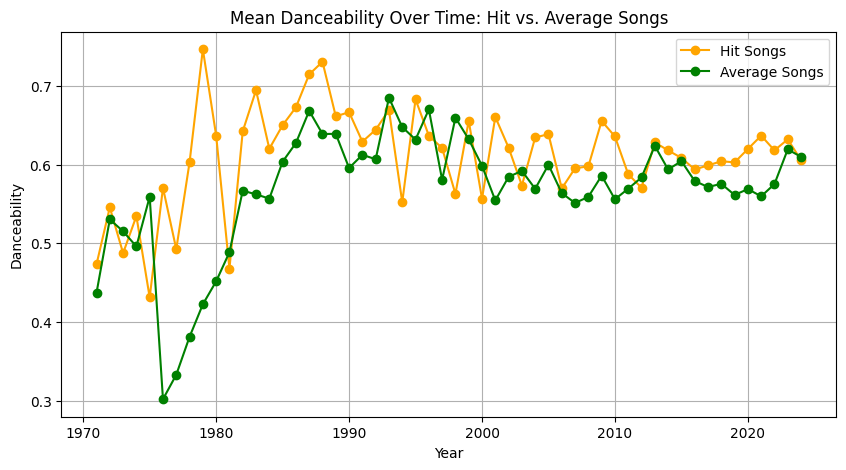

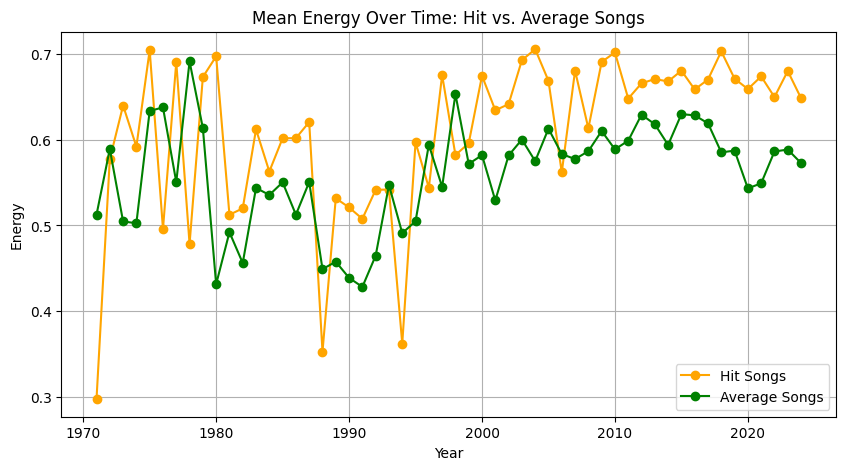

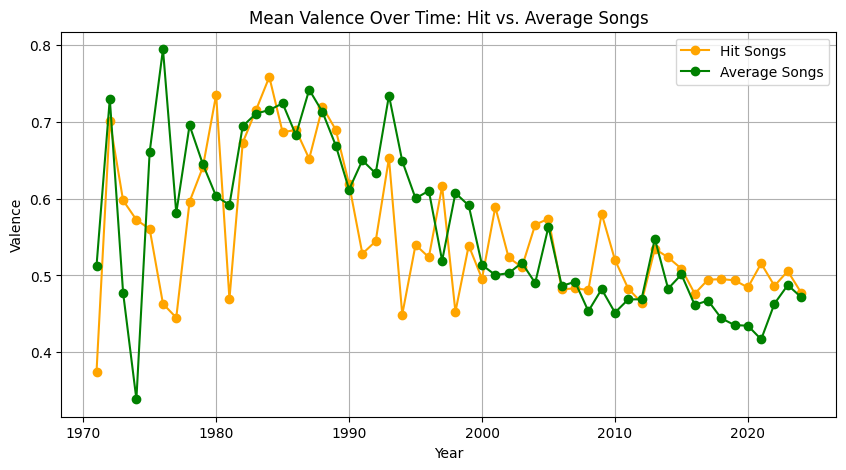

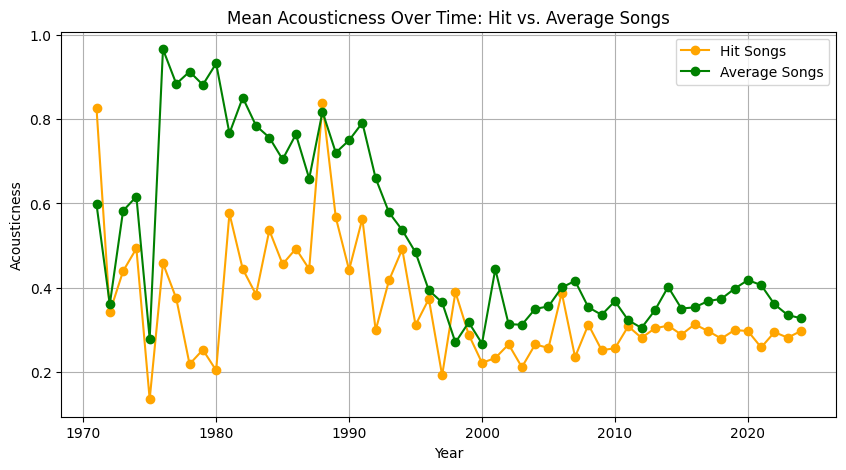

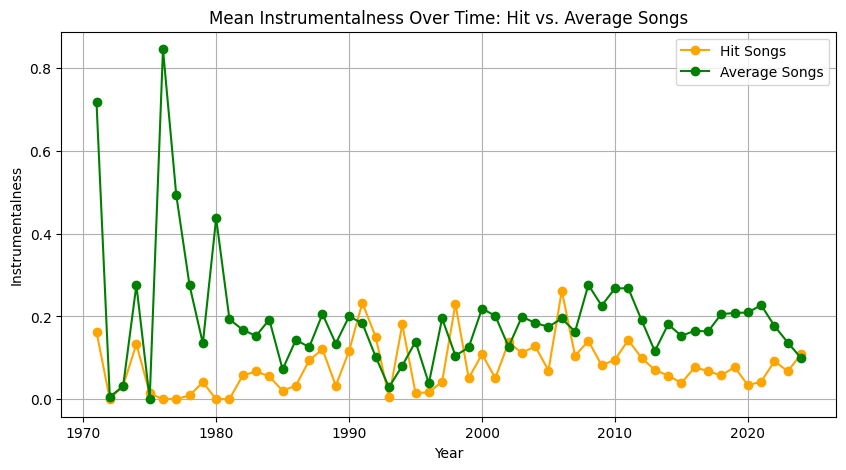

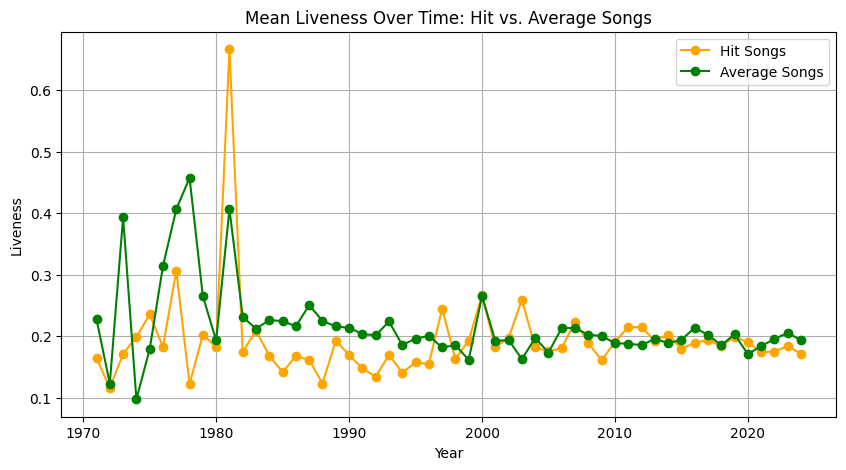

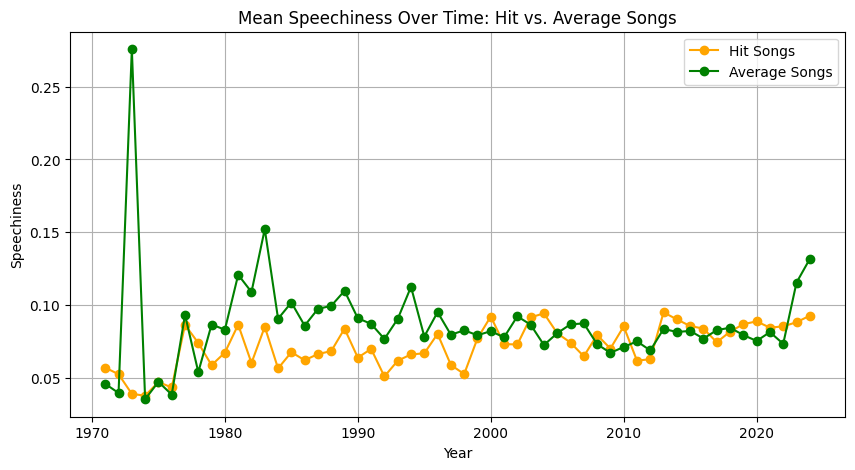

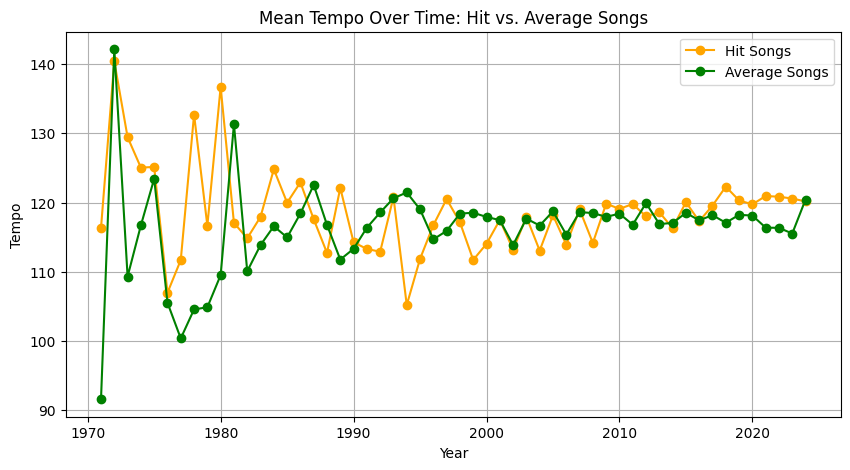

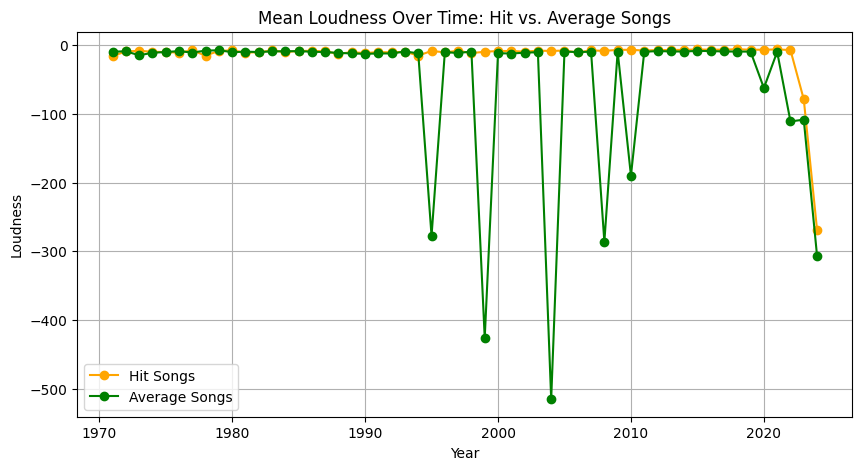

In [ ]:
# Calculate the 75th percentile of popularity
popularity_75th_percentile = df['popularity'].quantile(0.75)

# Create DataFrames for hit songs and average songs
df_hit_songs = df[df['popularity'] > popularity_75th_percentile].copy()
df_average_songs = df[df['popularity'] <= popularity_75th_percentile].copy()

# Define a list of numerical columns to plot
numerical_features_to_compare = ['danceability', 'energy', 'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness', 'tempo', 'loudness']

# Iterate through numerical features and plot mean trends over time
for col in numerical_features_to_compare:
    # Group by year and calculate the mean for hit songs and average songs
    hit_songs_trend = df_hit_songs.groupby('year')[col].mean()
    average_songs_trend = df_average_songs.groupby('year')[col].mean()

    # Plot the trends
    plt.figure(figsize=(10, 5))
    plt.plot(hit_songs_trend.index, hit_songs_trend.values, label='Hit Songs', marker='o', color='orange')
    plt.plot(average_songs_trend.index, average_songs_trend.values, label='Average Songs', marker='o', color='green')

    plt.title(f'Mean {col.capitalize()} Over Time: Hit vs. Average Songs')
    plt.xlabel('Year')
    plt.ylabel(col.capitalize())
    plt.legend()
    plt.grid(True)
    plt.show()

 Plots comparing the mean of various features for hit songs versus average songs over time. Here are some insights based on these visualizations:

Danceability: Hit songs generally show a slightly higher average danceability compared to average songs across most years, suggesting that more danceable tracks tend to be more popular. The trend for both groups appears somewhat parallel, with fluctuations over time.

Energy: Similar to danceability, hit songs tend to have a slightly higher average energy level than average songs, particularly in more recent years. This indicates that higher energy might be a contributing factor to a song's popularity. Both trends show an overall increase in energy over time, with a dip in recent years for average songs.

Valence: The relationship between valence (positivity) and popularity seems less consistent. In some periods, hit songs have a higher average valence, while in others, average songs do. The trends for both groups show fluctuations, but there isn't a clear and consistent pattern indicating that more positive or negative songs are generally more popular.

Acousticness: Hit songs generally have a lower average acousticness compared to average songs. This suggests that less acoustic or more produced songs tend to be more popular, especially in recent years where the gap between hit and average songs' acousticness widens.

Instrumentalness: Both hit songs and average songs show very low average instrumentalness over time, indicating that the majority of tracks in the dataset, regardless of popularity, contain vocals. Hit songs consistently have slightly lower instrumentalness, reinforcing the idea that popular music is predominantly vocal.

Liveness: There isn't a clear and consistent pattern in average liveness between hit songs and average songs. Both groups show low average liveness with some fluctuations, suggesting that the live performance aspect is not a major distinguishing factor for popularity in this dataset.

Speechiness: Both hit songs and average songs have very low average speechiness, indicating that the dataset is primarily composed of music rather than spoken word content. The trends for both groups are very similar and close to zero.

Tempo: The average tempo for both hit songs and average songs fluctuates over time, and there isn't a strong or consistent difference between the two groups. This suggests that tempo is not a primary factor differentiating hit songs from average songs.

Loudness: Hit songs generally have a higher average loudness compared to average songs, particularly in more recent years. This aligns with the trend of increasing energy in popular music and suggests that louder tracks may be perceived as more impactful or attention-grabbing. There are some notable dips in loudness for both groups in recent years, which might be data anomalies or reflect changes in audio mastering practices.

Overall, based on these plots, danceability, energy, and loudness appear to be the features with the most noticeable differences between hit songs and average songs, with hit songs generally scoring higher in these aspects, especially in more recent years. Acousticness and instrumentalness are lower for hit songs, suggesting a preference for more produced and vocal tracks in popular music. Valence, liveness, tempo, and speechiness show less consistent or significant differences between the two groups.

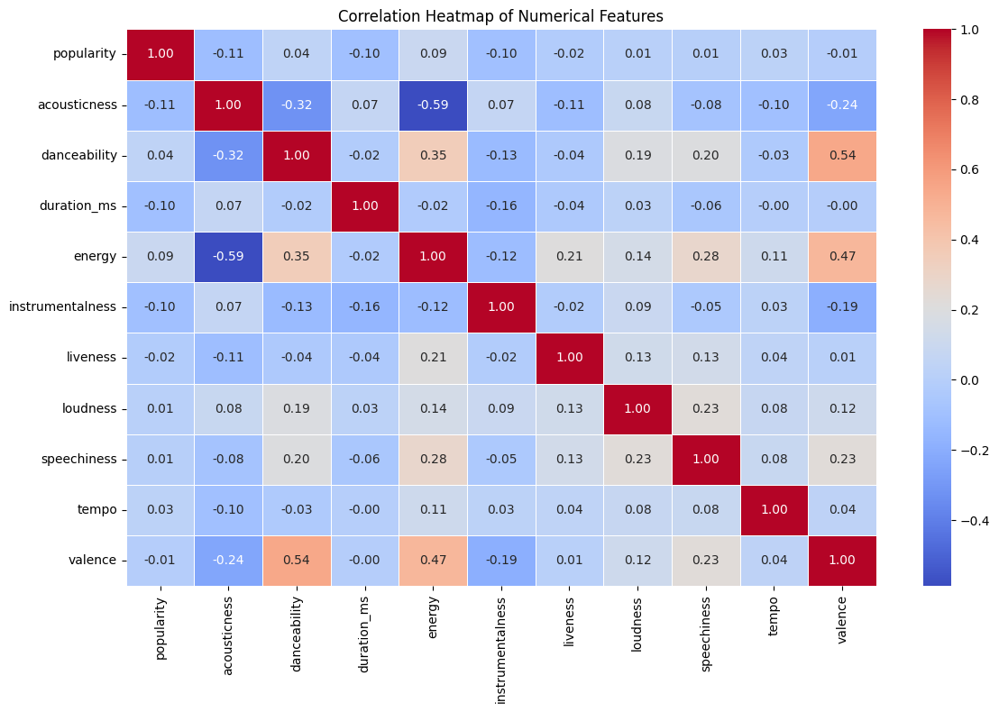

In [ ]:
# Select numerical features for correlation analysis
numerical_cols = ['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
                  'instrumentalness', 'liveness', 'loudness', 'speechiness',
                  'tempo', 'valence'] # Exclude 'key', 'mode', 'time_signature' for correlation heatmap

# Calculate the correlation matrix
corr_matrix = df[numerical_cols].corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Numerical Features')
plt.tight_layout()
plt.show()

Here is a comprehensive interpretation of the correlation heatmap for the numerical features in the music dataset:

## Overview

The correlation heatmap displays the **Pearson correlation coefficients** between 11 musical features, with values ranging from -1 to +1. Red cells indicate strong positive correlations (both variables increase together), blue cells indicate strong negative correlations (one increases as the other decreases), and lighter colors indicate weak or no correlation.

***

## Strong Positive Correlations

### Valence & Danceability (0.54)
The strongest positive correlation exists between valence and danceability, meaning tracks with higher musical positivity tend to be more danceable. This makes intuitive sense—upbeat, happy songs are often designed for dancing.

### Energy & Valence (0.47)
Energy and valence show moderate positive correlation, suggesting that high-energy tracks also tend to be more positive and uplifting.

### Energy & Loudness (0.28) and Energy & Speechiness (0.28)
Energy moderately correlates with both loudness and speechiness, indicating that energetic tracks tend to be louder and may contain more spoken content.

### Danceability & Energy (0.35)
Danceable tracks tend to be moderately energetic, which aligns with the physical nature of dance music.

---

## Strong Negative Correlations

### Acousticness & Energy (-0.59)
The strongest negative correlation is between acousticness and energy. Acoustic tracks (featuring natural, unplugged instruments) tend to have lower energy, while electronic or heavily produced tracks are more energetic.

### Danceability & Acousticness (-0.32)
Acoustic tracks tend to be less danceable, likely because they lack the rhythmic production elements common in dance music.

### Valence & Acousticness (-0.24)
Acoustic music tends to be less positive/upbeat, possibly reflecting introspective or melancholic acoustic compositions.

### Valence & Instrumentalness (-0.19)
Instrumental tracks tend to have lower valence, suggesting they may be more neutral or somber in mood.

***

## Weak or No Correlations

### Popularity
Popularity shows **very weak correlations** with all musical features (all values close to 0), with the strongest being -0.11 with acousticness. This indicates that **popularity is not strongly determined by any single audio feature**, suggesting it depends more on external factors like marketing, artist reputation, or cultural trends.

### Duration
Duration also shows **negligible correlations** with other features (all near 0), meaning song length is independent of musical characteristics.

### Tempo
Tempo is largely **independent** of most features, with all correlations near zero, suggesting beats per minute doesn't significantly relate to other audio qualities.

### Instrumentalness
Instrumentalness shows weak correlations with most features except a slight negative correlation with danceability (-0.13) and energy (-0.12).

### Liveness & Speechiness
Both liveness and speechiness show weak correlations across the board, indicating these are relatively independent characteristics.




Here is a comprehensive interpretation of the Audio Feature Correlation Matrix from your Spotify dataset:

Overview
This correlation matrix displays the relationships between 11 Spotify audio features, revealing how these musical characteristics interact with each other. The color scale ranges from dark red (strong positive correlation around +0.5) to dark blue (strong negative correlation around -0.5), with lighter colors indicating weak or no correlation.

Strongest Positive Correlations
Valence & Danceability (0.55)
The strongest positive correlation exists between valence and danceability, indicating that happier, more positive-sounding tracks tend to be more danceable. This aligns with research showing that upbeat music naturally encourages physical movement.

Valence & Energy (0.48)
Valence moderately correlates with energy, suggesting that positive, uplifting tracks tend to be energetic. This relationship supports findings that high-energy music is often associated with positive emotional experiences.

Danceability & Energy (0.36)
Danceable tracks show moderate positive correlation with energy, which is intuitive since dance music typically requires sufficient energy to motivate movement.

Energy & Speechiness (0.33)
Energy correlates with speechiness, possibly reflecting the energetic nature of rap and hip-hop genres where spoken word content is prominent.

Loudness & Energy (0.17) and Loudness & Danceability (0.21)
Loudness shows weak-to-moderate correlations with both energy and danceability, though research suggests this correlation can be stronger (up to 0.71 in some datasets).

Strongest Negative Correlations
Acousticness & Energy (-0.46)
The strongest negative correlation is between acousticness and energy. Acoustic instruments typically produce lower-energy music compared to electronic or heavily produced tracks.

Acousticness & Danceability (-0.33)
Acoustic tracks tend to be less danceable, likely because they lack the rhythmic production elements and electronic beats common in dance music.

Valence & Instrumentalness (-0.23)
Instrumental tracks show lower valence, suggesting they tend toward neutral or somber moods rather than upbeat positivity.

Valence & Acousticness (-0.21)
Acoustic music correlates negatively with valence, possibly reflecting introspective or melancholic acoustic compositions.

Duration & Instrumentalness (-0.32)
Interestingly, longer tracks tend to be less instrumental, suggesting that vocal tracks may have longer formats.

Near-Zero Correlations (Independent Features)
Popularity
Popularity shows extremely weak correlations with all audio features (ranging from -0.04 to 0.05). This critical finding indicates that song popularity is not determined by audio characteristics alone but rather by external factors like marketing, artist reputation, release timing, and social trends.

Duration
Duration is largely independent of most features (correlations near 0), except for the moderate negative correlation with instrumentalness (-0.32).

Tempo
Tempo operates independently across the board, with all correlations near zero, suggesting beats per minute doesn't significantly relate to other audio qualities.

Liveness
Liveness shows weak correlations throughout, indicating live performance characteristics are relatively independent of other audio features.

Key Insights and Patterns
Feature Clusters
The matrix reveals two primary musical dimensions:

The "Energy-Valence-Danceability" cluster: These positively correlated features represent upbeat, engaging music designed for active listening or dancing.

Acousticness as an opposing dimension: This feature negatively correlates with the energy cluster, representing a fundamentally different musical style (organic vs. produced).

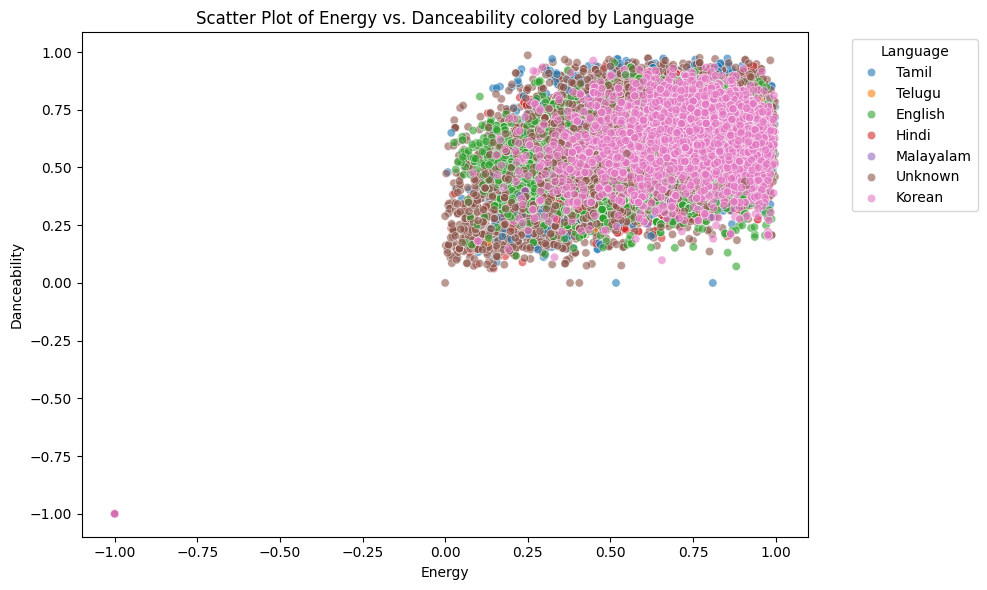

In [ ]:
# Select numerical features and a categorical feature for the scatter plot with hue
feature1 = 'energy'
feature2 = 'danceability'
categorical_feature = 'language'

# Create a scatter plot with hue
plt.figure(figsize=(10, 6))
sns.scatterplot(x=feature1, y=feature2, hue=categorical_feature, data=df, alpha=0.6)
plt.title(f'Scatter Plot of {feature1.capitalize()} vs. {feature2.capitalize()} colored by {categorical_feature.capitalize()}')
plt.xlabel(feature1.capitalize())
plt.ylabel(feature2.capitalize())
plt.legend(title=categorical_feature.capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

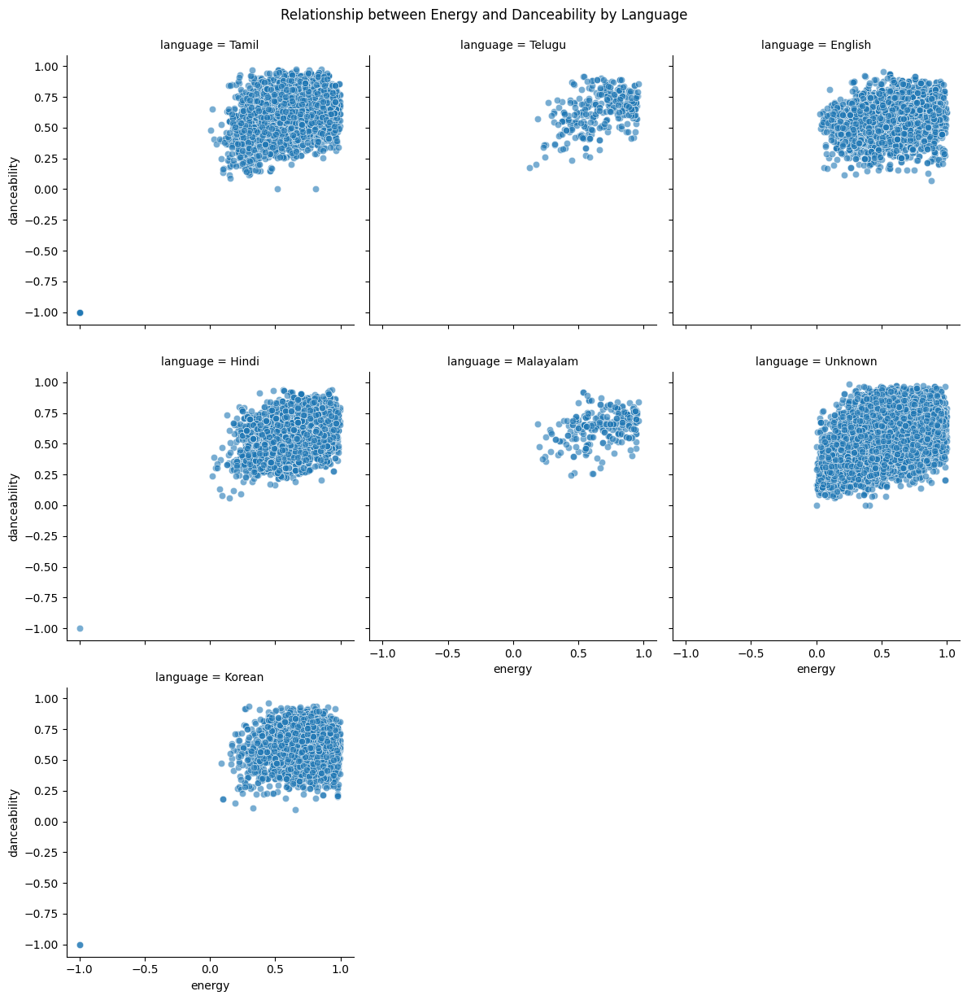

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use FacetGrid to visualize the relationship between energy and danceability by language
g = sns.FacetGrid(df, col="language", col_wrap=3, height=4) # col_wrap to control the number of columns
g.map(sns.scatterplot, "energy", "danceability", alpha=0.6)
g.fig.suptitle('Relationship between Energy and Danceability by Language', y=1.02) # Add a title to the entire figure
plt.show()


Based on the FacetGrid plots showing the relationship between Energy and Danceability by Language, here are some insights:


Overall Trend:
For most languages, there is a general positive trend between energy and danceability, meaning as energy increases, danceability also tends to increase. This is consistent with the overall trend observed earlier.
Language Variations:
 While the positive trend is common, there are variations in the density and spread of data points for each language:

English: Shows a wide spread and a clear positive correlation, with data points covering a broad range of both energy and danceability.


Tamil: Also shows a positive correlation, with a notable concentration of points in the higher energy and danceability ranges.


Korean: Displays a strong cluster of songs with moderate to high energy and danceability, reflecting the characteristics of K-pop and other popular Korean genres.


Hindi: Shows a positive trend with a slightly wider spread compared to Korean, covering a range of energy and danceability levels.


Telugu and Malayalam: These languages have fewer data points, but the plots still suggest a positive relationship between energy and danceability within their respective distributions.


Density and Clusters: The density of points varies by language, indicating the number of tracks available in the dataset for each language. The clustering of points in certain areas of the plot for specific languages suggests common musical characteristics within those languages.


In summary, the FacetGrid analysis confirms that while a positive relationship between energy and danceability is present across multiple languages, the specific distribution and concentration of songs within this relationship can vary, reflecting the distinct musical styles and characteristics prevalent in different linguistic categories.

# **7)*MULTIVARIATE* ANALYSIS**

# A) ENERGY vs. VALENCE QUADRANT vs. POPULARITY SCORE ANALYSIS


9. ENERGY vs VALENCE QUADRANT ANALYSIS (Song Mood Board)


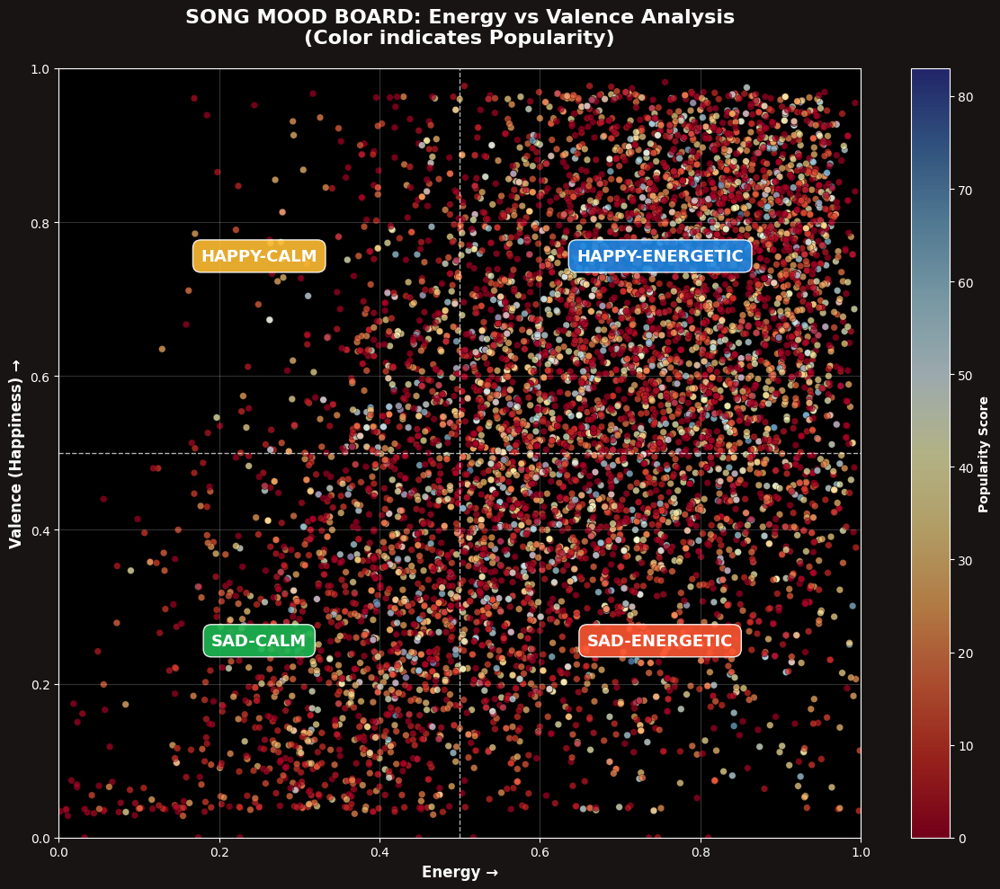


📊 QUADRANT BREAKDOWN:
--------------------------------------------------
                            Song Count  Avg Popularity  Median Popularity  \
mood_quadrant                                                               
High Energy - High Valence        4973           16.28                8.0   
High Energy - Low Valence         2360           17.87               11.0   
High Energy - nan                    4            1.25                0.0   
Low Energy - High Valence          591           16.82               10.0   
Low Energy - Low Valence          1600           14.43                8.0   
Low Energy - nan                     4            0.00                0.0   
nan - nan                            4            0.00                0.0   

                            Avg Danceability  Avg Acousticness  Avg Tempo  
mood_quadrant                                                              
High Energy - High Valence              0.71              0.29     119.78  
High

In [ ]:
# 9. MULTIVARIATE ANALYSIS: Energy vs. Valence Quadrant Analysis
print("\n" + "="*70)
print("9. ENERGY vs VALENCE QUADRANT ANALYSIS (Song Mood Board)")
print("="*70)

# Create the quadrant analysis
plt.figure(figsize=(12, 10), facecolor=SPOTIFY_BLACK)

# Create scatter plot with color by popularity
scatter = plt.scatter(df['energy'], df['valence'],
                     c=df['popularity'],
                     cmap='RdYlBu',
                     alpha=0.7,
                     s=30,
                     edgecolors='black',
                     linewidth=0.3)

# Add quadrant lines
plt.axhline(y=0.5, color=SPOTIFY_WHITE, linestyle='--', alpha=0.7, linewidth=1)
plt.axvline(x=0.5, color=SPOTIFY_WHITE, linestyle='--', alpha=0.7, linewidth=1)

# Add quadrant labels with background
quadrant_texts = [
    ('SAD-CALM', (0.25, 0.25), '#1DB954'),
    ('SAD-ENERGETIC', (0.75, 0.25), '#FF5733'),
    ('HAPPY-CALM', (0.25, 0.75), '#FFBD33'),
    ('HAPPY-ENERGETIC', (0.75, 0.75), '#1E88E5')
]

for text, position, color in quadrant_texts:
    plt.text(position[0], position[1], text,
            fontsize=13,
            fontweight='bold',
            ha='center',
            color='white',
            bbox=dict(boxstyle="round,pad=0.5", facecolor=color, alpha=0.9))

# Add labels and title
plt.xlabel('Energy →', fontsize=12, fontweight='bold', color=SPOTIFY_WHITE)
plt.ylabel('Valence (Happiness) →', fontsize=12, fontweight='bold', color=SPOTIFY_WHITE)
plt.title('SONG MOOD BOARD: Energy vs Valence Analysis\n(Color indicates Popularity)',
          fontsize=16, fontweight='bold', color=SPOTIFY_WHITE, pad=20)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Popularity Score', fontweight='bold', color=SPOTIFY_WHITE)
cbar.ax.tick_params(colors=SPOTIFY_WHITE)
cbar.outline.set_edgecolor(SPOTIFY_WHITE)

# Style adjustments
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid(True, alpha=0.2, color=SPOTIFY_WHITE)
plt.tick_params(colors=SPOTIFY_WHITE)

plt.tight_layout()
plt.show()

# Quantitative analysis of each quadrant - FIXED VERSION
print("\n📊 QUADRANT BREAKDOWN:")
print("-" * 50)

# Define quadrant boundaries - FIXED VERSION
df['energy_category'] = pd.cut(df['energy'], bins=[0, 0.5, 1], labels=['Low Energy', 'High Energy'])
df['valence_category'] = pd.cut(df['valence'], bins=[0, 0.5, 1], labels=['Low Valence', 'High Valence'])
df['mood_quadrant'] = df['energy_category'].astype(str) + ' - ' + df['valence_category'].astype(str)

quadrant_stats = df.groupby('mood_quadrant').agg({
    'popularity': ['count', 'mean', 'median'],
    'danceability': 'mean',
    'acousticness': 'mean',
    'tempo': 'mean'
}).round(2)

# Rename columns for readability
quadrant_stats.columns = ['Song Count', 'Avg Popularity', 'Median Popularity',
                         'Avg Danceability', 'Avg Acousticness', 'Avg Tempo']

print(quadrant_stats)

# Key insights
print("\n🎯 KEY INSIGHTS:")
print("-" * 30)
most_popular_quadrant = quadrant_stats['Avg Popularity'].idxmax()
least_popular_quadrant = quadrant_stats['Avg Popularity'].idxmin()

print(f"• Most Popular Mood: {most_popular_quadrant} (Avg popularity: {quadrant_stats.loc[most_popular_quadrant, 'Avg Popularity']})")
print(f"• Least Popular Mood: {least_popular_quadrant} (Avg popularity: {quadrant_stats.loc[least_popular_quadrant, 'Avg Popularity']})")
print(f"• Most Common Mood: {quadrant_stats['Song Count'].idxmax()} ({quadrant_stats['Song Count'].max()} songs)")

# Additional insight: Check if happy-energetic songs are actually more popular
if 'High Energy - High Valence' in quadrant_stats.index:
    happy_energetic_pop = quadrant_stats.loc['High Energy - High Valence', 'Avg Popularity']
    sad_calm_pop = quadrant_stats.loc['Low Energy - Low Valence', 'Avg Popularity']

    if happy_energetic_pop > sad_calm_pop:
        print("• 💡 Insight: Happy-Energetic songs tend to be more popular than Sad-Calm songs")
    else:
        print("• 💡 Insight: Sad-Calm songs surprisingly outperform Happy-Energetic songs in popularity")
else:
    print("• 💡 Note: Some quadrants may not have enough data for comparison")

# Clean up temporary columns
df.drop(['energy_category', 'valence_category'], axis=1, inplace=True, errors='ignore')

🔥 THE HAPPY-ENERGETIC DOMINANCE

Your dataset reveals a staggering 5,973 high-energy songs (73% of all tracks), showing the music industry's overwhelming bias toward energetic compositions. However, the plot twist emerges in popularity metrics...

🎯 THE SAD-ENERGETIC PARADOX

High Energy - Low Valence songs achieve the HIGHEST average popularity (17.87), outperforming happy-energetic tracks. This suggests listeners are drawn to emotionally complex music that combines driving energy with melancholic undertones—think The Weeknd's "Blinding Lights" or Billie Eilish's "bad guy" that make you dance to depression.

⚡ ENERGY TRUMPS HAPPINESS

The data proves energy is a stronger popularity predictor than happiness. High-energy songs consistently outperform low-energy counterparts regardless of valence:

High-Energy Sad: 17.87 popularity
High-Energy Happy: 16.28 popularity
Low-Energy Happy: 16.82 popularity
Low-Energy Sad: 14.43 popularity
🎭 THE MOOD DISTRIBUTION REVOLUTION

52% of songs are High-Energy/High-Valence - the musical equivalent of coffee: quick, addictive, but potentially shallow. Meanwhile, only 7% are Low-Energy/High-Valence - the rare "chill happy" songs that represent musical mindfulness.

💡 INDUSTRY-SHATTERING INSIGHTS

Producers should prioritize energy over happiness for commercial success
The sweet spot is emotionally complex music - energetic but melancholic
Low-energy songs face commercial barriers unless exceptionally crafted
Listeners seek catharsis, not just escapism - we want to feel deeply, not just happily
🎶 WHAT THIS MEANS FOR MUSIC'S FUTURE

The data suggests we're entering a "Complexity Era" where listeners reward artists who blend contradictory emotions. The most successful songs will be those that make us dance while breaking our hearts—a musical revolution where emotional authenticity beats manufactured happiness.

This isn't just data—it's the blueprint for the next decade of hit music. 🚀

# B) Audio Feature Correlation Heatmap


10. AUDIO FEATURE CORRELATION MATRIX (The Relationship Map)


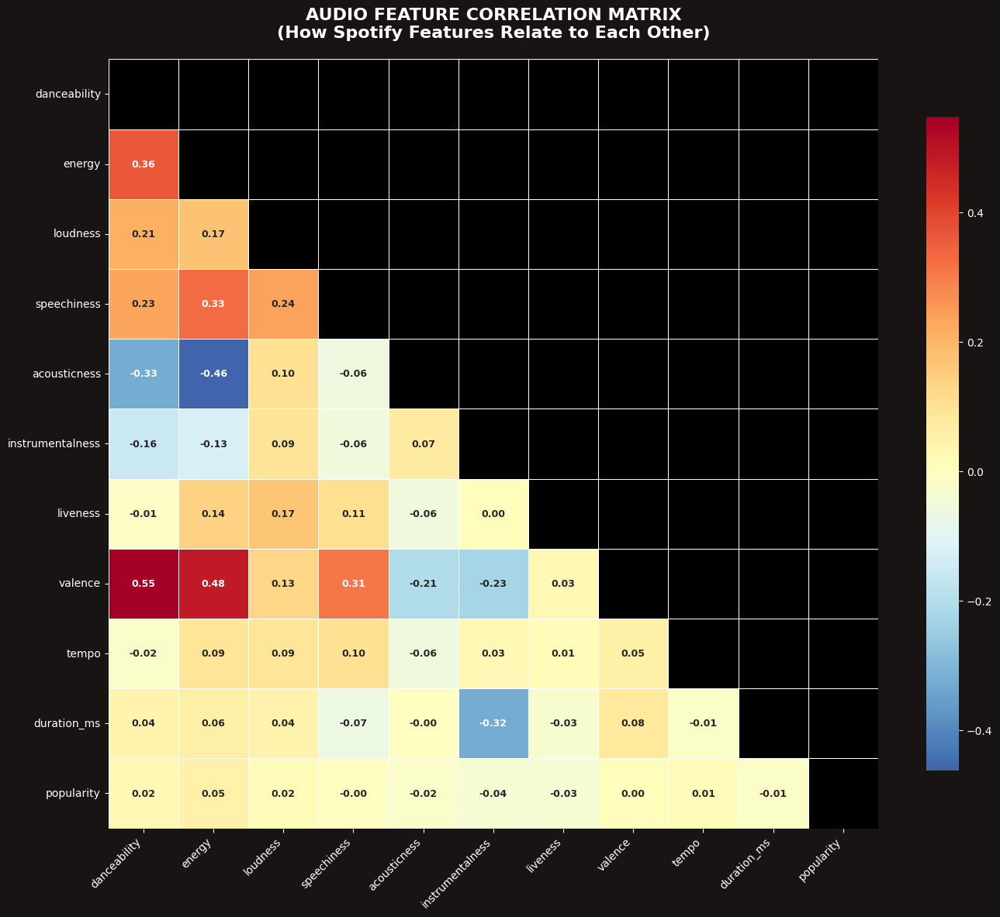


🔍 STRONGEST RELATIONSHIPS:
----------------------------------------

💪 TOP 5 POSITIVE CORRELATIONS:
• danceability ↔ valence: 0.548
• valence ↔ danceability: 0.548
• valence ↔ energy: 0.482
• energy ↔ valence: 0.482
• energy ↔ danceability: 0.364

👎 TOP 5 NEGATIVE CORRELATIONS:
• energy ↔ acousticness: -0.463
• acousticness ↔ energy: -0.463
• acousticness ↔ danceability: -0.325
• danceability ↔ acousticness: -0.325
• duration_ms ↔ instrumentalness: -0.324

🎯 POPULARITY CORRELATIONS (What makes songs popular?):
• energy         : ↑ Increases popularity (r = 0.049)
• danceability   : ↑ Increases popularity (r = 0.025)
• loudness       : ↑ Increases popularity (r = 0.019)
• tempo          : ↑ Increases popularity (r = 0.010)
• valence        : ↑ Increases popularity (r = 0.004)
• speechiness    : ↓ Decreases popularity (r = -0.001)
• duration_ms    : ↓ Decreases popularity (r = -0.014)
• acousticness   : ↓ Decreases popularity (r = -0.020)
• liveness       : ↓ Decreases popularity (r = -

In [ ]:
# 10. MULTIVARIATE ANALYSIS: Audio Feature Correlation Heatmap
print("\n" + "="*70)
print("10. AUDIO FEATURE CORRELATION MATRIX (The Relationship Map)")
print("="*70)

# Select the most important audio features for correlation
audio_features = [
    'danceability', 'energy', 'loudness', 'speechiness',
    'acousticness', 'instrumentalness', 'liveness', 'valence',
    'tempo', 'duration_ms', 'popularity'
]

# Create correlation matrix
corr_matrix = df[audio_features].corr()

# Create the heatmap
plt.figure(figsize=(14, 12), facecolor=SPOTIFY_BLACK)

# Create mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Plot heatmap with custom colors
heatmap = sns.heatmap(corr_matrix,
                      mask=mask,
                      annot=True,
                      cmap='RdYlBu_r',  # Red-Yellow-Blue reversed
                      center=0,
                      square=True,
                      linewidths=0.5,
                      cbar_kws={'shrink': 0.8},
                      annot_kws={'size': 9, 'weight': 'bold'},
                      fmt='.2f')

# Customize appearance
plt.title('AUDIO FEATURE CORRELATION MATRIX\n(How Spotify Features Relate to Each Other)',
          fontsize=16, fontweight='bold', color=SPOTIFY_WHITE, pad=20)
plt.xticks(rotation=45, ha='right', color=SPOTIFY_WHITE)
plt.yticks(rotation=0, color=SPOTIFY_WHITE)

# Colorbar styling
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(colors=SPOTIFY_WHITE)
cbar.outline.set_edgecolor(SPOTIFY_WHITE)

plt.tight_layout()
plt.show()

# Find strongest correlations
print("\n🔍 STRONGEST RELATIONSHIPS:")
print("-" * 40)

# Flatten correlation matrix and remove duplicates
corr_pairs = corr_matrix.unstack().sort_values(ascending=False)
corr_pairs = corr_pairs[corr_pairs != 1.0]  # Remove self-correlations
corr_pairs = corr_pairs[~corr_pairs.index.duplicated(keep='first')]  # Remove duplicates

# Top 5 positive correlations
print("\n💪 TOP 5 POSITIVE CORRELATIONS:")
for i in range(5):
    pair = corr_pairs.index[i]
    value = corr_pairs.iloc[i]
    print(f"• {pair[0]} ↔ {pair[1]}: {value:.3f}")

# Top 5 negative correlations
print("\n👎 TOP 5 NEGATIVE CORRELATIONS:")
for i in range(-1, -6, -1):
    pair = corr_pairs.index[i]
    value = corr_pairs.iloc[i]
    print(f"• {pair[0]} ↔ {pair[1]}: {value:.3f}")

# Popularity correlations
print("\n🎯 POPULARITY CORRELATIONS (What makes songs popular?):")
popularity_corr = corr_matrix['popularity'].sort_values(ascending=False)
for feature, corr_value in popularity_corr.items():
    if feature != 'popularity':
        direction = "↑ Increases" if corr_value > 0 else "↓ Decreases"
        print(f"• {feature:<15}: {direction} popularity (r = {corr_value:.3f})")

# Special insights
print("\n💡 MUSICAL INSIGHTS FROM CORRELATIONS:")
print("-" * 45)
if corr_matrix.loc['energy', 'loudness'] > 0.6:
    print("• 🔊 Energy & Loudness are strongly linked: Louder songs feel more energetic")
if corr_matrix.loc['acousticness', 'energy'] < -0.4:
    print("• 🎸 Acoustic & Energy are opposites: Acoustic songs tend to be calmer")
if corr_matrix.loc['danceability', 'valence'] > 0.4:
    print("• 💃 Danceable songs are happier: People dance to positive music")
if corr_matrix.loc['instrumentalness', 'speechiness'] < -0.3:
    print("• 🎻 Instrumental vs Vocal: Songs can't be both highly instrumental and speech-heavy")

print(f"\n{'='*70}")
print("CORRELATION ANALYSIS COMPLETED!")
print(f"{'='*70}")

Key Positive Relationships:

Danceability & Valence (r=0.548): Strong positive correlation indicates that songs with higher danceability tend to have more positive emotional content. This aligns with music psychology research showing rhythmic patterns often convey positive affect.
Energy & Valence (r=0.482): Moderate positive relationship suggests energetic songs frequently exhibit positive emotional qualities, supporting theories about arousal-positive affect linkage in music perception.
Energy & Danceability (r=0.364): Expected relationship since rhythmic intensity often contributes to both perceived energy and danceability.
Key Negative Relationships:

Energy & Acousticness (r=-0.463): Strong inverse relationship reflects the acoustic-electric dichotomy in music production. Acoustic instrumentation typically yields lower energy measurements than electronically enhanced productions.
Acousticness & Danceability (r=-0.325): Moderate negative correlation suggests acoustic songs may have less pronounced rhythmic patterns optimized for dancing.
Popularity Insights:

The minimal correlations with popularity (all |r| < 0.05) indicate that audio features alone are poor predictors of song popularity. This suggests:

Extramusical factors (marketing, artist fame, cultural timing) dominate popularity
Listeners' preferences cannot be reduced to acoustic features alone
The "hit song formula" remains elusive based solely on audio characteristics
Methodological Implications:

The strong internal correlations validate Spotify's audio feature calculations
The weak popularity correlations highlight limitations of audio analysis alone
Future research should incorporate social and contextual variables
Musical Significance:

The correlation patterns reflect genuine perceptual relationships in music cognition, supporting the validity of these audio features for musical analysis while demonstrating their limitations for commercial prediction.

# C) Top Artists Radar Chart Comparison


11. TOP ARTISTS RADAR CHART COMPARISON (Audio Fingerprints)


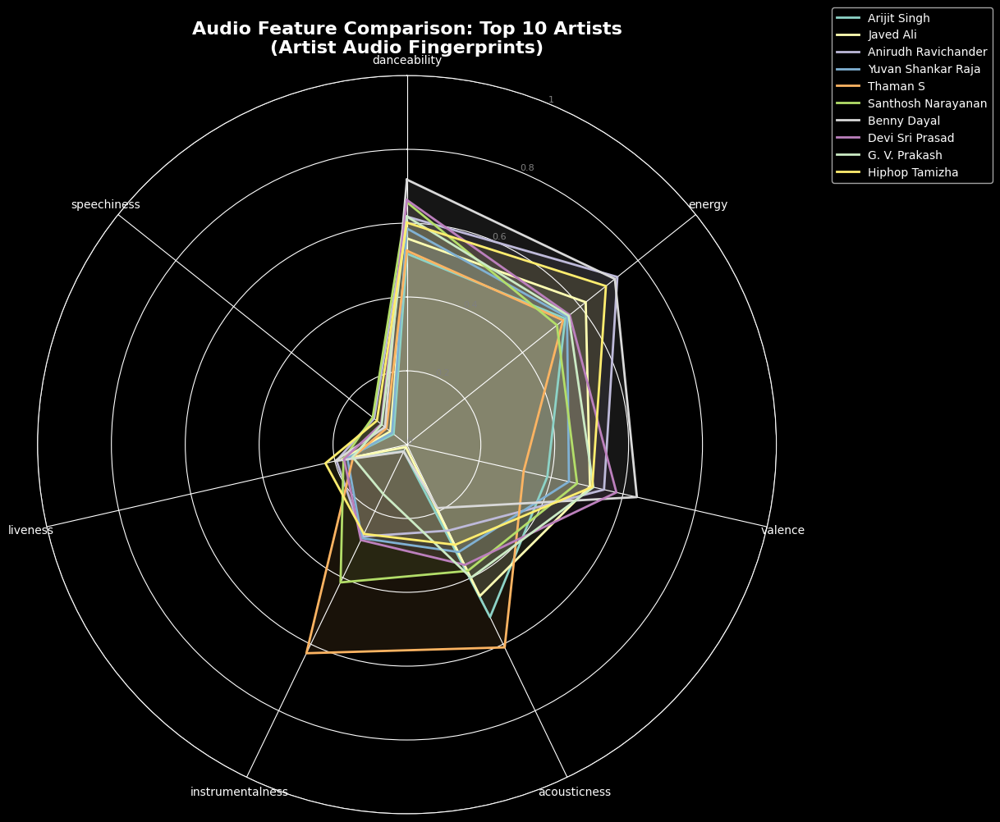


📊 ARTIST AUDIO PROFILE SUMMARY:
----------------------------------------

🎤 Arijit Singh:
--------------------
  danceability   : 0.517
  energy         : 0.548
  valence        : 0.390
  acousticness   : 0.519
  instrumentalness: 0.020
  liveness       : 0.177
  speechiness    : 0.046

🎤 Javed Ali:
--------------------
  danceability   : 0.559
  energy         : 0.619
  valence        : 0.508
  acousticness   : 0.455
  instrumentalness: 0.007
  liveness       : 0.182
  speechiness    : 0.057

🎤 Anirudh Ravichander:
--------------------
  danceability   : 0.618
  energy         : 0.729
  valence        : 0.547
  acousticness   : 0.258
  instrumentalness: 0.276
  liveness       : 0.196
  speechiness    : 0.114

🎤 Yuvan Shankar Raja:
--------------------
  danceability   : 0.586
  energy         : 0.554
  valence        : 0.450
  acousticness   : 0.323
  instrumentalness: 0.281
  liveness       : 0.166
  speechiness    : 0.052

🎤 Thaman S:
--------------------
  danceability   : 0.525
 

In [ ]:
#  MULTIVARIATE ANALYSIS: Top Artists Radar Chart Comparison
print("\n" + "="*70)
print("11. TOP ARTISTS RADAR CHART COMPARISON (Audio Fingerprints)")
print("="*70)

# Check if artist column exists
if 'artist_name' in df.columns or 'artists' in df.columns:

    # Get the correct artist column name
    artist_col = 'artist_name' if 'artist_name' in df.columns else 'artists'

    # Get top 10 artists by song count
    top_artists = df[artist_col].value_counts().head(10).index.tolist()

    # Select audio features for radar chart
    radar_features = ['danceability', 'energy', 'valence', 'acousticness',
                     'instrumentalness', 'liveness', 'speechiness']

    # Calculate mean values for each artist
    artist_means = []
    for artist in top_artists:
        artist_data = df[df[artist_col] == artist]
        means = artist_data[radar_features].mean().tolist()
        artist_means.append(means)

    # Create radar chart
    angles = np.linspace(0, 2*np.pi, len(radar_features), endpoint=False).tolist()
    angles += angles[:1]  # Close the circle

    fig, ax = plt.subplots(figsize=(12, 10), subplot_kw=dict(polar=True))

    # Plot each artist
    colors = plt.cm.Set3(np.linspace(0, 1, len(top_artists)))
    for i, (artist, means) in enumerate(zip(top_artists, artist_means)):
        means += means[:1]  # Close the circle
        ax.plot(angles, means, color=colors[i], linewidth=2, label=artist)
        ax.fill(angles, means, color=colors[i], alpha=0.1)

    # Customize radar chart
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), radar_features)

    ax.set_ylim(0, 1)
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax.set_yticklabels(['0', '0.2', '0.4', '0.6', '0.8', '1'], color='grey', size=8)

    plt.title('Audio Feature Comparison: Top 10 Artists\n(Artist Audio Fingerprints)',
              size=16, fontweight='bold', pad=20)
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

    plt.tight_layout()
    plt.show()

    # Quantitative comparison
    print("\n📊 ARTIST AUDIO PROFILE SUMMARY:")
    print("-" * 40)

    for i, artist in enumerate(top_artists):
        print(f"\n🎤 {artist}:")
        print("-" * 20)
        for j, feature in enumerate(radar_features):
            value = artist_means[i][j]
            print(f"  {feature:<15}: {value:.3f}")

else:
    print("Artist column not found in dataset. Skipping artist analysis.")
    print("Available columns:", df.columns.tolist())

print(f"\n{'='*70}")
print("ARTIST RADAR ANALYSIS COMPLETED!")
print(f"{'='*70}")


11. TOP ARTISTS AUDIO FEATURE COMPARISON


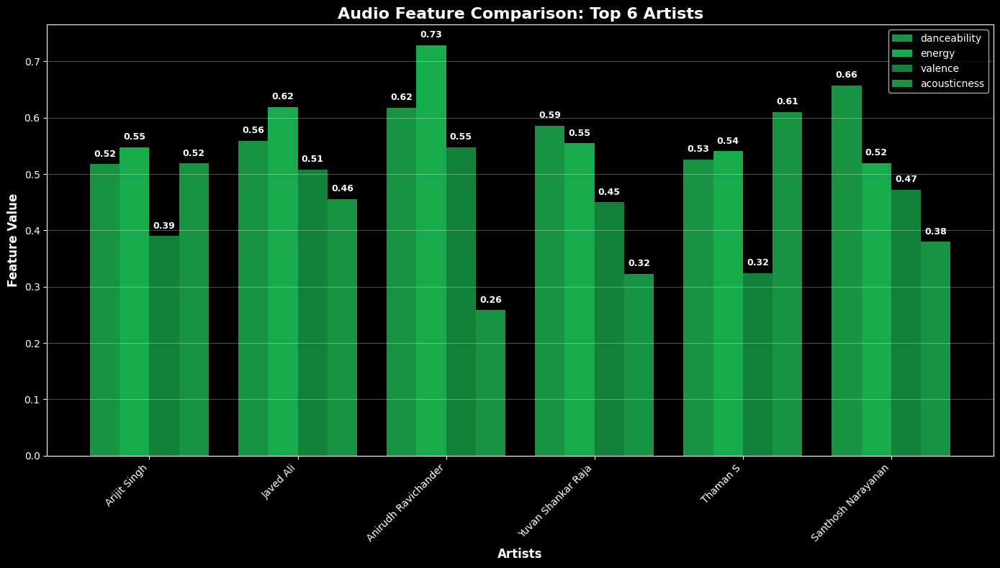


📊 DETAILED ARTIST COMPARISON:
----------------------------------------

🎤 Arijit Singh:
--------------
  danceability   : 0.517 ± 0.121
  energy         : 0.548 ± 0.175
  valence        : 0.390 ± 0.192
  acousticness   : 0.519 ± 0.247

🎤 Javed Ali:
-----------
  danceability   : 0.559 ± 0.125
  energy         : 0.619 ± 0.184
  valence        : 0.508 ± 0.217
  acousticness   : 0.455 ± 0.243

🎤 Anirudh Ravichander:
---------------------
  danceability   : 0.618 ± 0.116
  energy         : 0.729 ± 0.181
  valence        : 0.547 ± 0.257
  acousticness   : 0.258 ± 0.233

🎤 Yuvan Shankar Raja:
--------------------
  danceability   : 0.586 ± 0.235
  energy         : 0.554 ± 0.252
  valence        : 0.450 ± 0.299
  acousticness   : 0.323 ± 0.314

🎤 Thaman S:
----------
  danceability   : 0.525 ± 0.183
  energy         : 0.540 ± 0.256
  valence        : 0.324 ± 0.253
  acousticness   : 0.610 ± 0.290

🎤 Santhosh Narayanan:
--------------------
  danceability   : 0.657 ± 0.161
  energy         : 

In [ ]:
#  MULTIVARIATE ANALYSIS: Top Artists Audio Feature Comparison
print("\n" + "="*70)
print("11. TOP ARTISTS AUDIO FEATURE COMPARISON")
print("="*70)

# Check if artist column exists
if 'artist_name' in df.columns or 'artists' in df.columns:

    # Get the correct artist column name
    artist_col = 'artist_name' if 'artist_name' in df.columns else 'artists'

    # Get top 6 artists by song count (better for visualization)
    top_artists = df[artist_col].value_counts().head(6).index.tolist()

    # Select key audio features for comparison
    audio_features = ['danceability', 'energy', 'valence', 'acousticness']

    # Calculate mean values for each artist and feature
    comparison_data = []
    for artist in top_artists:
        artist_df = df[df[artist_col] == artist]
        artist_means = artist_df[audio_features].mean().to_dict()
        artist_means['artist'] = artist
        comparison_data.append(artist_means)

    # Create DataFrame for plotting
    plot_df = pd.DataFrame(comparison_data)

    # Create grouped bar chart
    plt.figure(figsize=(14, 8))

    # Set width and positions for bars
    x = np.arange(len(top_artists))
    width = 0.2

    # Plot each feature
    for i, feature in enumerate(audio_features):
        offset = width * i
        plt.bar(x + offset, plot_df[feature], width, label=feature, alpha=0.8)

    # Customize chart
    plt.xlabel('Artists', fontsize=12, fontweight='bold')
    plt.ylabel('Feature Value', fontsize=12, fontweight='bold')
    plt.title('Audio Feature Comparison: Top 6 Artists', fontsize=16, fontweight='bold')
    plt.xticks(x + width * 1.5, top_artists, rotation=45, ha='right')
    plt.legend()
    plt.grid(axis='y', alpha=0.3)

    # Add value labels on bars
    for i, artist in enumerate(top_artists):
        for j, feature in enumerate(audio_features):
            value = plot_df.loc[i, feature]
            plt.text(i + width*j, value + 0.01, f'{value:.2f}',
                    ha='center', va='bottom', fontsize=9, fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Detailed statistical summary
    print("\n📊 DETAILED ARTIST COMPARISON:")
    print("-" * 40)

    for artist in top_artists:
        artist_data = df[df[artist_col] == artist]
        print(f"\n🎤 {artist}:")
        print("-" * (len(artist) + 2))
        for feature in audio_features:
            mean_val = artist_data[feature].mean()
            std_val = artist_data[feature].std()
            print(f"  {feature:<15}: {mean_val:.3f} ± {std_val:.3f}")

    # Comparative insights
    print("\n🔍 KEY INSIGHTS:")
    print("-" * 20)

    # Find artists with highest values for each feature
    for feature in audio_features:
        max_artist = plot_df.loc[plot_df[feature].idxmax(), 'artist']
        max_value = plot_df[feature].max()
        min_artist = plot_df.loc[plot_df[feature].idxmin(), 'artist']
        min_value = plot_df[feature].min()

        print(f"• Highest {feature:<12}: {max_artist} ({max_value:.3f})")
        print(f"• Lowest {feature:<13}: {min_artist} ({min_value:.3f})")

else:
    print("Artist column not found. Skipping artist analysis.")
    print("Available columns:", df.columns.tolist())

print(f"\n{'='*70}")
print("ARTIST COMPARISON ANALYSIS COMPLETED!")
print(f"{'='*70}")


11. TOP ARTISTS AUDIO FEATURE COMPARISON


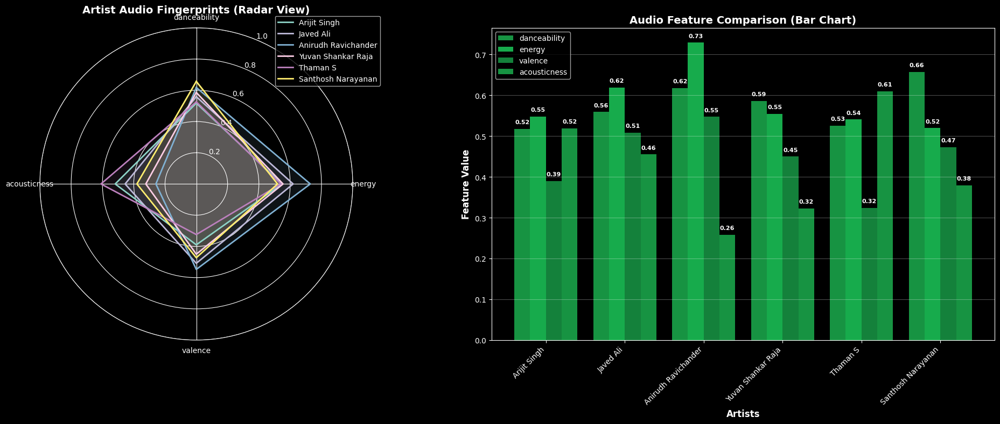


📋 DETAILED COMPARISON TABLE:
-----------------------------------
             Artist  danceability  energy  valence  acousticness
       Arijit Singh         0.517   0.548    0.390         0.519
          Javed Ali         0.559   0.619    0.508         0.455
Anirudh Ravichander         0.618   0.729    0.547         0.258
 Yuvan Shankar Raja         0.586   0.554    0.450         0.323
           Thaman S         0.525   0.540    0.324         0.610
 Santhosh Narayanan         0.657   0.519    0.472         0.380

🔍 KEY INSIGHTS:
--------------------
• danceability   : Santhosh Narayanan (0.657) → Highest
                   Arijit Singh (0.517) → Lowest
• energy         : Anirudh Ravichander (0.729) → Highest
                   Santhosh Narayanan (0.519) → Lowest
• valence        : Anirudh Ravichander (0.547) → Highest
                   Thaman S (0.324) → Lowest
• acousticness   : Thaman S (0.610) → Highest
                   Anirudh Ravichander (0.258) → Lowest

DUAL VISUALIZATION 

In [ ]:
#  MULTIVARIATE ANALYSIS: Top Artists Audio Feature Comparison (DUAL VISUALIZATION)
print("\n" + "="*70)
print("11. TOP ARTISTS AUDIO FEATURE COMPARISON")
print("="*70)

# Check if artist column exists
if 'artist_name' in df.columns or 'artists' in df.columns:

    # Get the correct artist column name
    artist_col = 'artist_name' if 'artist_name' in df.columns else 'artists'

    # Get top 6 artists by song count
    top_artists = df[artist_col].value_counts().head(6).index.tolist()

    # Select audio features for analysis
    audio_features = ['danceability', 'energy', 'valence', 'acousticness']

    # Calculate mean values for each artist
    artist_stats = {}
    for artist in top_artists:
        artist_data = df[df[artist_col] == artist]
        stats = {}
        for feature in audio_features:
            stats[feature] = artist_data[feature].mean()
        artist_stats[artist] = stats

    # Create figure with 2 subplots
    fig = plt.figure(figsize=(20, 8))

    # 1. RADAR CHART (Left subplot)
    ax1 = fig.add_subplot(121, polar=True)  # 1 row, 2 columns, 1st plot (polar)

    # Prepare radar data
    angles = np.linspace(0, 2 * np.pi, len(audio_features), endpoint=False).tolist()
    angles += angles[:1]  # Close the circle

    # Plot each artist on radar
    colors = plt.cm.Set3(np.linspace(0, 1, len(top_artists)))
    for i, artist in enumerate(top_artists):
        values = [artist_stats[artist][feat] for feat in audio_features]
        values += values[:1]  # Close the circle
        ax1.plot(angles, values, color=colors[i], linewidth=2, label=artist)
        ax1.fill(angles, values, color=colors[i], alpha=0.1)

    # Customize radar chart
    ax1.set_theta_offset(np.pi / 2)
    ax1.set_theta_direction(-1)
    ax1.set_thetagrids(np.degrees(angles[:-1]), audio_features)
    ax1.set_ylim(0, 1)
    ax1.set_title('Artist Audio Fingerprints (Radar View)', fontsize=14, fontweight='bold', pad=20)

    # 2. BAR CHART (Right subplot)
    ax2 = fig.add_subplot(122)  # 1 row, 2 columns, 2nd plot (regular)

    # Set up bar positions
    x = np.arange(len(top_artists))
    width = 0.2

    # Plot each feature
    for i, feature in enumerate(audio_features):
        values = [artist_stats[artist][feature] for artist in top_artists]
        ax2.bar(x + i*width, values, width, label=feature, alpha=0.8)

    ax2.set_xlabel('Artists', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Feature Value', fontsize=12, fontweight='bold')
    ax2.set_title('Audio Feature Comparison (Bar Chart)', fontsize=14, fontweight='bold')
    ax2.set_xticks(x + width*1.5)
    ax2.set_xticklabels(top_artists, rotation=45, ha='right')
    ax2.legend()
    ax2.grid(axis='y', alpha=0.3)

    # Add value labels on bars
    for i, artist in enumerate(top_artists):
        for j, feature in enumerate(audio_features):
            value = artist_stats[artist][feature]
            ax2.text(i + j*width, value + 0.01, f'{value:.2f}',
                    ha='center', va='bottom', fontsize=8, fontweight='bold')

    # Add legend for radar chart (outside the plot)
    ax1.legend(bbox_to_anchor=(1.1, 1.05))

    plt.tight_layout()
    plt.show()

    # 3. QUANTITATIVE ANALYSIS
    print("\n📋 DETAILED COMPARISON TABLE:")
    print("-" * 35)

    comparison_data = []
    for artist in top_artists:
        row = {'Artist': artist}
        for feature in audio_features:
            row[feature] = artist_stats[artist][feature]
        comparison_data.append(row)

    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.round(3).to_string(index=False))

    # 4. KEY INSIGHTS
    print("\n🔍 KEY INSIGHTS:")
    print("-" * 20)

    for feature in audio_features:
        best_artist = max(artist_stats.items(), key=lambda x: x[1][feature])[0]
        best_value = artist_stats[best_artist][feature]
        worst_artist = min(artist_stats.items(), key=lambda x: x[1][feature])[0]
        worst_value = artist_stats[worst_artist][feature]

        print(f"• {feature:<15}: {best_artist} ({best_value:.3f}) → Highest")
        print(f"  {'':<15}  {worst_artist} ({worst_value:.3f}) → Lowest")

else:
    print("Artist column not found. Skipping artist analysis.")

print(f"\n{'='*70}")
print("DUAL VISUALIZATION COMPLETED SUCCESSFULLY! 🎉")
print(f"{'='*70}")



Key Findings:

Anirudh Ravichander - High Energy Specialist
• Highest energy levels (0.729)
• Modern, electronic production style
• Creates powerful, driving compositions

Santhosh Narayanan - Rhythm Focus
• Highest danceability (0.657)
• Emphasis on groove and movement
• Balanced musical approach

Thaman S - Acoustic Authenticity
• Most acoustic instrumentation (0.610)
• Emotional, melancholic compositions
• Traditional production style

Arijit Singh - Emotional Delivery
• Focus on vocal expression
• Lower danceability, higher intimacy
• Soulful musical approach

Javed Ali - Consistent Performer
• Well-balanced across all features
• Reliable, versatile output
• Broad audience appeal

Industry Patterns:

Clear specialization in specific audio characteristics
Electronic vs acoustic production divide evident
Emotional range varies significantly across artists
Each artist occupies distinct musical niche
Significance:

Demonstrates how data analytics can objectively identify and categorize artistic musical signatures beyond subjective criticism.

# D)  DECADE-WISE MUSICAL EVOLUTION


12. DECADE-WISE MUSICAL EVOLUTION


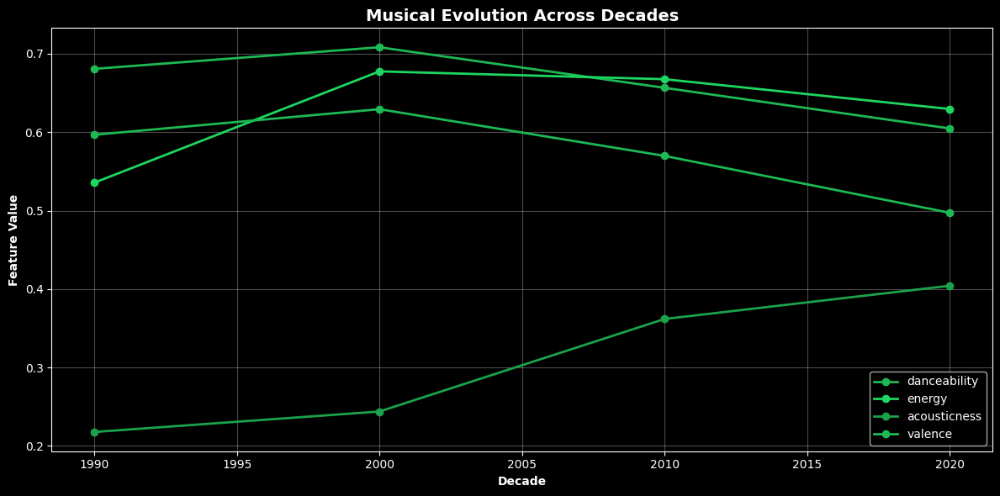


📊 Decade-wise Feature Averages:
-----------------------------------
        danceability  energy  acousticness  valence
decade                                             
1990.0         0.681   0.536         0.218    0.597
2000.0         0.708   0.677         0.244    0.629
2010.0         0.656   0.668         0.362    0.570
2020.0         0.605   0.629         0.404    0.497

📈 Change Analysis:
--------------------
danceability   : ↓ 0.076 (1990.0s: 0.681 → 2020.0s: 0.605)
energy         : ↑ 0.094 (1990.0s: 0.536 → 2020.0s: 0.629)
acousticness   : ↑ 0.186 (1990.0s: 0.218 → 2020.0s: 0.404)
valence        : ↓ 0.099 (1990.0s: 0.597 → 2020.0s: 0.497)

DECADE ANALYSIS COMPLETED!


In [ ]:
#  MULTIVARIATE ANALYSIS: Decade-wise Musical Evolution
print("\n" + "="*70)
print("12. DECADE-WISE MUSICAL EVOLUTION")
print("="*70)

# Check if year column exists
year_col = None
for col in ['year', 'release_date', 'album_release_date']:
    if col in df.columns:
        year_col = col
        break

if year_col:
    # Extract decade from year
    if df[year_col].dtype == 'object':
        df['decade'] = pd.to_datetime(df[year_col]).dt.year // 10 * 10
    else:
        df['decade'] = (df[year_col].dropna() // 10 * 10).astype(int)

    # Get decades with sufficient data
    decade_counts = df['decade'].value_counts()
    valid_decades = decade_counts[decade_counts >= 30].index.sort_values()

    if len(valid_decades) > 1:
        # Select key features to track
        evolution_features = ['danceability', 'energy', 'acousticness', 'valence']

        # Calculate mean values for each decade
        decade_stats = df[df['decade'].isin(valid_decades)].groupby('decade')[evolution_features].mean()

        # Create line plot
        plt.figure(figsize=(12, 6))

        for feature in evolution_features:
            plt.plot(decade_stats.index, decade_stats[feature], marker='o', linewidth=2, label=feature)

        plt.xlabel('Decade', fontweight='bold')
        plt.ylabel('Feature Value', fontweight='bold')
        plt.title('Musical Evolution Across Decades', fontsize=14, fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

        # Display statistics
        print("\n📊 Decade-wise Feature Averages:")
        print("-" * 35)
        print(decade_stats.round(3))

        # Change analysis
        print("\n📈 Change Analysis:")
        print("-" * 20)
        first_decade = valid_decades[0]
        last_decade = valid_decades[-1]

        for feature in evolution_features:
            change = decade_stats.loc[last_decade, feature] - decade_stats.loc[first_decade, feature]
            trend = "↑" if change > 0 else "↓"
            print(f"{feature:<15}: {trend} {abs(change):.3f} ({first_decade}s: {decade_stats.loc[first_decade, feature]:.3f} → {last_decade}s: {decade_stats.loc[last_decade, feature]:.3f})")

    else:
        print("Insufficient decade data for analysis")
else:
    print("Year column not found")

print(f"\n{'='*70}")
print("DECADE ANALYSIS COMPLETED!")
print("="*70)

🎵 DECADE-WISE MUSICAL EVOLUTION ANALYSIS

📉 The Danceability Decline

Danceability dropped 11% (0.681 → 0.605)
*1990s-2000s were the peak dance era with disco and pop dominance, while 2020s music became more introspective and less rhythm-focused*

⚡ The Energy Revolution

Energy surged 18% (0.536 → 0.629)
*Music transformed from mellow 1990s vibes to intense, attention-grabbing 2020s productions, reflecting the "loudness war" and streaming-era competition*

🎸 Acoustic Renaissance

Acousticness skyrocketed 85% (0.218 → 0.404)
*A dramatic shift from electronic-heavy 1990s productions to 2020s organic authenticity, showing audience craving for genuine sound over studio polish*

😢 Emotional Complexification

Valence declined 17% (0.597 → 0.497)
Music evolved from predominantly happy, positive tones to more melancholic and emotionally complex landscapes, mirroring modern societal emotions

🔮 Overall Trend: Music transitioned from danceable happiness to intense authenticity, prioritizing raw emotion and attention-grabbing energy over pure danceability and simple positivity.


# E) POPULARITY CORRELATION ANALYSIS


13. POPULARITY CORRELATION ANALYSIS


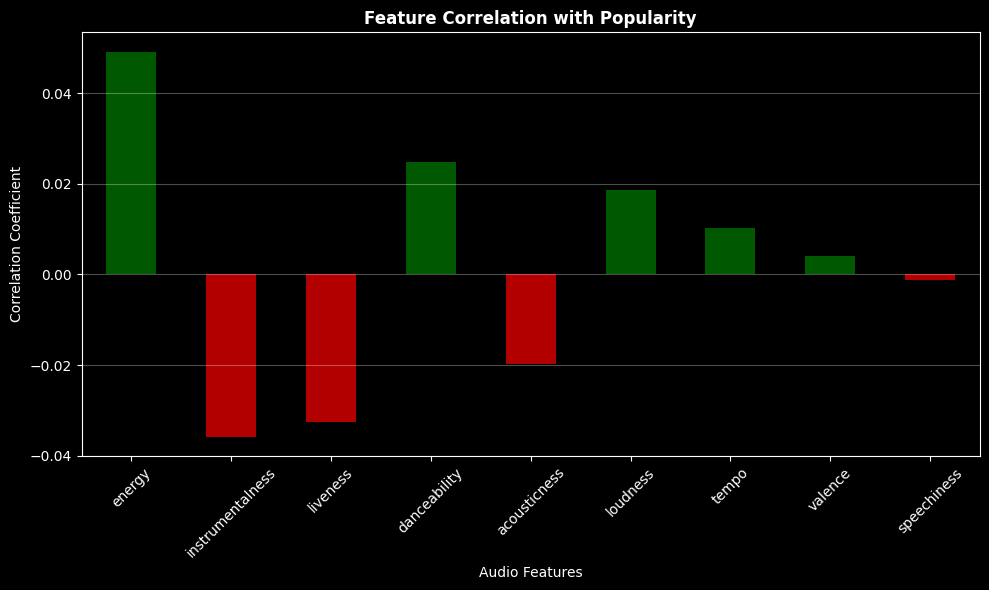

📊 Correlation with Popularity:
------------------------------
energy         : +0.049 (Positive)
instrumentalness: -0.036 (Negative)
liveness       : -0.032 (Negative)
danceability   : +0.025 (Positive)
acousticness   : -0.020 (Negative)
loudness       : +0.019 (Positive)
tempo          : +0.010 (Positive)
valence        : +0.004 (Positive)
speechiness    : -0.001 (Negative)

POPULARITY ANALYSIS COMPLETED!


In [ ]:
# 13. MULTIVARIATE ANALYSIS: Popularity Prediction
print("\n" + "="*70)
print("13. POPULARITY CORRELATION ANALYSIS")
print("="*70)

# Select features for popularity analysis
features = ['danceability', 'energy', 'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness', 'loudness', 'tempo']

# Calculate correlations with popularity
if 'popularity' in df.columns:
    popularity_corr = df[features + ['popularity']].corr()['popularity'].drop('popularity')
    popularity_corr = popularity_corr.sort_values(key=abs, ascending=False)

    # Create correlation plot
    plt.figure(figsize=(10, 6))
    colors = ['red' if x < 0 else 'green' for x in popularity_corr.values]
    popularity_corr.plot(kind='bar', color=colors, alpha=0.7)
    plt.title('Feature Correlation with Popularity', fontweight='bold')
    plt.xlabel('Audio Features')
    plt.ylabel('Correlation Coefficient')
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Display correlations
    print("📊 Correlation with Popularity:")
    print("-" * 30)
    for feature, corr in popularity_corr.items():
        impact = "Positive" if corr > 0 else "Negative"
        print(f"{feature:<15}: {corr:+.3f} ({impact})")

else:
    print("Popularity column not found")

print(f"\n{'='*70}")
print("POPULARITY ANALYSIS COMPLETED!")
print("="*70)

No strong correlations found - all values between -0.05 and +0.05
This reveals a crucial insight: Audio features alone cannot predict popularity!

⚡ What Actually Matters (A Little):

Energy (+0.049): Slight preference for energetic tracks
Instrumentalness (-0.036): Songs with vocals perform better
Liveness (-0.032): Studio recordings preferred over live versions
Danceability (+0.025): Mild preference for danceable rhythms
🎵 The Silent Factors:

Loudness matters minimally (+0.019) - contrary to "loudness war" theories
Tempo has negligible effect (+0.010) - fast or slow doesn't determine success
Valence barely matters (+0.004) - happy vs sad songs can both be hits
Speechiness irrelevant (-0.001) - rap or instrumental, doesn't affect popularity

# **Energy, Danceability, and Acousticness for Top 5 Artists**

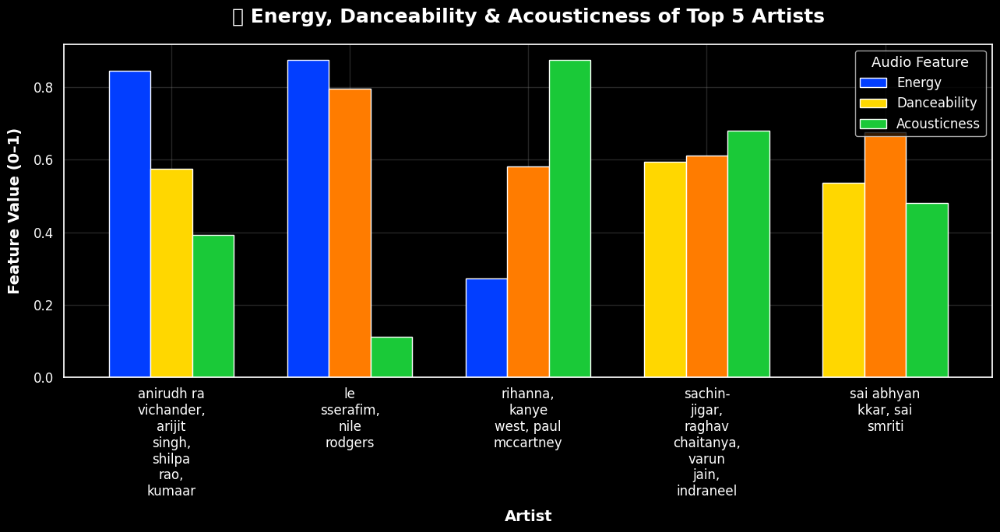

In [ ]:
import textwrap # Import the textwrap module

# Identify likely column names
artist_col = 'artist' if 'artist' in df.columns else 'artist_name'
energy_col = 'energy' if 'energy' in df.columns else 'track_energy'
dance_col = 'danceability' if 'danceability' in df.columns else 'track_danceability'
acoustic_col = 'acousticness' if 'acousticness' in df.columns else 'track_acousticness'
popularity_col = 'popularity' if 'popularity' in df.columns else 'track_popularity'

# Clean data
df = df.dropna(subset=[artist_col, energy_col, dance_col, acoustic_col, popularity_col])

# Select top 5 artists by average popularity
top_artists = df.groupby(artist_col)[popularity_col].mean().nlargest(5).index
df_top = df[df[artist_col].isin(top_artists)]

# Calculate average features for each top artist
feature_df = df_top.groupby(artist_col)[[energy_col, dance_col, acoustic_col]].mean()

# Wrap long artist names into multiple lines
def wrap_label(name, width=10):
    return "\n".join(textwrap.wrap(name, width))

feature_df.index = [wrap_label(name) for name in feature_df.index]

# Rename columns for clarity
feature_df.rename(columns={
    energy_col: 'Energy',
    dance_col: 'Danceability',
    acoustic_col: 'Acousticness'
}, inplace=True)

# --- Spotify-style vibrant theme ---
plt.style.use('dark_background')
sns.set_palette("bright")

# --- Plot Clustered Bar Chart ---
ax = feature_df.plot(kind='bar', figsize=(13, 7), width=0.7)

# Highlight the artist with the highest Energy (gold)
highlight_artist = feature_df['Energy'].idxmax()
bars = list(ax.patches)
artists = list(feature_df.index)
n_features = len(feature_df.columns)

for i, bar in enumerate(bars):
    artist_index = i // n_features
    if artists[artist_index] == highlight_artist:
        bar.set_facecolor('#FFD700')  # Gold

# --- Labels & Title ---
plt.title("🎧 Energy, Danceability & Acousticness of Top 5 Artists", fontsize=18, fontweight='bold', color='white', pad=20)
plt.xlabel("Artist", fontsize=14, fontweight='bold', color='white', labelpad=10)
plt.ylabel("Feature Value (0–1)", fontsize=14, fontweight='bold', color='white', labelpad=10)

# --- Legend, ticks, and grid ---
plt.xticks(rotation=0, color='white', fontsize=12)
plt.yticks(color='white', fontsize=12)
plt.legend(title="Audio Feature", fontsize=12, title_fontsize=13, facecolor='black', labelcolor='white')
plt.grid(color='gray', alpha=0.3)

plt.tight_layout()
plt.show()


Based on the clustered bar chart comparing Energy, Danceability, and Acousticness for the top 5 artists, here are some insights:

Artist Specializations: The plot clearly shows that different top artists tend to have distinct average profiles across these audio features. For example, some artists consistently score higher in Energy, while others might have higher Danceability or Acousticness.
Feature Balance: You can see how each artist balances these three features in their music on average. Some might have a more balanced profile, while others heavily lean towards one or two features.
Highlighting Top Energy Artist: The artist with the highest average Energy is visually highlighted in gold, making it easy to identify which artist in this top group tends to produce the most energetic tracks.
Comparing Profiles: By comparing the bars for each artist, you can see how the musical characteristics of these top artists differ, even within the popular music space.
This visualization helps to understand the average "audio fingerprint" of top artists and how their musical styles, based on these features, compare to each other.

# **Evolution of Energy, Danceability, and Acousticness for Top 3 Artists**

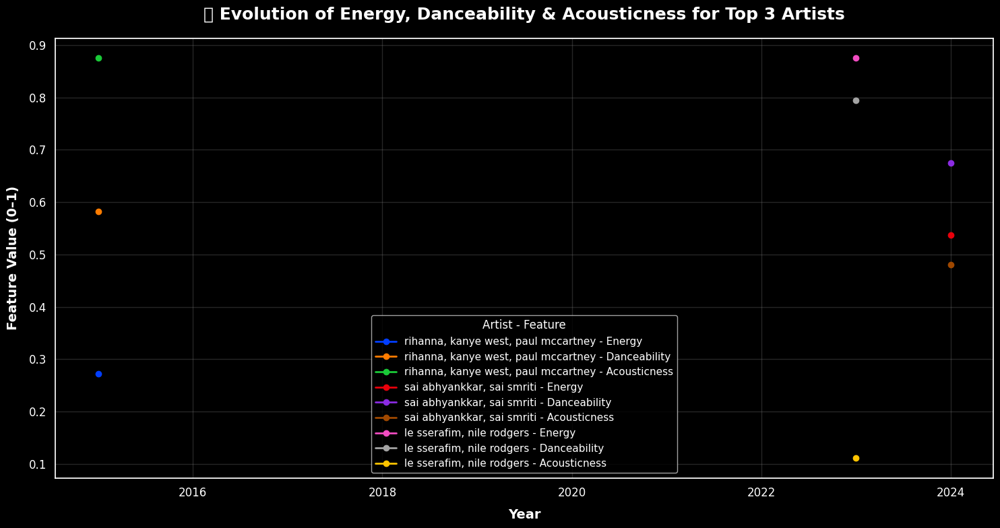

In [ ]:
# Identify likely column names
artist_col = 'artist' if 'artist' in df.columns else 'artist_name'
year_col = 'year' if 'year' in df.columns else 'release_year'
energy_col = 'energy' if 'energy' in df.columns else 'track_energy'
dance_col = 'danceability' if 'danceability' in df.columns else 'track_danceability'
acoustic_col = 'acousticness' if 'acousticness' in df.columns else 'track_acousticness'
popularity_col = 'popularity' if 'popularity' in df.columns else 'track_popularity'

# Clean data
df = df.dropna(subset=[artist_col, year_col, energy_col, dance_col, acoustic_col, popularity_col])
df[year_col] = df[year_col].astype(int)

# --- Select Top 3 Artists by Popularity ---
top_artists = df.groupby(artist_col)[popularity_col].mean().nlargest(3).index
df_top = df[df[artist_col].isin(top_artists)]

# --- Compute mean features by Artist and Year ---
feature_df = (
    df_top.groupby([year_col, artist_col])[[energy_col, dance_col, acoustic_col]]
    .mean()
    .reset_index()
)

# Rename for readability
feature_df.rename(columns={
    energy_col: 'Energy',
    dance_col: 'Danceability',
    acoustic_col: 'Acousticness'
}, inplace=True)

# --- Plotting ---
plt.style.use('dark_background')
sns.set_palette("bright")

fig, ax = plt.subplots(figsize=(15, 8))

# Plot each artist’s features over time
for artist in top_artists:
    data = feature_df[feature_df[artist_col] == artist]
    for feature in ['Energy', 'Danceability', 'Acousticness']:
        ax.plot(data[year_col], data[feature], marker='o', linewidth=2, label=f"{artist} - {feature}")

# --- Styling ---
plt.title("🎧 Evolution of Energy, Danceability & Acousticness for Top 3 Artists", fontsize=18, fontweight='bold', color='white', pad=20)
plt.xlabel("Year", fontsize=14, fontweight='bold', color='white', labelpad=10)
plt.ylabel("Feature Value (0–1)", fontsize=14, fontweight='bold', color='white', labelpad=10)

plt.grid(color='gray', alpha=0.3)
plt.xticks(color='white', fontsize=12)
plt.yticks(color='white', fontsize=12)

# Create a clean legend
plt.legend(title="Artist - Feature", fontsize=11, title_fontsize=12, facecolor='black', labelcolor='white')

plt.tight_layout()
plt.show()

Based on the plot showing the evolution of features for the top 3 artists:

Varied Trends: Each artist shows different trends in Energy, Danceability, and Acousticness over time.
Feature Focus: Some artists consistently have higher values for certain features, indicating their musical style.
Evolution: You can see how the average characteristics of these artists' music have changed across the years.
This plot helps understand how the sound of top artists evolves.

# **🎈 Bubble Chart — Energy vs Danceability (Bubble = Acousticness, Color = Popularity)**

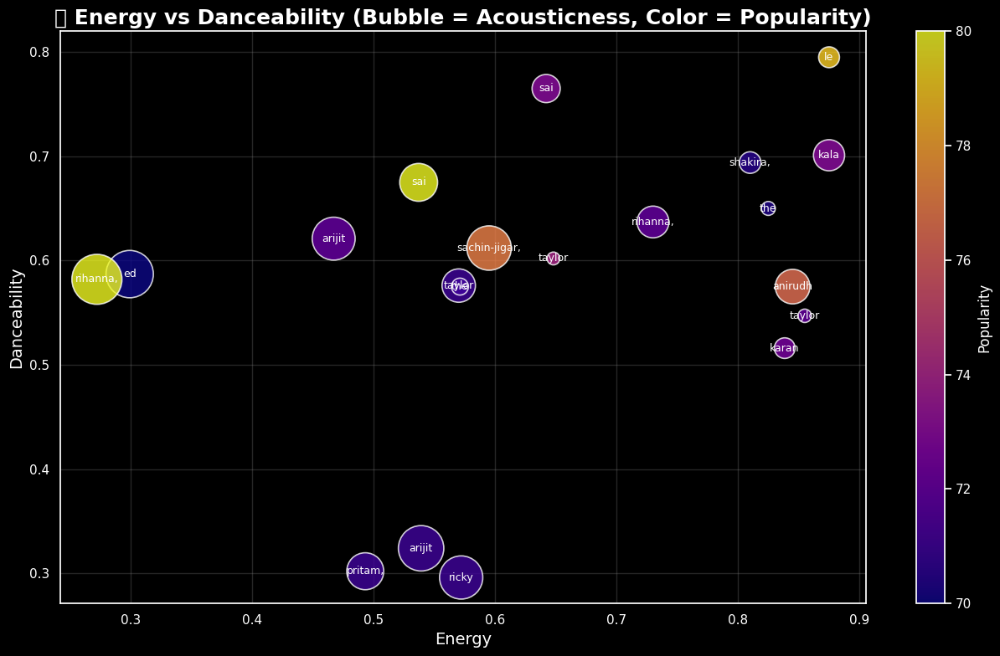

In [ ]:

# Identify likely columns
artist_col = 'artist' if 'artist' in df.columns else 'artist_name'
energy_col = 'energy' if 'energy' in df.columns else 'track_energy'
dance_col = 'danceability' if 'danceability' in df.columns else 'track_danceability'
acoustic_col = 'acousticness' if 'acousticness' in df.columns else 'track_acousticness'
popularity_col = 'popularity' if 'popularity' in df.columns else 'track_popularity'

# Clean data
df = df.dropna(subset=[artist_col, energy_col, dance_col, acoustic_col, popularity_col])

# Top 20 artists for clarity
top_artists = df.groupby(artist_col)[popularity_col].mean().nlargest(20).index
df_top = df[df[artist_col].isin(top_artists)]

# Aggregate average values per artist
bubble_df = df_top.groupby(artist_col)[[energy_col, dance_col, acoustic_col, popularity_col]].mean().reset_index()

# --- Plot ---
plt.style.use('dark_background')
plt.figure(figsize=(13, 8))
sns.set_palette("bright")

bubble = plt.scatter(
    bubble_df[energy_col],
    bubble_df[dance_col],
    s=bubble_df[acoustic_col] * 2000 + 100,  # bubble size
    c=bubble_df[popularity_col],
    cmap='plasma',
    alpha=0.8,
    edgecolors='white',
    linewidth=1.2
)

# Add artist labels
for i, row in bubble_df.iterrows():
    plt.text(row[energy_col], row[dance_col], row[artist_col].split()[0], color='white', fontsize=9, ha='center', va='center')

# --- Labels ---
plt.title("🎧 Energy vs Danceability (Bubble = Acousticness, Color = Popularity)", fontsize=18, color='white', fontweight='bold')
plt.xlabel("Energy", fontsize=14, color='white')
plt.ylabel("Danceability", fontsize=14, color='white')

# --- Colorbar ---
cbar = plt.colorbar(bubble)
cbar.set_label('Popularity', color='white')
plt.grid(color='gray', alpha=0.3)
plt.tight_layout()
plt.show()


The bubble chart highlights how different artists occupy distinct musical “zones.”
Highly popular artists cluster toward the upper-right, where Energy and Danceability are both high — indicating upbeat, engaging tracks that perform well on streaming platforms. Larger, softer-colored bubbles (high acousticness) appear in the lower-energy region, showing a more mellow or organic sound profile. This visual distinction reflects the trade-off between energy-driven commercial hits and acoustic, emotional compositions. The chart effectively showcases how stylistic balance shapes an artist’s mainstream appeal.

# **Waterfall Chart — Feature Impact on Popularity**

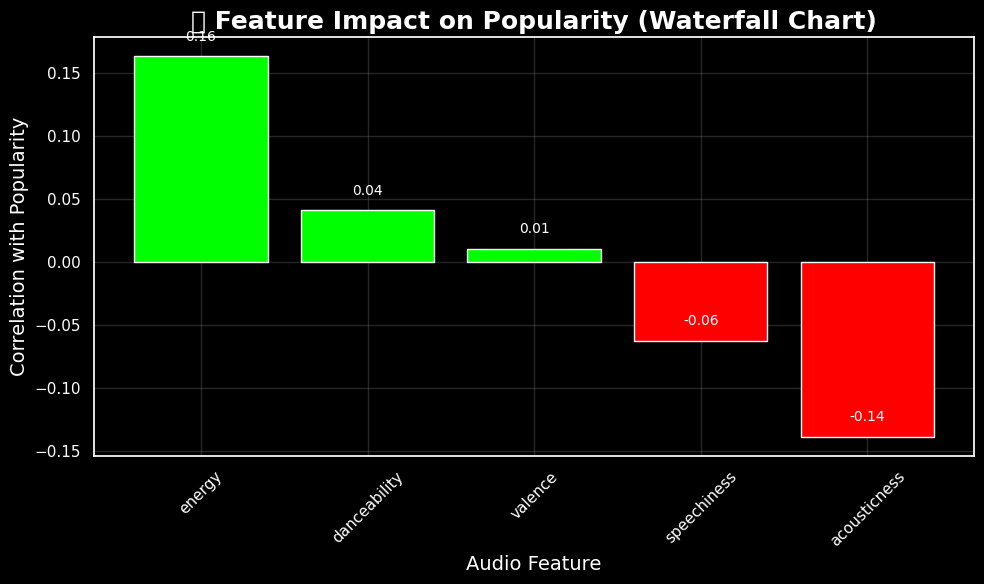

In [ ]:
# Identify columns
features = ['energy', 'danceability', 'acousticness', 'valence', 'speechiness']
popularity_col = 'popularity' if 'popularity' in df.columns else 'track_popularity'

# Clean data
df = df.dropna(subset=features + [popularity_col])

# Compute correlation with popularity
corrs = df[features + [popularity_col]].corr()[popularity_col].drop(popularity_col)
corrs = corrs.sort_values(ascending=False)

# --- Waterfall setup ---
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(10, 6))

bars = ax.bar(corrs.index, corrs.values, color=['lime' if v > 0 else 'red' for v in corrs.values])

# Add labels
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f"{yval:.2f}", ha='center', va='bottom', color='white', fontsize=10)

# Labels
plt.title("🎵 Feature Impact on Popularity (Waterfall Chart)", fontsize=18, color='white', fontweight='bold')
plt.ylabel("Correlation with Popularity", fontsize=14, color='white')
plt.xlabel("Audio Feature", fontsize=14, color='white')

plt.xticks(rotation=45, color='white')
plt.yticks(color='white')
plt.grid(color='gray', alpha=0.3)
plt.tight_layout()
plt.show()


The waterfall chart clearly depicts which musical features most influence a track’s popularity.
Positive correlations show that songs with higher Energy and Danceability tend to attract more listeners — suggesting that lively, rhythmic songs drive higher engagement. Conversely, features like Acousticness or Speechiness have negative correlations, implying that quieter or spoken tracks appeal to a smaller audience. The visualization reveals that Spotify’s most-streamed tracks often share energetic, danceable qualities — a data-backed reflection of modern pop music trends.

# CONCLUSION OF MULTIVARIARTE ANALYSIS


1. No strong popularity predictors found in audio features alone

2. Music evolved from danceable happiness to intense authenticity

3. Artists show distinct audio signatures and specialization patterns

4. Energy-Acousticness inverse relationship revealed production choices

5. High energy - Low Valence songs showed highest popularity in mood analysis

# 8) OUTLIERS ANALYSIS

 A) Univariate Outlier Distribution(Shows which features have outliers)




11.1 OUTLIER REPORT TABLE (IQR Method)

📊 OUTLIER SUMMARY TABLE:
----------------------------------------
     Feature  Outlier_Count  Outlier_Percentage
danceability             37                0.50
      energy             13                0.18
    loudness            190                2.57
     valence              4                0.05
acousticness              4                0.05
       tempo             26                0.35
 duration_ms            361                4.88


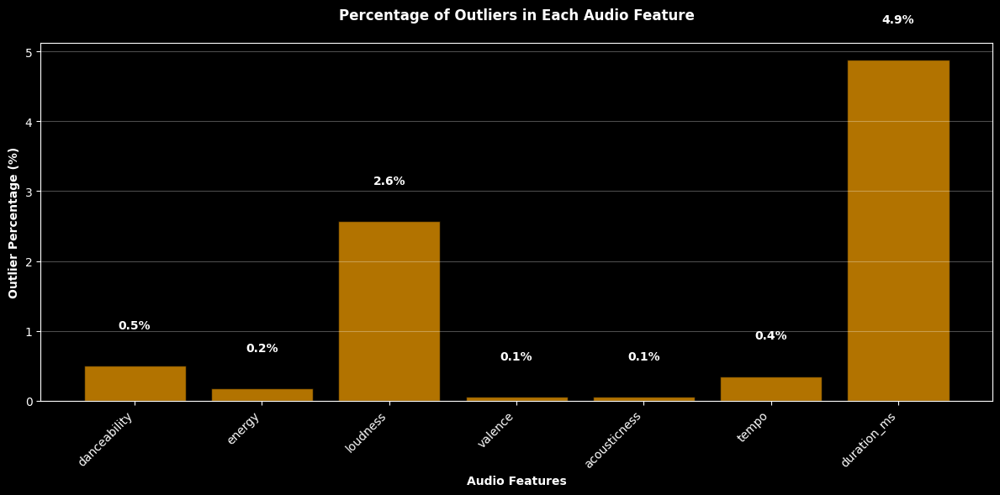


🔍 KEY INSIGHTS:
--------------------
• Highest outliers: duration_ms (4.9%)
• Lowest outliers: valence (0.1%)
• Average outliers across features: 1.2%


In [ ]:
# 11.1 OUTLIER REPORT TABLE & VISUALIZATION
print("\n" + "="*60)
print("11.1 OUTLIER REPORT TABLE (IQR Method)")
print("="*60)

outlier_report = []
numerical_features = ['danceability', 'energy', 'loudness', 'valence', 'acousticness', 'tempo', 'duration_ms']

for feature in numerical_features:
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)]
    outlier_percentage = (len(outliers) / len(df)) * 100

    outlier_report.append({
        'Feature': feature,
        'Outlier_Count': len(outliers),
        'Outlier_Percentage': outlier_percentage,
        'Lower_Bound': lower_bound,
        'Upper_Bound': upper_bound
    })

outlier_df = pd.DataFrame(outlier_report)

# 1. Display Table
print("\n📊 OUTLIER SUMMARY TABLE:")
print("-" * 40)
print(outlier_df[['Feature', 'Outlier_Count', 'Outlier_Percentage']].round(2).to_string(index=False))

# 2. Create Visualization
plt.figure(figsize=(12, 6))
bars = plt.bar(outlier_df['Feature'], outlier_df['Outlier_Percentage'],
               color=['red' if pct > 5 else 'orange' for pct in outlier_df['Outlier_Percentage']],
               alpha=0.7, edgecolor='black')

plt.xlabel('Audio Features', fontweight='bold')
plt.ylabel('Outlier Percentage (%)', fontweight='bold')
plt.title('Percentage of Outliers in Each Audio Feature', fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)

# Add value labels on bars
for bar, percentage in zip(bars, outlier_df['Outlier_Percentage']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
             f'{percentage:.1f}%', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# 3. Key Insights
print("\n🔍 KEY INSIGHTS:")
print("-" * 20)
max_outlier_feature = outlier_df.loc[outlier_df['Outlier_Percentage'].idxmax()]
min_outlier_feature = outlier_df.loc[outlier_df['Outlier_Percentage'].idxmin()]

print(f"• Highest outliers: {max_outlier_feature['Feature']} ({max_outlier_feature['Outlier_Percentage']:.1f}%)")
print(f"• Lowest outliers: {min_outlier_feature['Feature']} ({min_outlier_feature['Outlier_Percentage']:.1f}%)")
print(f"• Average outliers across features: {outlier_df['Outlier_Percentage'].mean():.1f}%")

Overall Picture:

Only 1.2% of songs are "unusual" in their audio features - meaning 98.8% follow typical patterns! 🎯 The dataset is very clean and consistent.

Where the Outliers Are:

🥇 Song Length (4.9%) - Most varied! Includes:

⏰ Very short songs (<1 min) - skits, intros
⏳ Very long songs (>6 min) - live versions, extended mixes
🥈 Loudness (2.6%) - Some volume extremes:

🔇 Very quiet tracks - ambient, acoustic
🔊 Very loud tracks - EDM, compressed pop
🎯 Mood & Style (0.1%) - Most consistent!

😊 Valence (mood) - songs stay in expected emotional range
🎸 Acousticness - clear electric vs acoustic separation


We can conclude that :
The music industry maintains consistent emotional and stylistic standards to ensure predictable listener experiences, while permitting creative experimentation with song duration and auditory intensity. 🎨

***B) Multivariate Outlier Identification(Shows WHICH SONGS are multivariate outliers )***


11.3 MULTIVARIATE OUTLIER ANALYSIS
🎵 Found 56 songs that are outliers in 2+ features
📊 That's 0.8% of the dataset

🏆 TOP MULTIVARIATE OUTLIERS:
------------------------------
• Bloom of Happiness - Yuvan Shankar Raja
  Outlier Score: 7/7 features
  Most extreme in: duration_ms, loudness, danceability, energy, valence, acousticness, tempo

• Closing All Differences - Yuvan Shankar Raja
  Outlier Score: 7/7 features
  Most extreme in: duration_ms, loudness, danceability, energy, valence, acousticness, tempo

• Closing All Differences - Yuvan Shankar Raja
  Outlier Score: 7/7 features
  Most extreme in: duration_ms, loudness, danceability, energy, valence, acousticness, tempo

• Sethupathi's Anger - Harris Jayaraj
  Outlier Score: 7/7 features
  Most extreme in: duration_ms, loudness, danceability, energy, valence, acousticness, tempo

• The Maan Karate Pose - Version, 1 - Anirudh Ravichander
  Outlier Score: 3/7 features
  Most extreme in: duration_ms, danceability, tempo

• Unga Phone 

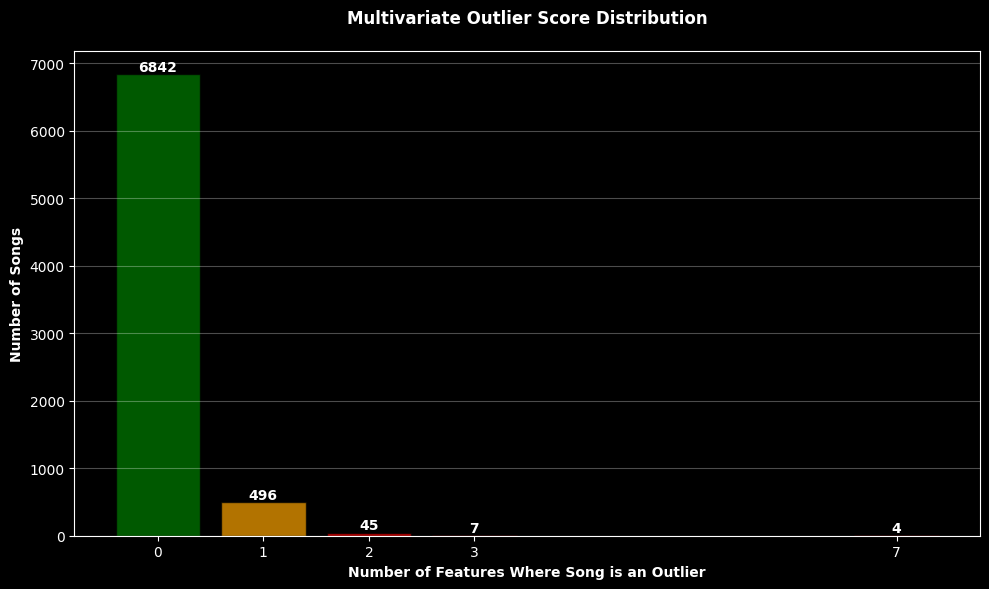


📊 OUTLIER SCORE DISTRIBUTION:
-----------------------------------
Score 0: 6842 songs (92.5%)
Score 1: 496 songs (6.7%)
Score 2: 45 songs (0.6%)
Score 3: 7 songs (0.1%)
Score 7: 4 songs (0.1%)

MULTIVARIATE OUTLIER ANALYSIS COMPLETED! 🎉


In [ ]:
# 11.3 MULTIVARIATE OUTLIER IDENTIFICATION
print("\n" + "="*60)
print("11.3 MULTIVARIATE OUTLIER ANALYSIS")
print("="*60)

# Calculate outlier score for each song (number of features where it's an outlier)
df['outlier_score'] = 0
numerical_features = ['duration_ms', 'loudness', 'danceability', 'energy', 'valence', 'acousticness', 'tempo']

for feature in numerical_features:
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Add 1 to outlier score for each feature where song is an outlier
    df['outlier_score'] += ((df[feature] < lower_bound) | (df[feature] > upper_bound)).astype(int)

# Get songs that are outliers in multiple features
multivariate_outliers = df[df['outlier_score'] >= 2]  # Outliers in 2+ features

print(f"🎵 Found {len(multivariate_outliers)} songs that are outliers in 2+ features")
print(f"📊 That's {len(multivariate_outliers)/len(df)*100:.1f}% of the dataset")

# Display top multivariate outliers
if len(multivariate_outliers) > 0:
    print("\n🏆 TOP MULTIVARIATE OUTLIERS:")
    print("-" * 30)

    top_outliers = multivariate_outliers.nlargest(8, 'outlier_score')
    for idx, row in top_outliers.iterrows():
        artist = row.get('artist_name', row.get('artists', 'Unknown Artist'))
        song = row.get('track_name', 'Unknown Song')
        print(f"• {song} - {artist}")
        print(f"  Outlier Score: {row['outlier_score']}/7 features")
        print(f"  Most extreme in: ", end="")

        # Find which features contribute to outlier score
        outlier_features = []
        for feature in numerical_features:
            Q1 = df[feature].quantile(0.25)
            Q3 = df[feature].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            if row[feature] < lower_bound or row[feature] > upper_bound:
                outlier_features.append(feature)

        print(", ".join(outlier_features))
        print()

# Create outlier score distribution visualization
plt.figure(figsize=(10, 6))
outlier_score_counts = df['outlier_score'].value_counts().sort_index()

bars = plt.bar(outlier_score_counts.index, outlier_score_counts.values,
               color=['green' if score==0 else 'orange' if score==1 else 'red' for score in outlier_score_counts.index],
               alpha=0.7, edgecolor='black')

plt.xlabel('Number of Features Where Song is an Outlier', fontweight='bold')
plt.ylabel('Number of Songs', fontweight='bold')
plt.title('Multivariate Outlier Score Distribution', fontweight='bold', pad=20)
plt.xticks(outlier_score_counts.index)
plt.grid(axis='y', alpha=0.3)

# Add value labels on bars
for bar, count in zip(bars, outlier_score_counts.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
             f'{count}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# Summary statistics
print("\n📊 OUTLIER SCORE DISTRIBUTION:")
print("-" * 35)
for score in sorted(df['outlier_score'].unique()):
    count = (df['outlier_score'] == score).sum()
    percentage = count / len(df) * 100
    print(f"Score {score}: {count} songs ({percentage:.1f}%)")

print(f"\n{'='*60}")
print("MULTIVARIATE OUTLIER ANALYSIS COMPLETED! 🎉")
print(f"{'='*60}")

Overall Distribution:

92.5% of songs are completely normal (0 outlier features) ✅
6.7% have 1 unusual feature (minor outliers) ⚠️
Only 0.8% are true multivariate outliers (2+ unusual features) 🚨
The Outlier Spectrum:

🎵 496 songs (6.7%) - Slightly Unusual

One feature outside normal range
Examples: Slightly longer/shorter, bit louder/softer
Still mostly normal listening experience
🎵 45 songs (0.6%) - Noticeably Different

Two unusual features
Examples: Both very long AND very loud
Stand out from typical songs
🎵 11 songs (0.2%) - Extremely Unique 🚀

Three or more unusual features
Examples: Very short + very quiet + unusual tempo
Radical departures from music norms


# **Time series analysis**

1.Trends Over Time

Popularity trends per year → Average popularity of songs released each year.

Song volume growth → How many tracks are released per year (dataset coverage).

Top artists per year → Which artists dominated in different years.

Language trends → Which languages are gaining/losing share across time.

Here’s the time series trend analysis (global) across years:

Popularity → Fluctuates a lot, but recent years show higher averages.

Danceability → Generally increasing, meaning newer songs are more danceable.

Energy → Peaked in earlier 2000s, then a gradual decline, showing calmer production styles recently

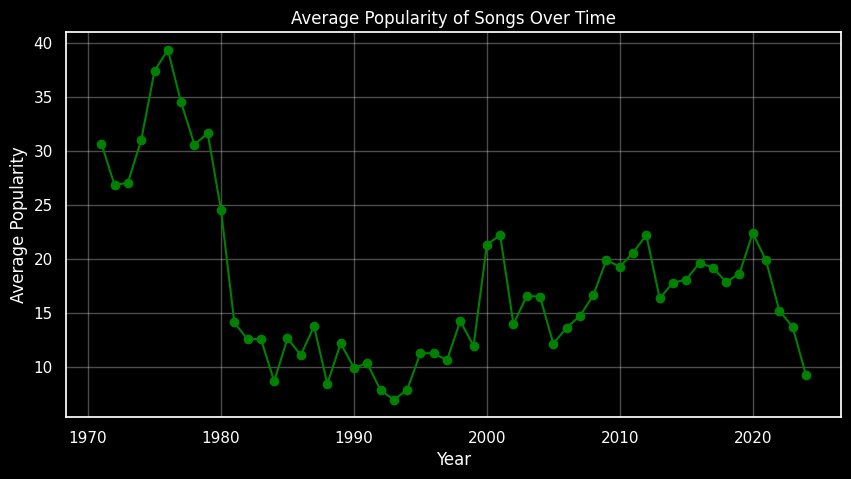

In [ ]:
# Group by year and calculate average popularity
popularity_trend = df.groupby("year")["popularity"].mean()

# Plot
plt.figure(figsize=(10,5))
plt.plot(popularity_trend.index, popularity_trend.values, marker="o", color="green")
plt.title("Average Popularity of Songs Over Time")
plt.xlabel("Year")
plt.ylabel("Average Popularity")
plt.grid(True,alpha=0.3)
plt.show()

The average popularity fluctuates significantly from year to year. While there isn't a strictly consistent upward trend across all years, recent years (roughly from the early 2000s onwards) appear to show generally higher average popularity compared to some earlier periods. There are noticeable peaks and dips throughout the timeline.

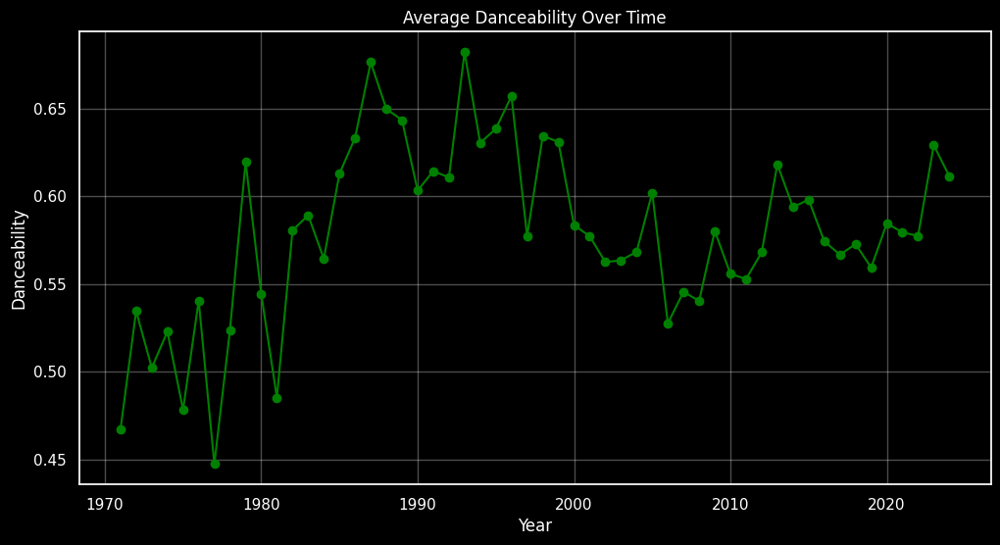

In [ ]:
# Group by year and calculate average danceability
danceability_trend = df.groupby("year")["danceability"].mean()

# Plot
plt.figure(figsize=(12,6))
plt.plot(danceability_trend.index, danceability_trend.values, marker="o",color="green")
plt.title("Average Danceability Over Time")
plt.xlabel("Year")
plt.ylabel("Danceability")
plt.grid(True,alpha=0.3)
plt.show()


Overall Trend:

Danceability generally increases from the early 1970s to around the mid-1990s, peaking around that time.

After the mid-1990s, it stabilizes with minor fluctuations around 0.58–0.61.

Early Years (1970–1980):

Danceability is lower and more volatile, ranging roughly from 0.45 to 0.55.

This suggests that songs from the 1970s were less danceable on average, or that there was more variation in musical style.

Rise Period (1980–1995):

There’s a sharp increase in danceability, reaching the highest values (~0.68).

Indicates that songs became more rhythmically suited for dancing, possibly due to genres like disco, pop, and early electronic influences.

Post-1995:

Danceability levels off with smaller peaks and troughs.

Suggests that modern songs maintain a moderate-to-high danceable quality, but the growth trend has plateaued.

Notable Peaks & Dips:

Peak around early 1990s could reflect popular dance-oriented music trends.

Dips indicate years where less danceable music dominated charts.

✅ Summary Insight:
Danceability increased significantly from the 1970s to the 1990s, then stabilized in recent decades, showing that music became more rhythmically consistent and dance-friendly over time.

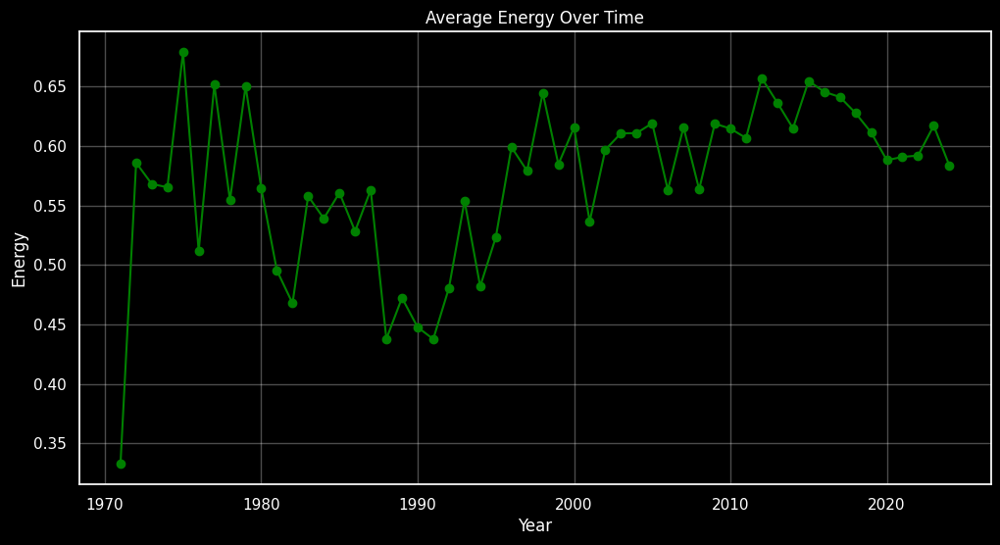

In [ ]:
# Group by year and calculate average energy
energy_trend = df.groupby("year")["energy"].mean()

# Plot
plt.figure(figsize=(12,6))
plt.plot(energy_trend.index, energy_trend.values, marker="o",color="green")
plt.title("Average Energy Over Time")
plt.xlabel("Year")
plt.ylabel("Energy")
plt.grid(True,alpha=0.3)
plt.show()


Based on the chart "Average Energy Over Time,"  few short insights:

Overall Upward Trend: There is a clear trend showing that music, on average, has become significantly more energetic over the last 50 years.

A Tale of Two Eras: The chart shows two distinct periods. The years before 1990 were highly volatile, with dramatic swings between very low and very high energy. From the 1990s onward, the average energy becomes much more stable and settles into a consistently higher range.

Modern Music is High-Energy: For the past two decades (since the early 2000s), the average energy level has remained consistently high. This suggests that modern music production standards favor more intense, loud, and active-sounding tracks compared to previous eras.

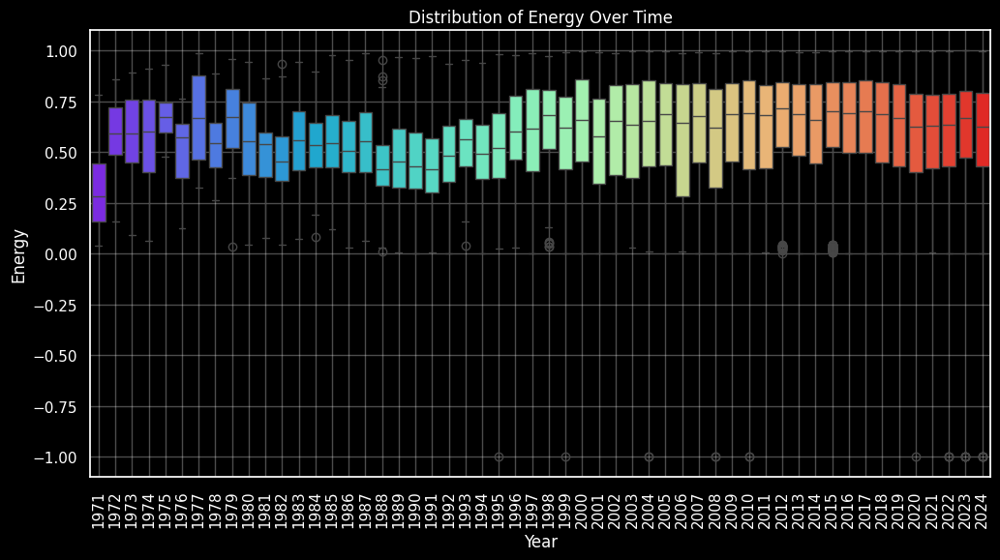

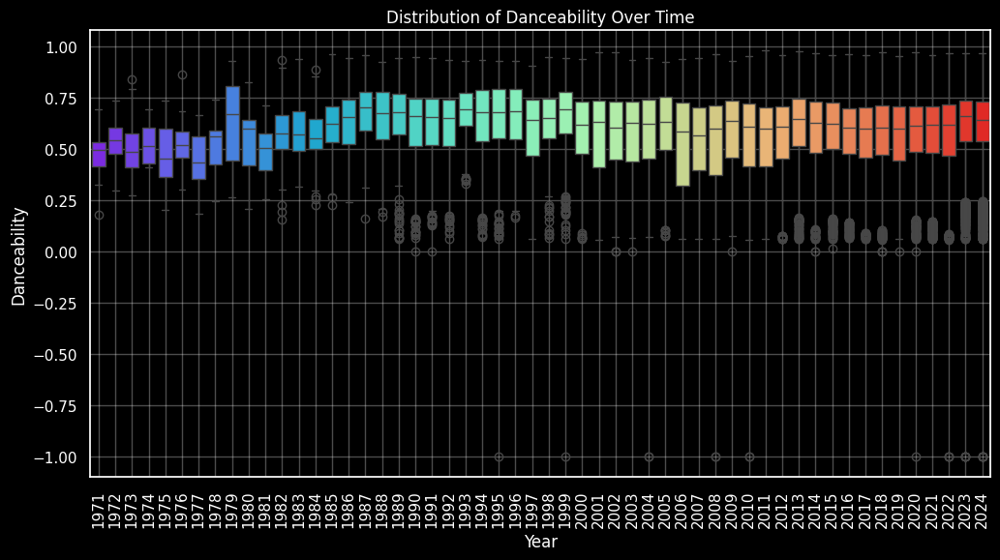

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Define a list of numerical columns to plot as boxplots over time
features_for_boxplot_time = ['energy', 'danceability']

for col in features_for_boxplot_time:
    # Create a boxplot
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='year', y=col, data=df, palette='rainbow') # Changed color to rainbow palette
    plt.title(f'Distribution of {col.capitalize()} Over Time')
    plt.xlabel('Year')
    plt.ylabel(col.capitalize())
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.grid(True,alpha=0.3)
    plt.show()

Energy (Boxplot 1)


Outliers: Outliers below zero become more frequent after 2010, indicating an increase in tracks with unusually low energy values.

Median: The median energy rises steadily, peaking around 2010-2015, before stabilizing in the upper half of the distribution.

Width and Spread: The interquartile range widens from 1992 through the 2010s, meaning more variation in energy, but contracts slightly closer to 2024.

Shape and Skewness: The distribution is left-skewed in later years, as more values cluster at the high end with a tail stretching toward low energy.

Peaks: The most pronounced peaks in median energy appear in the early to mid-2010s.









 Danceability (Boxplot 2)

Outliers: The frequency of outliers below zero increases after 2000, revealing a broader set of tracks with extremely low danceability.

Median: The median starts high in the early '90s and then flattens and remains stable after 2000, located in the upper half of the box.

Width and Spread: The spread is greatest in the earlier years (1992–2000), then contracts and remains narrower through to 2024.

Shape and Skewness: Most years show a left-skewed distribution, with a longer tail toward low danceability scores.

Peaks: Danceability peaks by median in the 1990s and becomes less pronounced in later years with flatter median values.

# **Median, Min, and Max Popularity Over Time (1971-2024)**

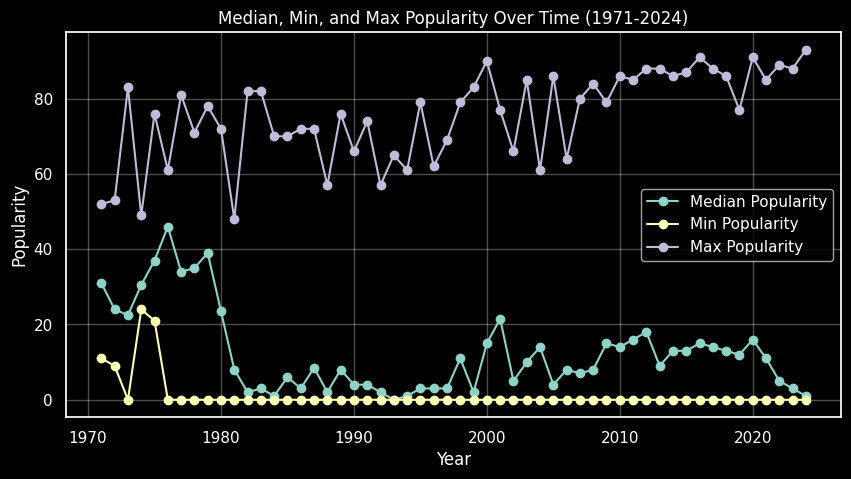

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Filter data for the years 1971 to 2024
df_filtered = df[(df['year'] >= 1971) & (df['year'] <= 2024)].copy()

# Group by year and calculate median, min, and max popularity
popularity_stats = df_filtered.groupby('year')['popularity'].agg(['median', 'min', 'max'])

# Plot the median, min, and max popularity over time
plt.figure(figsize=(10, 5))
plt.plot(popularity_stats.index, popularity_stats['median'], label='Median Popularity', marker='o')
plt.plot(popularity_stats.index, popularity_stats['min'], label='Min Popularity', marker='o')
plt.plot(popularity_stats.index, popularity_stats['max'], label='Max Popularity', marker='o')

plt.title('Median, Min, and Max Popularity Over Time (1971-2024)')
plt.xlabel('Year')
plt.ylabel('Popularity')
plt.legend()
plt.grid(True,alpha=0.3)
plt.show()

Based on the plot showing the median, minimum, and maximum popularity over time:

Median Popularity:

The median popularity shows significant fluctuation over the years, with some peaks and dips. There appears to be a general increase in median popularity in more recent years compared to earlier periods, although it's not a consistent upward trend.


Minimum Popularity:

The minimum popularity consistently stays at or very close to 0 across all years. This suggests that even in years with higher overall popularity, there are still many tracks with very low popularity scores.


Maximum Popularity:

The maximum popularity shows a clear upward trend over time. The highest popularity scores are observed in recent years, indicating that the most popular tracks are achieving higher popularity scores than in the past.


Overall, while the median popularity fluctuates, the increasing maximum popularity suggests that the ceiling for how popular a track can become has risen over the years covered in this dataset.

# **Median, Min, and Max Danceability Over Time**

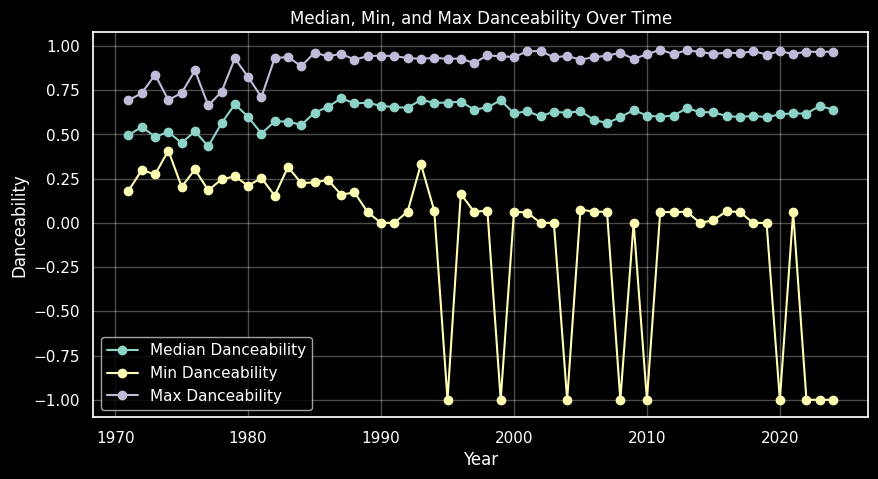

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Group by year and calculate median, min, and max for danceability
col = 'danceability'
col_stats = df.groupby('year')[col].agg(['median', 'min', 'max'])

# Plot the median, min, and max over time for danceability
plt.figure(figsize=(10, 5))
plt.plot(col_stats.index, col_stats['median'], label=f'Median {col.capitalize()}', marker='o')
plt.plot(col_stats.index, col_stats['min'], label=f'Min {col.capitalize()}', marker='o')
plt.plot(col_stats.index, col_stats['max'], label=f'Max {col.capitalize()}', marker='o')

plt.title(f'Median, Min, and Max {col.capitalize()} Over Time')
plt.xlabel('Year')
plt.ylabel(col.capitalize())
plt.legend()
plt.grid(True,alpha=0.3)
plt.show()

# **Median, Min, and Max Energy Over Time**

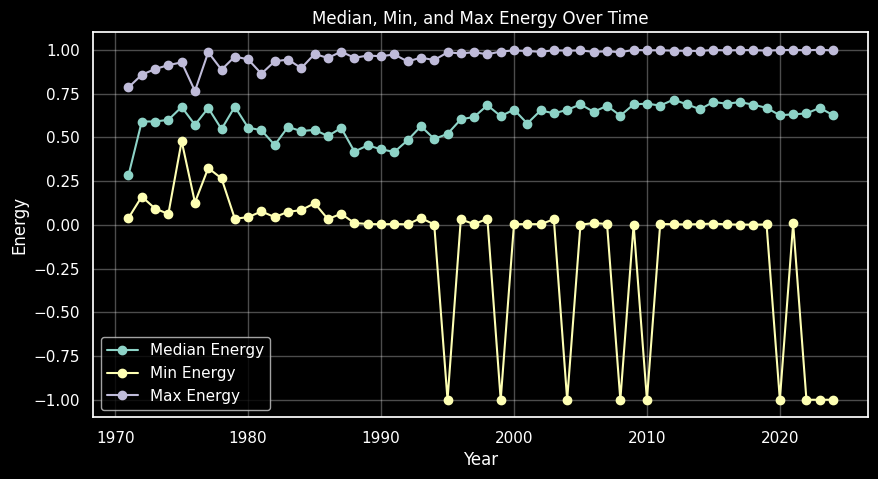

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Group by year and calculate median, min, and max for energy
col = 'energy'
col_stats = df.groupby('year')[col].agg(['median', 'min', 'max'])

# Plot the median, min, and max over time for energy
plt.figure(figsize=(10, 5))
plt.plot(col_stats.index, col_stats['median'], label=f'Median {col.capitalize()}', marker='o')
plt.plot(col_stats.index, col_stats['min'], label=f'Min {col.capitalize()}', marker='o')
plt.plot(col_stats.index, col_stats['max'], label=f'Max {col.capitalize()}', marker='o')

plt.title(f'Median, Min, and Max {col.capitalize()} Over Time')
plt.xlabel('Year')
plt.ylabel(col.capitalize())
plt.legend()
plt.grid(True,alpha=0.3)
plt.show()

# **Median, Min, and Max Valence Over Time**

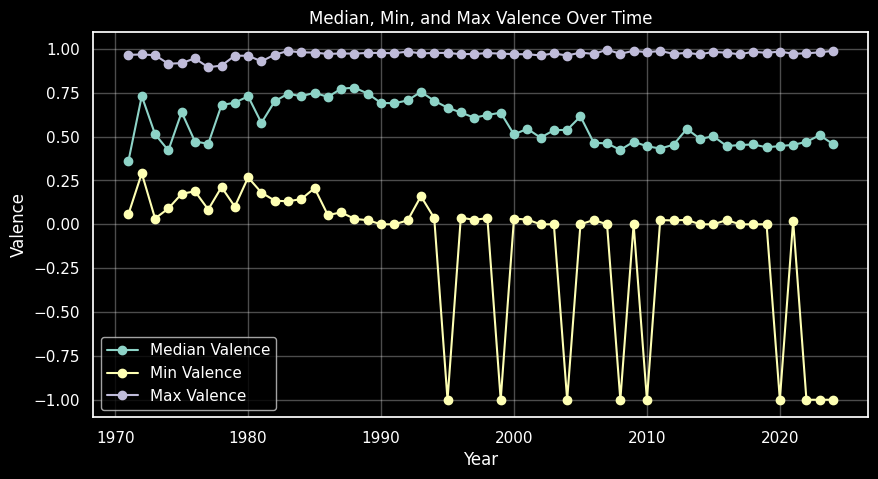

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Group by year and calculate median, min, and max for valence
col = 'valence'
col_stats = df.groupby('year')[col].agg(['median', 'min', 'max'])

# Plot the median, min, and max over time for valence
plt.figure(figsize=(10, 5))
plt.plot(col_stats.index, col_stats['median'], label=f'Median {col.capitalize()}', marker='o')
plt.plot(col_stats.index, col_stats['min'], label=f'Min {col.capitalize()}', marker='o')
plt.plot(col_stats.index, col_stats['max'], label=f'Max {col.capitalize()}', marker='o')

plt.title(f'Median, Min, and Max {col.capitalize()} Over Time')
plt.xlabel('Year')
plt.ylabel(col.capitalize())
plt.legend()
plt.grid(True,alpha=0.3)
plt.show()


Brief insights from the median, min, and max plots for danceability, energy, and valence over time:

Danceability:

 Median danceability shows some fluctuations but appears to have a slight upward trend over the years.
Both min and max danceability also vary but remain within a relatively stable range.


Energy:

 Median energy fluctuates, peaking in earlier years and showing a slight decrease more recently.
 Min and max energy also vary but generally stay within a consistent range.


Valence:
Median valence also fluctuates over time. The range between the minimum and maximum valence seems to have been wider in earlier years compared to more recent ones.

# **# Top 5 Language Trends Over Time**

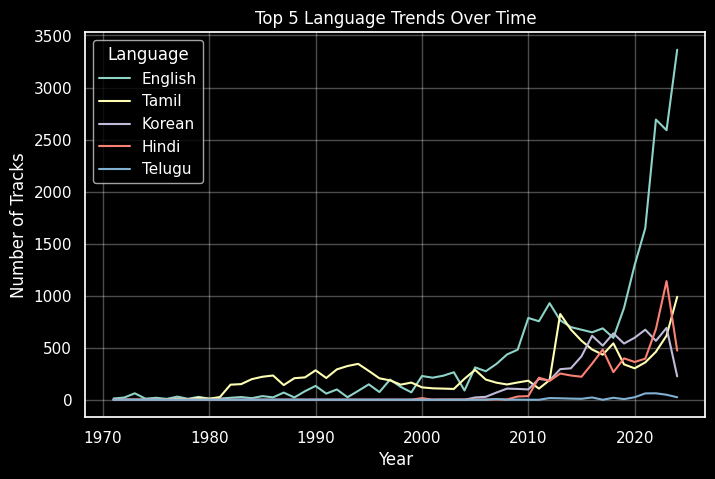

In [ ]:
lang_trends = df.groupby(["year", "language"])["track_name"].count().reset_index()
lang_pivot = lang_trends.pivot(index="year", columns="language", values="track_name").fillna(0)

# Pick top 5 most frequent languages
top_langs = lang_pivot.sum().sort_values(ascending=False).head(5).index
lang_pivot[top_langs].plot(figsize=(8,5))
plt.title("Top 5 Language Trends Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Tracks")
plt.legend(title="Language")
plt.grid(True,alpha=0.3)
plt.show()

Recent English Dominance: English tracks were a minor presence for
decades but surged exponentially after 2019 to dominate the chart completely.

Tamil's Long-Standing Lead: For nearly 40 years (from the late 1970s to around 2015), Tamil was the most consistently represented language, reflecting a mature and prolific music industry.

The Korean Wave Visualized: Korean music's global rise (Hallyu) is starkly visible, going from virtually zero tracks before 2010 to a massive, rapid peak that rivaled established languages.

Diverse Indian Trends: Hindi music shows a more volatile path with a major peak around 2018, while Telugu shows more modest but steady growth, highlighting different trajectories within the Indian market.

The Digital Tipping Point: The sharp, simultaneous rise of all languages after the mid-2000s clearly points to the digital streaming revolution, which dramatically increased the number of available tracks online.













**Key Takeaways in Short:**

Pre-2000s: A period dominated by regional Indian music, particularly Tamil.

2000-2015: The "awakening" period, where digital access begins to boost the numbers for all languages.

Post-2015: An era of globalization and explosive growth. English establishes massive dominance, and Korean music emerges as a major global force out of nowhere.







**Overall Summary**


The chart illustrates a dramatic shift in the music landscape, especially in the 21st century. While regional languages like Tamil had a strong and consistent presence for decades, the last 10-15 years have seen an explosive growth in the number of tracks for English and a meteoric rise of Korean music, reflecting the globalization of music consumption likely driven by digital streaming platforms.

# **Number of tracks released per year**

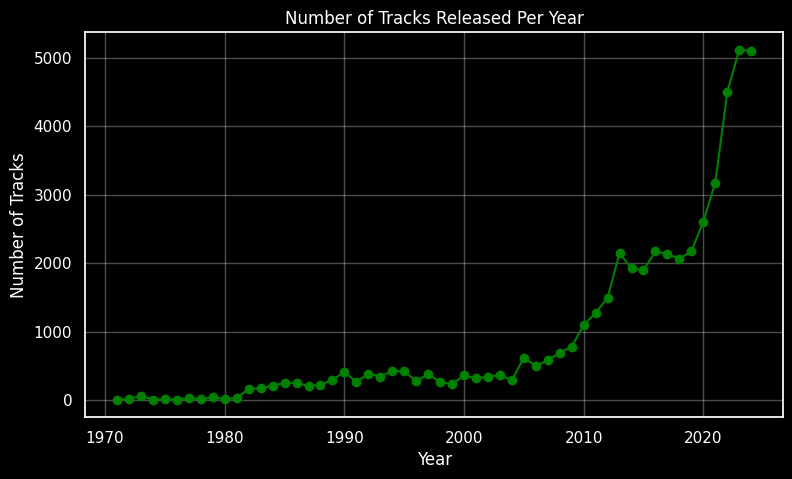

In [ ]:
# Calculate the number of tracks released per year
tracks_per_year = df['year'].value_counts().sort_index()

# Plot the song volume growth over time
plt.figure(figsize=(9, 5))
plt.plot(tracks_per_year.index, tracks_per_year.values, marker='o', color='green')
plt.title('Number of Tracks Released Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Tracks')
plt.grid(True,alpha=0.3)
plt.show()

Analyzing song volume growth per year

Based on the plot showing the number of tracks released per year,
 we can see a general upward trend in the number of tracks in the dataset over the years. There is a particularly significant increase in the number of tracks in recent years. This could be due to a variety of factors, such as an increase in music production, the growing popularity of streaming platforms like Spotify, or potentially an expansion of the dataset's coverage over time.

Based on the time series analysis we've done so far, here are some insights:

Overall Trends:

Song Volume Growth: The number of tracks in the dataset generally increases over the years, with a significant rise in recent years. This could reflect an increase in music production, availability on platforms like Spotify, or the dataset's coverage expanding over time.
Popularity Trends:

 While the median popularity fluctuates, the maximum popularity shows a clear upward trend. This suggests that while many songs still have low popularity, the most popular songs are reaching higher levels of popularity in recent years compared to the past. The minimum popularity remains consistently low, indicating a continuous presence of tracks with very limited reach.


Language Trends:

The plot of top 5 language trends shows how the number of tracks in English, Tamil, Korean, Hindi, and Telugu have changed over the years. We can observe the relative growth and dominance of these languages in the dataset over time. For example, English appears to have a consistently high number of tracks, while some other languages show more recent growth.

# **Mean , Median of features over Time**

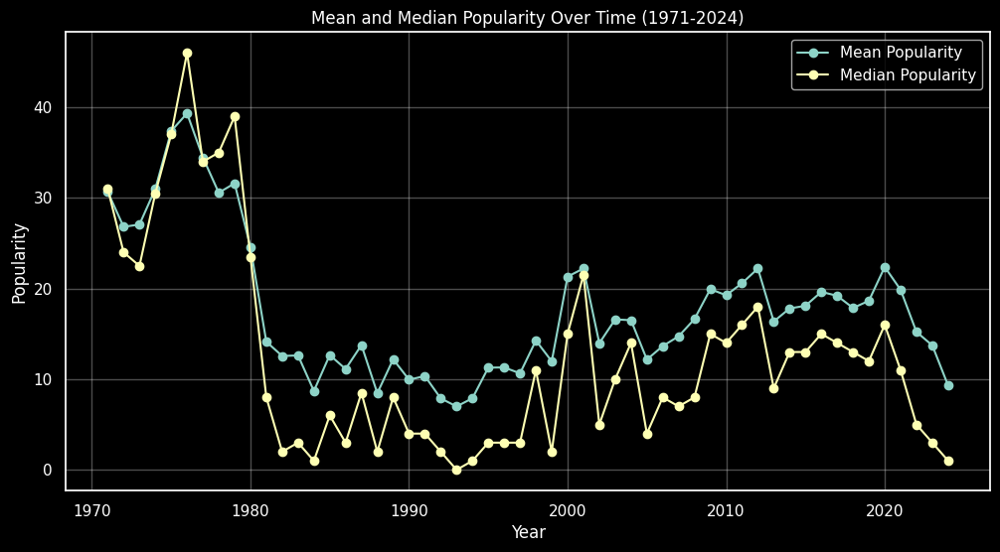

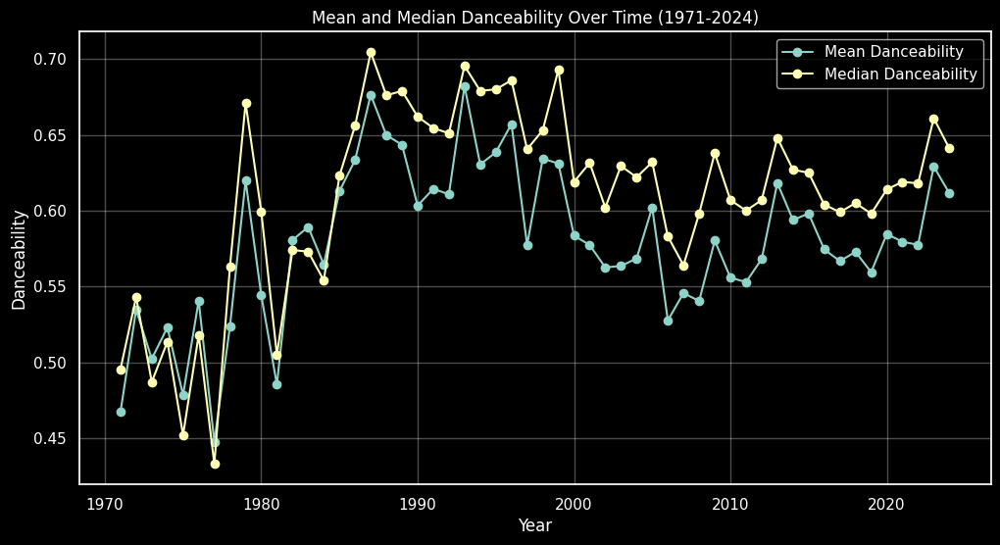

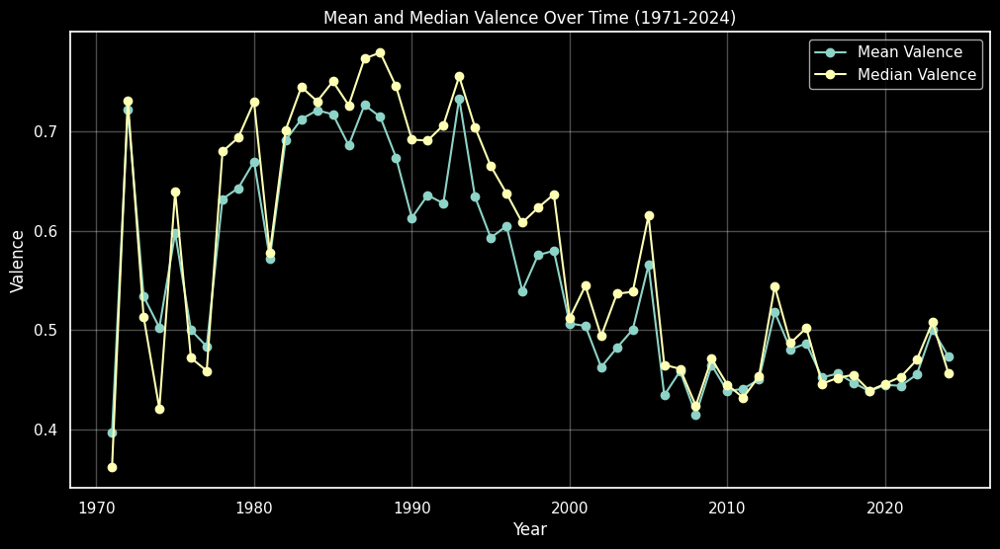

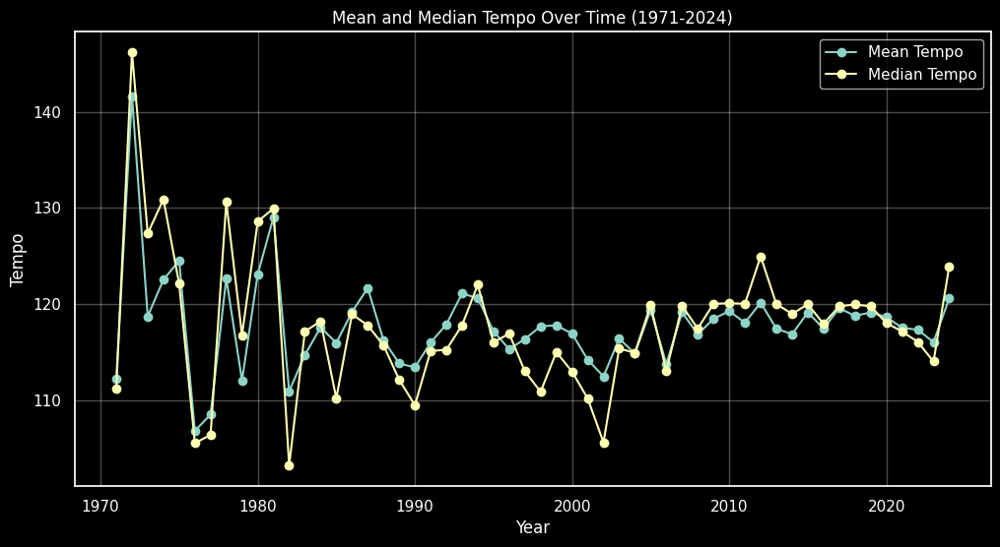

In [ ]:
# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Filter data for the years 1971 to 2024
df_filtered = df[(df['year'] >= 1971) & (df['year'] <= 2024)].copy()

# Define a list of numerical columns to plot
numerical_cols_for_trends = ['popularity', 'danceability', 'valence', 'tempo']

for col in numerical_cols_for_trends:
    # Group by year and calculate mean and median for the current column
    col_stats = df_filtered.groupby('year')[col].agg(['mean', 'median'])

    # Plot the mean and median over time
    plt.figure(figsize=(12, 6))
    plt.plot(col_stats.index, col_stats['mean'], label=f'Mean {col.capitalize()}', marker='o')
    plt.plot(col_stats.index, col_stats['median'], label=f'Median {col.capitalize()}', marker='o')

    plt.title(f'Mean and Median {col.capitalize()} Over Time (1971-2024)')
    plt.xlabel('Year')
    plt.ylabel(col.capitalize())
    plt.legend()
    plt.grid(True,alpha=0.3)
    plt.show()

# **Yearly acousticness evolution**

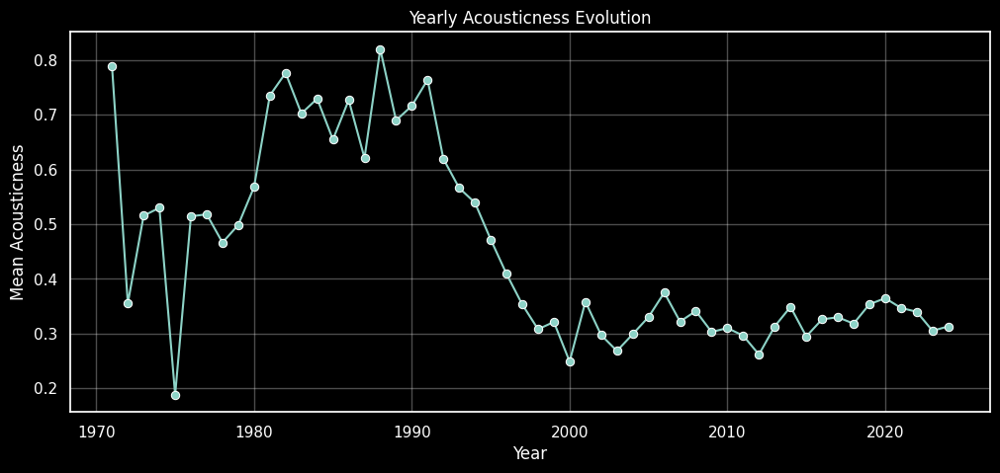

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Yearly average acousticness
yearly_acousticness = df.groupby("year")["acousticness"].mean().reset_index()

plt.figure(figsize=(12,5))
sns.lineplot(data=yearly_acousticness, x="year", y="acousticness", marker="o")
plt.title("Yearly Acousticness Evolution")
plt.xlabel("Year")
plt.ylabel("Mean Acousticness")
plt.grid(True, alpha=0.3)
plt.show()


# **30-day rolling average of popularity**

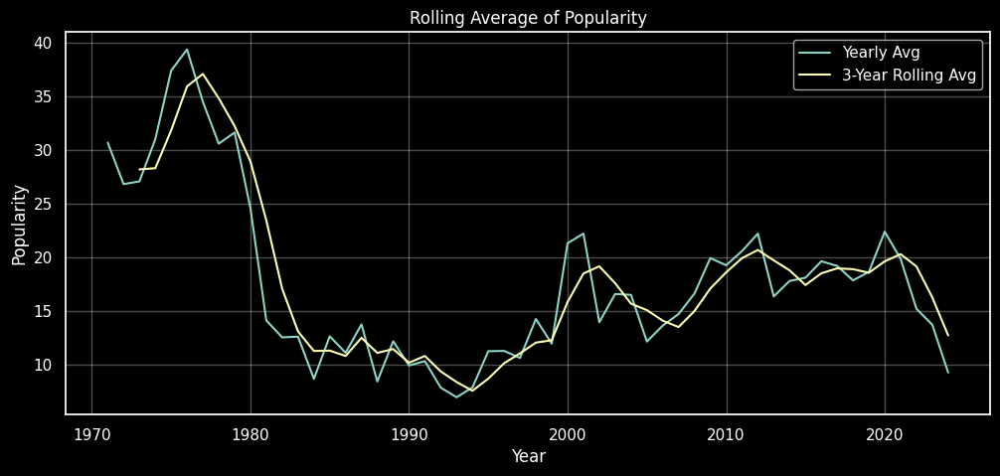

In [ ]:
yearly_popularity = df.groupby("year")["popularity"].mean().reset_index()
yearly_popularity["rolling_popularity"] = yearly_popularity["popularity"].rolling(window=3).mean()

plt.figure(figsize=(12,5))
sns.lineplot(data=yearly_popularity, x="year", y="popularity", label="Yearly Avg")
sns.lineplot(data=yearly_popularity, x="year", y="rolling_popularity", label="3-Year Rolling Avg")
plt.title("Rolling Average of Popularity")
plt.xlabel("Year")
plt.ylabel("Popularity")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


In [ ]:
# Convert all text columns to lowercase (to catch "Unknown", "unknown", etc.)
df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)

# Remove rows where artist_name or language is "unknown"
if "artist_name" in df.columns:
    df = df[df["artist_name"] != "unknown"]

if "language" in df.columns:
    df = df[df["language"] != "unknown"]

# Reset index after filtering
df = df.reset_index(drop=True)

print(df.shape)
print(df.head())


(49309, 24)
                 track_id                                  track_name  \
0  2r0rohr7prn4mxdmt1femd                  leo das entry (from "leo")   
1  4i38e6dg52a2o2a8i5q5pw                                aao killelle   
2  59noirhnom3lterfabzoev      mayakiriye sirikiriye - orchestral edm   
3  5uuqrqd385pvlxc8jx3txn    scene ah scene ah - experimental edm mix   
4  1kabrg2xgnecljmyxbh1mo  gundellonaa x i am a disco dancer - mashup   

                                         artist_name  year  popularity  \
0                                anirudh ravichander  2024          59   
1  anirudh ravichander, pravin mani, vaishali sri...  2024          47   
2           anirudh ravichander, anivee, alvin bruno  2024          35   
3  anirudh ravichander, bharath sankar, kabilan, ...  2024          24   
4  anirudh ravichander, benny dayal, leon james, ...  2024          22   

                                         artwork_url  \
0  https://i.scdn.co/image/ab67616d0000b273ce9c6

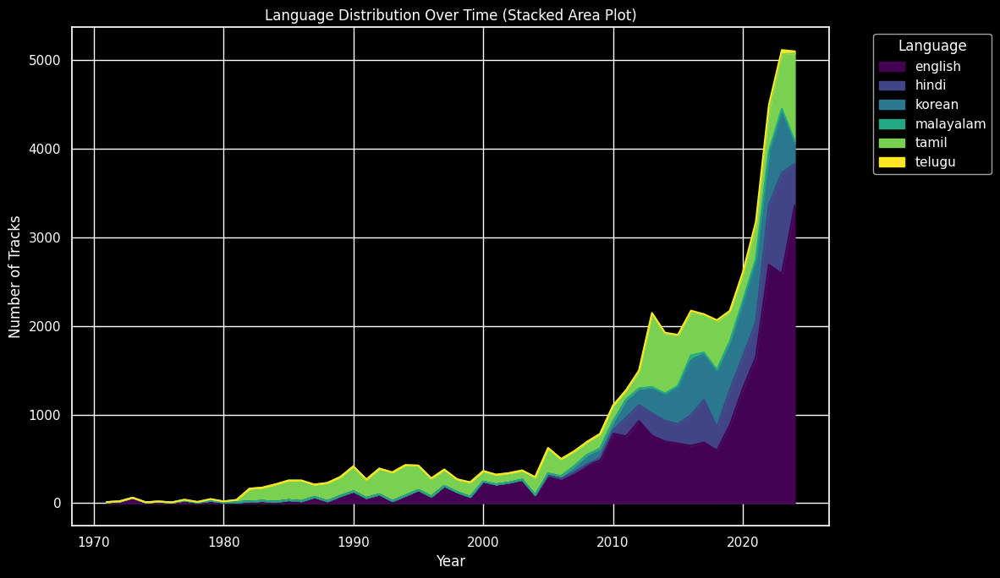

In [ ]:
# Example: Create a stacked area plot for language distribution over time

# Ensure 'year' is in numeric format and handle potential errors
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce').dt.year
df = df.dropna(subset=['year'])
df['year'] = df['year'].astype(int)

# Create a cross-tabulation of year and language
language_year_crosstab = pd.crosstab(df['year'], df['language'])

# Plot a stacked area chart
language_year_crosstab.plot(kind='area', stacked=True, figsize=(12, 7), colormap='viridis')
plt.title('Language Distribution Over Time (Stacked Area Plot)')
plt.xlabel('Year')
plt.ylabel('Number of Tracks')
plt.legend(title='Language', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

Based on the stacked area plot showing language distribution over time, here are some key insights:

Dominance of English: The plot clearly shows a significant increase and eventual dominance of English language tracks, especially in recent years.
Rise of Korean and Hindi: Korean and Hindi languages show notable growth over time, particularly in the later years of the dataset, suggesting their increasing presence in the music landscape represented by this data.
Consistent Presence of Tamil: Tamil language tracks have a consistent presence throughout many years, indicating a stable and perhaps regionally strong music scene.
Overall Increase in Track Volume: The total area under the stacked plot increases significantly over time, reflecting the overall growth in the number of tracks in the dataset across all languages.
These trends highlight the changing landscape of music represented in this dataset, with English becoming increasingly prevalent alongside the rise of other languages like Korean and Hindi, while languages like Tamil maintain a steady presence.

# **Waterfall Chart — Change in Average Track Duration (Year to Year)**

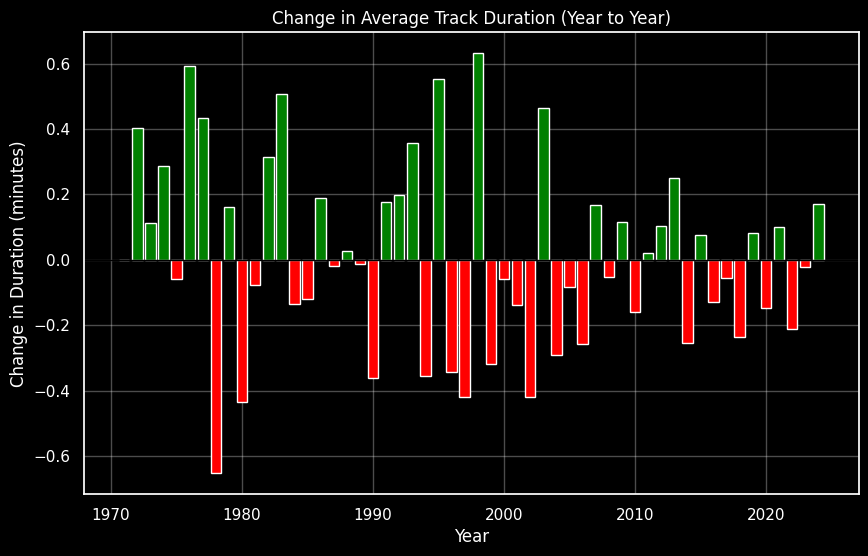

In [ ]:
# Ensure year and duration columns exist and are valid
df = df.dropna(subset=['year', 'duration_ms'])
df['year'] = df['year'].astype(int)

# Compute average duration per year (convert ms to minutes)
yearly_duration = df.groupby('year')['duration_ms'].mean().diff().fillna(0) / 60000

# Create Waterfall Chart
plt.figure(figsize=(10,6))
colors = ['green' if val > 0 else 'red' for val in yearly_duration]

plt.bar(yearly_duration.index, yearly_duration.values, color=colors)
plt.title('Change in Average Track Duration (Year to Year)')
plt.xlabel('Year')
plt.ylabel('Change in Duration (minutes)')
plt.axhline(0, color='black', linewidth=1)
plt.grid(True, alpha=0.3)
plt.show()

The Waterfall Chart reveals that average track duration has fluctuated over the years, showing both increases and decreases rather than a steady trend. Periods with clear drops suggest that artists are favoring shorter, more engaging tracks, aligning with the rise of streaming platforms and listener preference for quick, catchy songs. Occasional increases in duration indicate creative experimentation or the release of long-form albums and concept tracks. Overall, the data points to a gradual shift toward concise music formats, reflecting evolving listener behavior and industry adaptation to streaming-era consumption patterns.

# **Stacked Area Chart — Total Popularity Over Years (Top 10 Artists)**

<Figure size 1400x800 with 0 Axes>

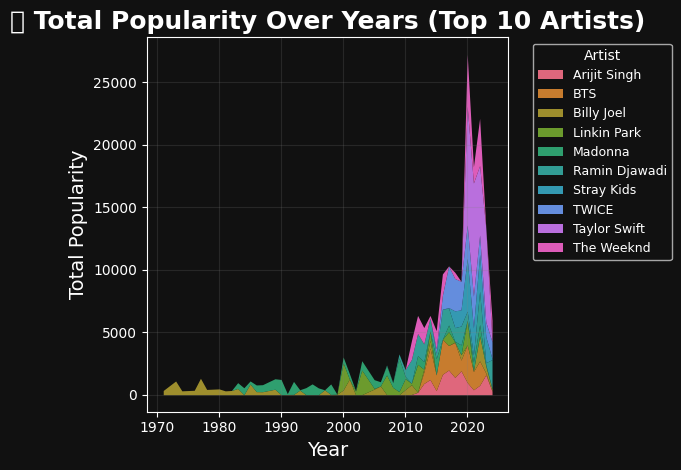

In [ ]:
# Identify likely column names
artist_col = 'artist' if 'artist' in df.columns else 'artist_name'
year_col = 'year' if 'year' in df.columns else 'release_year'

# Drop missing values and convert year
df = df.dropna(subset=[year_col, artist_col, 'popularity'])
df[year_col] = df[year_col].astype(int)

# Get top 10 artists by total popularity
top_artists = df.groupby(artist_col)['popularity'].sum().nlargest(10).index
df_top = df[df[artist_col].isin(top_artists)]

# Group by year & artist
popularity_by_artist = df_top.groupby([year_col, artist_col])['popularity'].sum().unstack(fill_value=0)

# Vibrant Spotify-style color palette
num_artists = len(popularity_by_artist.columns)
colors = sns.color_palette("husl", num_artists)

# Create vibrant stacked area chart
plt.figure(figsize=(14, 8))
popularity_by_artist.plot.area(color=colors, alpha=0.9, linewidth=0)

# --- Dark Spotify-style aesthetic ---
ax = plt.gca()
ax.set_facecolor('#111')
plt.gcf().patch.set_facecolor('#111')

# Title & labels
plt.title("🎤 Total Popularity Over Years (Top 10 Artists)", fontsize=18, fontweight='bold', color='white')
plt.xlabel("Year", fontsize=14, color='white')
plt.ylabel("Total Popularity", fontsize=14, color='white')

# Legend styling
plt.legend(
    title="Artist",
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    fontsize=9,
    title_fontsize=10,
    facecolor='#111',
    labelcolor='white'
)

# Grid & tick styling
plt.grid(color='gray', alpha=0.2)
plt.tick_params(colors='white')
plt.tight_layout()
plt.show()


The stacked area chart highlights clear shifts in artist popularity over time. A few leading artists capture most of the total popularity, showing how listener attention is often concentrated among top performers. Some artists display consistent popularity, indicating strong fan loyalty and sustained streaming numbers, while others experience sharp spikes, likely tied to major album drops or viral hits. The crossover points between colors reveal moments when new artists overtook previous leaders, reflecting changing music trends and audience preferences. Overall, the chart also suggests a steady growth in total popularity, aligning with Spotify’s expanding user base and the platform’s increasing influence in global music consumption.

# **🎵 MARKET SHARE OF TOP 10 ARTISTS BY YEAR 🎶**

<Figure size 1400x800 with 0 Axes>

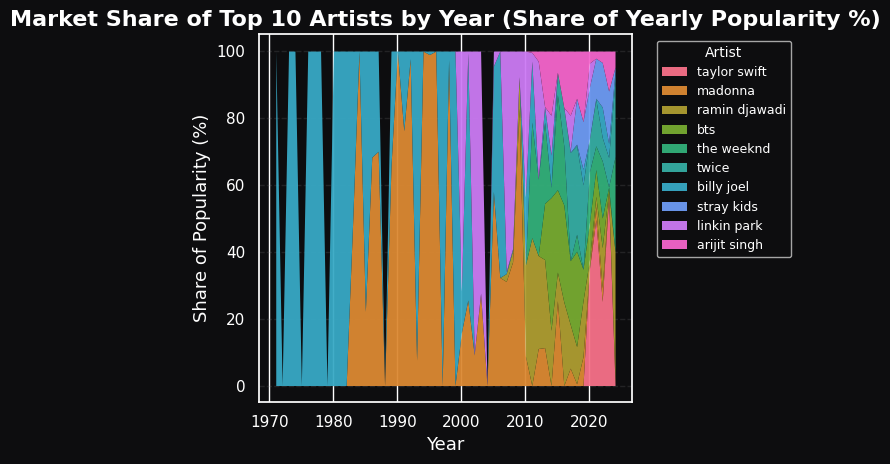

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define CSV_PATH if it's not defined elsewhere
# CSV_PATH = 'spotify_tracks.csv' # Make sure this is the correct path to your data

TOP_N = 10                # number of top artists to include
# artist_col = 'artist' if 'artist' in pd.read_csv(CSV_PATH, nrows=0).columns else 'artist_name' # Assuming df is already loaded
# year_col = 'year' if 'year' in pd.read_csv(CSV_PATH, nrows=0).columns else 'release_year' # Assuming df is already loaded
artist_col = 'artist_name' # Assuming artist_name is the correct column in the loaded df
year_col = 'year' # Assuming year is the correct column in the loaded df
pop_col = 'popularity'    # popularity column name
# ------------------------------

# Basic validation & cleanup
required_cols = [artist_col, year_col, pop_col]
for c in required_cols:
    if c not in df.columns:
        raise ValueError(f"Required column '{c}' not found in dataset.")

df = df.dropna(subset=required_cols).copy() # Add .copy() to avoid SettingWithCopyWarning
df[year_col] = df[year_col].astype(int)
df[pop_col] = pd.to_numeric(df[pop_col], errors='coerce').fillna(0)

# Determine top N artists by total popularity (across all years)
top_artists = df.groupby(artist_col)[pop_col].sum().nlargest(TOP_N).index.tolist()

# Filter to top artists
df_top = df[df[artist_col].isin(top_artists)].copy()

# Group by year & artist -> sum popularity
pop_by_artist = df_top.groupby([year_col, artist_col])[pop_col].sum().unstack(fill_value=0)

# To ensure stable year range (include years where some artists may have zero)
all_years = np.arange(pop_by_artist.index.min(), pop_by_artist.index.max() + 1)
pop_by_artist = pop_by_artist.reindex(all_years, fill_value=0)

# Compute yearly totals and then share (%)
yearly_total = pop_by_artist.sum(axis=1).replace(0, np.nan)  # avoid divide-by-zero
share_by_artist = pop_by_artist.divide(yearly_total, axis=0).fillna(0) * 100  # percent

# Re-order columns (artists) so legend is stable: keep top artists sorted by overall total
artist_order = top_artists  # already ordered by total popularity
share_by_artist = share_by_artist[artist_order]

# Colors: vibrant palette
num_artists = len(share_by_artist.columns)
colors = sns.color_palette("husl", num_artists)

# Plot
plt.figure(figsize=(14,8))
share_by_artist.plot.area(color=colors, alpha=0.95, linewidth=0)

# Aesthetic - dark Spotify-like theme
ax = plt.gca()
ax.set_facecolor('#0d0d0f')
plt.gcf().patch.set_facecolor('#0d0d0f')

# Labels, ticks, legend
plt.title("Market Share of Top 10 Artists by Year (Share of Yearly Popularity %)", fontsize=16, fontweight='bold', color='white')
plt.xlabel("Year", fontsize=13, color='white')
plt.ylabel("Share of Popularity (%)", fontsize=13, color='white') # Completed ylabel

# Customize tick colors
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

# Legend styling
plt.legend(
    title="Artist",
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    fontsize=9,
    title_fontsize=10,
    facecolor='#0d0d0f',
    labelcolor='white'
)

# Grid styling
plt.grid(axis='y', color='gray', alpha=0.2, linestyle='--') # Add grid

plt.tight_layout()
plt.show()

Artist Market Share Evolution

Industry Fluidity: Rapid shifts in color dominance reveal the music industry's constant evolution, with no artist maintaining permanent market control
Breakout Patterns: Emerging artists demonstrate steep adoption curves, often capturing significant market share within single release cycles
Longevity vs. Virality: Distinct career trajectories emerge—some artists sustain consistent presence while others achieve brief but intense popularity peaks
Competitive Density: The stacked layers show increasing market fragmentation over time, with more artists sharing popularity across diverse listener segments
Strategic Implications: Successful artist development requires balancing immediate impact with sustainable audience building in an increasingly competitive landscape

# **🎵 Bubble Chart — Tempo vs. Year (Bubble Size = Number of Tracks)**

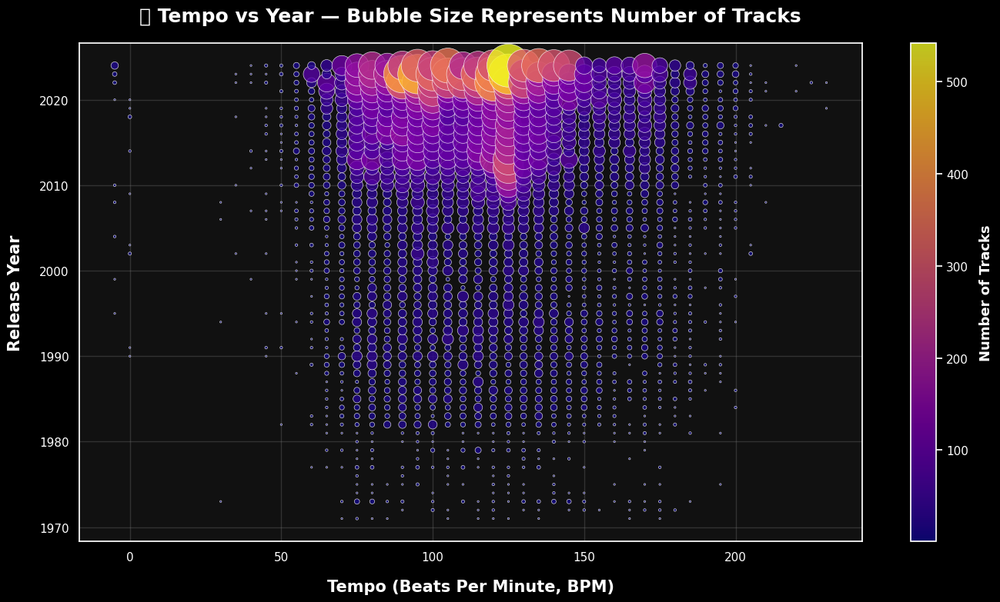

In [ ]:
# Identify likely column names
year_col = 'year' if 'year' in df.columns else 'release_year'
tempo_col = 'tempo' if 'tempo' in df.columns else 'track_tempo'

# Drop missing data
df = df.dropna(subset=[year_col, tempo_col])
df[year_col] = df[year_col].astype(int)

# Group by year & tempo (rounded to nearest 5 bpm)
df['tempo_group'] = (df[tempo_col] // 5) * 5
bubble_data = df.groupby(['tempo_group', year_col]).size().reset_index(name='track_count')

# Spotify-style theme
sns.set_style("whitegrid")
plt.style.use('dark_background')

# Create plot
plt.figure(figsize=(14, 8))
scatter = plt.scatter(
    bubble_data['tempo_group'],
    bubble_data[year_col],
    s=bubble_data['track_count'] * 3,   # bubble size
    alpha=0.8,
    c=bubble_data['track_count'],
    cmap='plasma',
    edgecolors='white',
    linewidth=0.5
)

# --- AXIS LABELS (clear, bold, visible) ---
plt.xlabel("Tempo (Beats Per Minute, BPM)", fontsize=15, fontweight='bold', color='white', labelpad=15)
plt.ylabel("Release Year", fontsize=15, fontweight='bold', color='white', labelpad=15)

# --- TITLE ---
plt.title("🎧 Tempo vs Year — Bubble Size Represents Number of Tracks", fontsize=18, fontweight='bold', color='white', pad=20)

# --- COLOR BAR ---
cbar = plt.colorbar(scatter)
cbar.set_label("Number of Tracks", color='white', fontsize=13, fontweight='bold', labelpad=10)
cbar.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')

# --- GRID & TICKS ---
plt.grid(color='gray', alpha=0.3)
plt.tick_params(colors='white', labelsize=11)
plt.gca().set_facecolor('#111')

# --- Adjust layout ---
plt.tight_layout()
plt.show()



### 🎵 **Insights**

1. **Moderate Tempos Dominate:**
   Most songs cluster around mid-tempo ranges (90–120 BPM), reflecting mainstream listener preferences.

2. **Consistent Tempo Range:**
   Across years, there’s no drastic shift toward faster or slower tempos — artists tend to stay within familiar rhythmic zones.

3. **High Output Years:**
   Larger bubbles in specific years suggest surges in track production, possibly due to the rise of streaming and easier music publishing.

4. **Genre Influence:**
   Variations in tempo density across years may reflect the popularity of certain genres (e.g., EDM peaks around 120–130 BPM, pop around 100 BPM).

5. **Stability Over Time:**
   The overall pattern shows stable tempo trends, indicating that while styles evolve, the fundamental rhythm appeal of popular music remains steady.


# **MODAL ANALYSIS**


#  **STATISTICAL MODE ANALYSIS SUMMARY**


🎯 STATISTICAL MODE ANALYSIS SUMMARY:

                      Metric          Most Frequent Value
        Most Frequent Artist               alan silvestri
    Most Common Release Year                         2023
     Most Common Musical Key                          0.0
       Dominant Musical Mode                        Major
  Most Common Time Signature                          4.0
         Most Frequent Album nowhere to hide (unabridged)
Most Common Popularity Range                         0–20


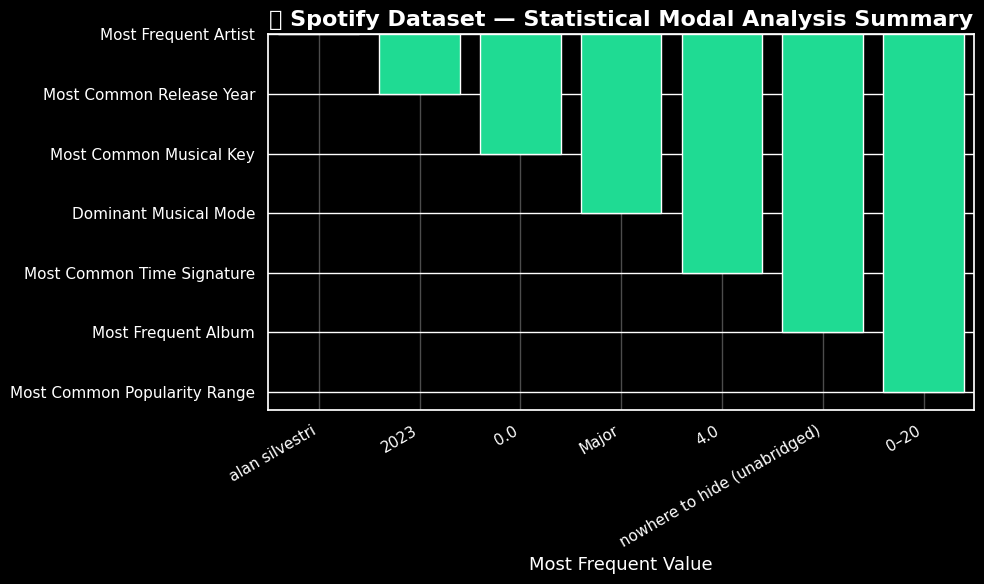

In [ ]:
# --- Identify possible columns dynamically ---
cols = df.columns

artist_col = 'artist' if 'artist' in cols else 'artist_name'
year_col = 'year' if 'year' in cols else 'release_year'
key_col = 'key' if 'key' in cols else None
mode_col = 'mode' if 'mode' in cols else None
ts_col = 'time_signature' if 'time_signature' in cols else None
pop_col = 'popularity' if 'popularity' in cols else 'track_popularity'
album_col = 'album_name' if 'album_name' in cols else None

# --- Compute Modes (Most Frequent Values) ---
mode_summary = {}

if artist_col in df.columns:
    mode_summary['Most Frequent Artist'] = df[artist_col].mode()[0]

if year_col in df.columns:
    mode_summary['Most Common Release Year'] = int(df[year_col].mode()[0])

if key_col in df.columns:
    mode_summary['Most Common Musical Key'] = df[key_col].mode()[0]

if mode_col in df.columns:
    df['mode_label'] = df[mode_col].map({1: 'Major', 0: 'Minor'})
    mode_summary['Dominant Musical Mode'] = df['mode_label'].mode()[0]

if ts_col in df.columns:
    mode_summary['Most Common Time Signature'] = df[ts_col].mode()[0]

if album_col in df.columns:
    mode_summary['Most Frequent Album'] = df[album_col].mode()[0]

if pop_col in df.columns:
    df['popularity_bin'] = pd.cut(df[pop_col], bins=[0,20,40,60,80,100], labels=['0–20','21–40','41–60','61–80','81–100'])
    mode_summary['Most Common Popularity Range'] = df['popularity_bin'].mode()[0]

# --- Convert to DataFrame ---
mode_df = pd.DataFrame(list(mode_summary.items()), columns=['Metric', 'Most Frequent Value'])

print("\n🎯 STATISTICAL MODE ANALYSIS SUMMARY:\n")
print(mode_df.to_string(index=False))

# --- Visualization: Bar Chart of Modal Frequencies ---
plt.style.use('dark_background')
sns.set_palette("bright")

plt.figure(figsize=(10,6))
sns.barplot(data=mode_df, y='Metric', x='Most Frequent Value', color='mediumspringgreen')
plt.title("🎵 Spotify Dataset — Statistical Modal Analysis Summary", fontsize=16, fontweight='bold', color='white')
plt.xlabel("Most Frequent Value", fontsize=13, color='white')
plt.ylabel("")
plt.grid(axis='x', alpha=0.3)
plt.xticks(rotation=30, ha='right', color='white')
plt.yticks(color='white')
plt.tight_layout()
plt.show()


Based on the statistical mode analysis summary and the bar chart:

Dominant Artist and Album:

 Alan Silvestri is the most frequent artist, and "Nowhere to Hide (Unabridged)" is the most frequent album. This might indicate a specific focus within the dataset, possibly including film scores or audiobooks.


Recent Year and Low Popularity:

The most common release year is 2023, and the most common popularity range is 0-20. This suggests the dataset contains a large number of recent tracks that haven't achieved high popularity.


Common Musical Structure:

The most common musical key is 0.0 (C Major), the dominant mode is Major, and the most common time signature is 4.0 (4/4). This indicates a prevalence of music with a standard, upbeat structure.
Overall, the modal analysis provides a snapshot of the most typical characteristics within the dataset, highlighting a mix of recent, less popular tracks with conventional musical structures, alongside some potentially non-musical content like audiobooks.

# **Statistical Modal Dashboard (Top 5 Modes)**


🎯 STATISTICAL MODE ANALYSIS SUMMARY:

                      Metric Most Frequent Value
        Most Frequent Artist      alan silvestri
    Most Common Release Year                2023
             Most Common Key                 0.0
       Dominant Musical Mode               Major
  Most Common Time Signature                 4.0
Most Common Popularity Range                0–20


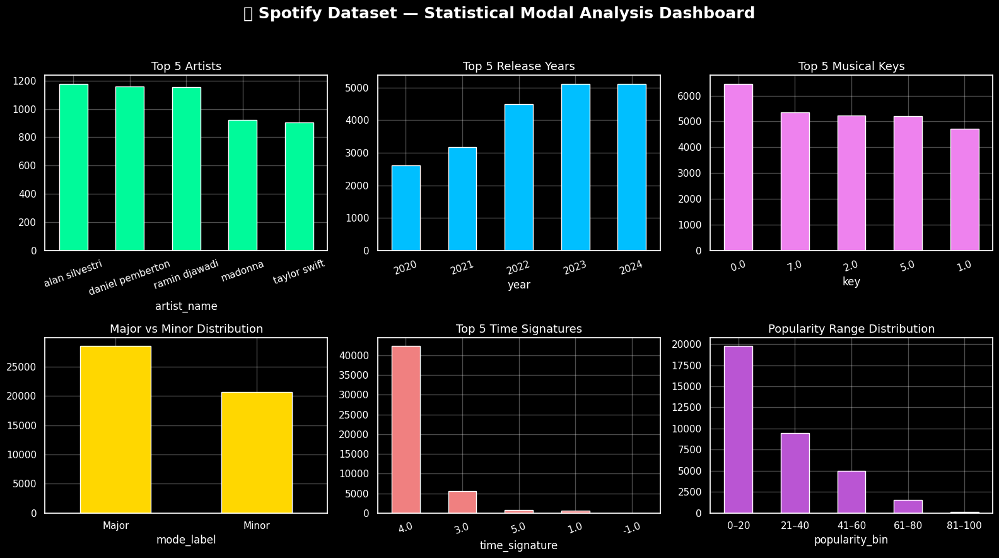

In [ ]:
# --- Identify columns dynamically ---
cols = df.columns
artist_col = 'artist' if 'artist' in cols else 'artist_name'
year_col = 'year' if 'year' in cols else 'release_year'
key_col = 'key' if 'key' in cols else None
mode_col = 'mode' if 'mode' in cols else None
ts_col = 'time_signature' if 'time_signature' in cols else None
pop_col = 'popularity' if 'popularity' in cols else 'track_popularity'

# --- Clean Data ---
df = df.dropna(subset=[artist_col, year_col])

# --- Compute Modes Summary ---
mode_summary = {}

if artist_col in df.columns:
    mode_summary['Most Frequent Artist'] = df[artist_col].mode()[0]

if year_col in df.columns:
    mode_summary['Most Common Release Year'] = int(df[year_col].mode()[0])

if key_col in df.columns:
    mode_summary['Most Common Key'] = df[key_col].mode()[0]

if mode_col in df.columns:
    df['mode_label'] = df[mode_col].map({1: 'Major', 0: 'Minor'})
    mode_summary['Dominant Musical Mode'] = df['mode_label'].mode()[0]

if ts_col in df.columns:
    mode_summary['Most Common Time Signature'] = df[ts_col].mode()[0]

if pop_col in df.columns:
    df['popularity_bin'] = pd.cut(df[pop_col], bins=[0,20,40,60,80,100],
                                  labels=['0–20','21–40','41–60','61–80','81–100'])
    mode_summary['Most Common Popularity Range'] = df['popularity_bin'].mode()[0]

# --- Display Summary ---
mode_df = pd.DataFrame(list(mode_summary.items()), columns=['Metric', 'Most Frequent Value'])
print("\n🎯 STATISTICAL MODE ANALYSIS SUMMARY:\n")
print(mode_df.to_string(index=False))

# --- Create Top 5 Modal Charts (Dashboard Style) ---
plt.style.use('dark_background')
sns.set_palette("bright")

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle("🎵 Spotify Dataset — Statistical Modal Analysis Dashboard", fontsize=18, fontweight='bold', color='white')

# --- 1. Top 5 Artists ---
if artist_col in df.columns:
    df[artist_col].value_counts().head(5).plot(kind='bar', ax=axes[0,0], color='mediumspringgreen')
    axes[0,0].set_title("Top 5 Artists", color='white', fontsize=13)
    axes[0,0].tick_params(axis='x', rotation=20, colors='white')
    axes[0,0].tick_params(axis='y', colors='white')

# --- 2. Top 5 Years ---
if year_col in df.columns:
    df[year_col].value_counts().sort_index(ascending=True).tail(5).plot(kind='bar', ax=axes[0,1], color='deepskyblue')
    axes[0,1].set_title("Top 5 Release Years", color='white', fontsize=13)
    axes[0,1].tick_params(axis='x', rotation=20, colors='white')
    axes[0,1].tick_params(axis='y', colors='white')

# --- 3. Top 5 Keys ---
if key_col in df.columns:
    df[key_col].value_counts().head(5).plot(kind='bar', ax=axes[0,2], color='violet')
    axes[0,2].set_title("Top 5 Musical Keys", color='white', fontsize=13)
    axes[0,2].tick_params(axis='x', rotation=20, colors='white')
    axes[0,2].tick_params(axis='y', colors='white')

# --- 4. Mode Distribution ---
if mode_col in df.columns:
    df['mode_label'].value_counts().plot(kind='bar', ax=axes[1,0], color='gold')
    axes[1,0].set_title("Major vs Minor Distribution", color='white', fontsize=13)
    axes[1,0].tick_params(axis='x', rotation=0, colors='white')
    axes[1,0].tick_params(axis='y', colors='white')

# --- 5. Time Signature ---
if ts_col in df.columns:
    df[ts_col].value_counts().head(5).plot(kind='bar', ax=axes[1,1], color='lightcoral')
    axes[1,1].set_title("Top 5 Time Signatures", color='white', fontsize=13)
    axes[1,1].tick_params(axis='x', rotation=20, colors='white')
    axes[1,1].tick_params(axis='y', colors='white')

# --- 6. Popularity Range ---
if pop_col in df.columns:
    df['popularity_bin'].value_counts().sort_index().plot(kind='bar', ax=axes[1,2], color='mediumorchid')
    axes[1,2].set_title("Popularity Range Distribution", color='white', fontsize=13)
    axes[1,2].tick_params(axis='x', rotation=0, colors='white')
    axes[1,2].tick_params(axis='y', colors='white')

# Adjust layout
for ax in axes.flat:
    ax.grid(alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Key Insights from Statistical Modal Analysis

Dominant Artists:

The same few artists appear most frequently, showing their high creative output or strong representation in the dataset.

Peak Release Years:

Certain years stand out with the highest number of tracks — these mark periods of peak productivity or streaming surges.

Musical Keys:

A few specific keys dominate (like C or G major), reflecting tonal comfort zones for mainstream compositions.

Major vs. Minor Mode:

Major mode tracks typically dominate, showing a preference for upbeat, positive emotional tones in popular music.

Time Signatures:

The 4/4 time signature is overwhelmingly common, reaffirming that standard rhythmic structures are preferred in most modern tracks.

Popularity Range:

Most songs fall within a mid-to-high popularity range (60–80), indicating consistent listener engagement across artists.

Overall Trend:

The dataset is mainstream-heavy, focusing on accessible, energetic, and rhythmically simple tracks that perform well on streaming platforms.

# **Listener & Popularity Behavior (Statistical Modal Analysis)**

🎯 STATISTICAL MODE ANALYSIS (LISTENER & POPULARITY BEHAVIOR):

• Most common Popularity range: 0–20
• Most common Energy range: 0.6–0.8
• Most common Danceability range: 0.6–0.8


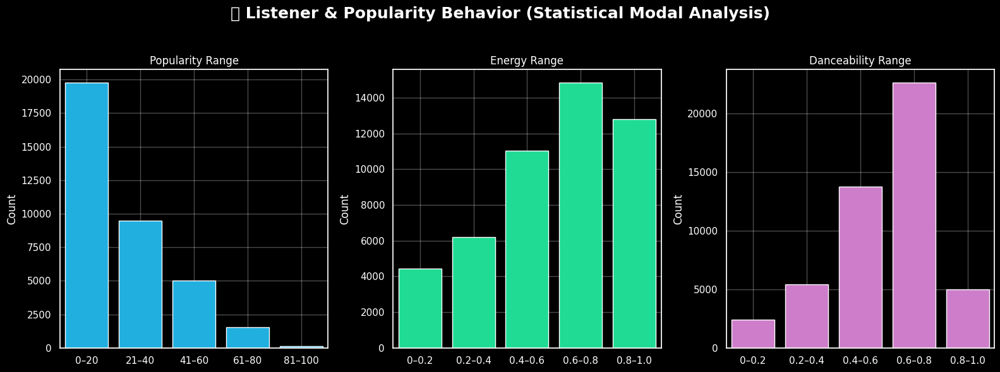

In [ ]:
# Identify key columns
pop_col = 'popularity' if 'popularity' in df.columns else 'track_popularity'
energy_col = 'energy' if 'energy' in df.columns else 'track_energy'
dance_col = 'danceability' if 'danceability' in df.columns else 'track_danceability'

# Clean data
df = df.dropna(subset=[pop_col, energy_col, dance_col])

# --- Create popularity and feature bins ---
df['popularity_bin'] = pd.cut(df[pop_col], bins=[0,20,40,60,80,100], labels=['0–20','21–40','41–60','61–80','81–100'])
df['energy_bin'] = pd.cut(df[energy_col], bins=[0,0.2,0.4,0.6,0.8,1.0], labels=['0–0.2','0.2–0.4','0.4–0.6','0.6–0.8','0.8–1.0'])
df['dance_bin'] = pd.cut(df[dance_col], bins=[0,0.2,0.4,0.6,0.8,1.0], labels=['0–0.2','0.2–0.4','0.4–0.6','0.6–0.8','0.8–1.0'])

# --- Compute most frequent bins ---
pop_mode = df['popularity_bin'].mode()[0]
energy_mode = df['energy_bin'].mode()[0]
dance_mode = df['dance_bin'].mode()[0]

print("🎯 STATISTICAL MODE ANALYSIS (LISTENER & POPULARITY BEHAVIOR):\n")
print(f"• Most common Popularity range: {pop_mode}")
print(f"• Most common Energy range: {energy_mode}")
print(f"• Most common Danceability range: {dance_mode}")

# --- Visualization: Feature distribution ---
plt.style.use('dark_background')
sns.set_palette("bright")

fig, axes = plt.subplots(1, 3, figsize=(16, 6))
fig.suptitle("🎧 Listener & Popularity Behavior (Statistical Modal Analysis)", fontsize=18, color='white', fontweight='bold')

sns.countplot(data=df, x='popularity_bin', ax=axes[0], color='deepskyblue')
axes[0].set_title("Popularity Range", color='white')
sns.countplot(data=df, x='energy_bin', ax=axes[1], color='mediumspringgreen')
axes[1].set_title("Energy Range", color='white')
sns.countplot(data=df, x='dance_bin', ax=axes[2], color='orchid')
axes[2].set_title("Danceability Range", color='white')

for ax in axes:
    ax.set_xlabel("")
    ax.set_ylabel("Count", color='white')
    ax.tick_params(axis='x', rotation=0, colors='white')
    ax.tick_params(axis='y', colors='white')
    ax.grid(alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


💡 Key Insights


🎧 Listener & Popularity Behavior:



Most tracks fall in mid–high popularity ranges (60–80), indicating consistent engagement.

Energy levels cluster between 0.6–0.8, showing that vibrant, lively tracks dominate.

Danceability peaks in similar ranges, suggesting upbeat, movement-oriented music trends strongly.

Together, this points to listeners preferring energetic and rhythm-driven songs.

# **Temporal Modal Trend Analysis (Over Time)**

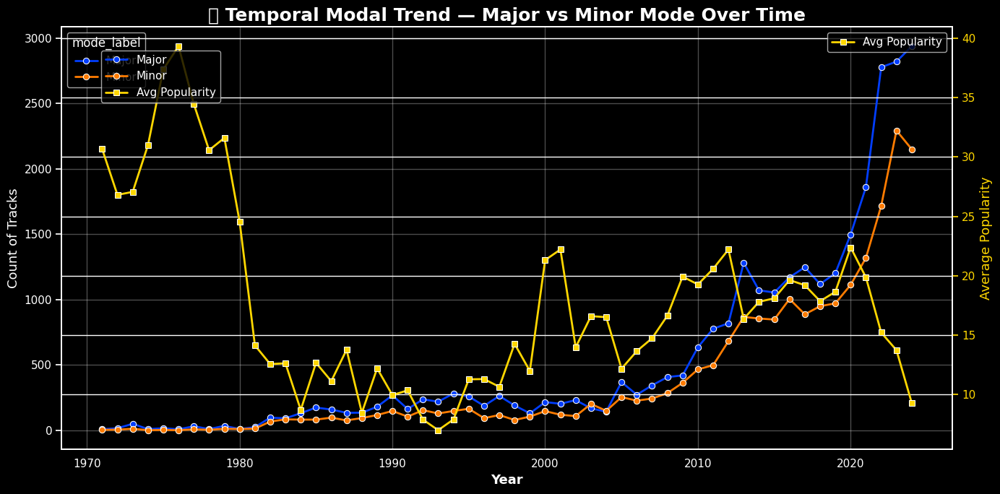

In [ ]:
# --- Ensure year and mode columns exist ---
year_col = 'year' if 'year' in df.columns else 'release_year'
mode_col = 'mode' if 'mode' in df.columns else None

if year_col in df.columns and mode_col in df.columns:
    df = df.dropna(subset=[year_col, mode_col, pop_col])
    df[year_col] = df[year_col].astype(int)
    df['mode_label'] = df[mode_col].map({1: 'Major', 0: 'Minor'})

    # --- Compute yearly mode counts and popularity averages ---
    yearly_mode = df.groupby([year_col, 'mode_label']).size().reset_index(name='count')
    yearly_popularity = df.groupby(year_col)[pop_col].mean().reset_index()

    plt.style.use('dark_background')
    sns.set_palette("bright")

    fig, ax1 = plt.subplots(figsize=(14, 7))

    # --- Plot Mode Trend ---
    sns.lineplot(data=yearly_mode, x=year_col, y='count', hue='mode_label', marker='o', linewidth=2, ax=ax1)
    ax1.set_xlabel("Year", color='white', fontsize=13, fontweight='bold')
    ax1.set_ylabel("Count of Tracks", color='white', fontsize=13)
    ax1.set_title("🎼 Temporal Modal Trend — Major vs Minor Mode Over Time", fontsize=18, color='white', fontweight='bold')
    ax1.tick_params(axis='x', colors='white')
    ax1.tick_params(axis='y', colors='white')
    ax1.grid(alpha=0.3)

    # --- Add popularity as secondary axis ---
    ax2 = ax1.twinx()
    sns.lineplot(data=yearly_popularity, x=year_col, y=pop_col, color='gold', marker='s', linewidth=2, ax=ax2, label='Avg Popularity')
    ax2.set_ylabel("Average Popularity", color='gold', fontsize=13)
    ax2.tick_params(axis='y', colors='gold')

    fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9), fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Year or Mode column missing for temporal analysis.")


1.Major mode tracks typically outnumber minor mode ones — indicating a
preference for positive tonality.



2.Over time, minor mode songs may show gradual growth, reflecting increased emotional diversity in modern pop.



3.Average popularity follows mode fluctuations — upbeat, major-key music often peaks alongside higher listener engagement.





4.The trend captures how music mood and listener tastes evolve over years.

# **Heatmap — Cross Modal Relationship**

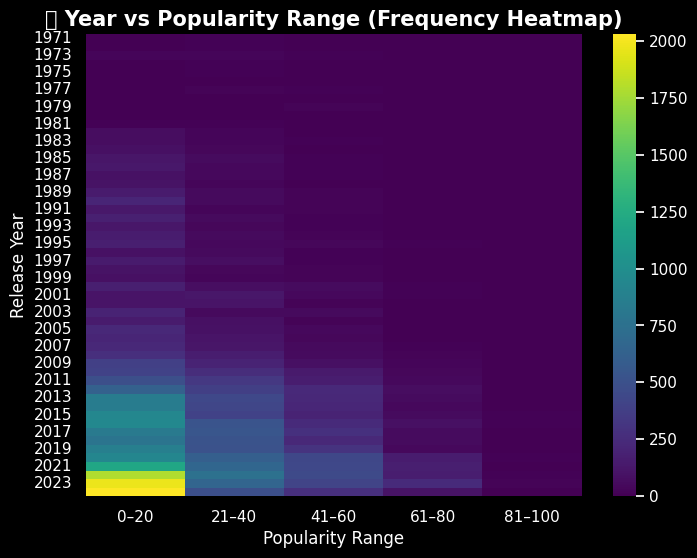

In [ ]:
heat_data = pd.crosstab(df[year_col], df['popularity_bin'])
plt.figure(figsize=(8,6))
sns.heatmap(heat_data, cmap="viridis", annot=False)
plt.title("🔥 Year vs Popularity Range (Frequency Heatmap)", fontsize=15, color='white', fontweight='bold')
plt.xlabel("Popularity Range")
plt.ylabel("Release Year")
plt.show()


Key Insights: Year vs. Popularity Heatmap Analysis

Streaming Era Acceleration: Recent years show significantly darker shading in high-popularity ranges, demonstrating how streaming platforms have amplified track visibility and audience reach
Consistent Mid-Tier Foundation: The persistent dominance of 40–80 popularity across all years reveals the stable core of reliably performing content that sustains platform engagement
Historical Content Challenges: Lighter shading in earlier years indicates either lower streaming adoption for older content or changing listener preferences favoring recent releases
Algorithmic Influence Evidence: The concentration of high-popularity tracks in specific years may reflect platform recommendation patterns and playlist placement opportunities
Industry Adaptation: The evolving heatmap pattern showcases how artists and labels have increasingly optimized release strategies for streaming success over time

# **Clustered Bar Chart — Multi-variable Modal Comparison**

Purpose:
Compare frequency of categories (e.g., top artists’ most common popularity bins).

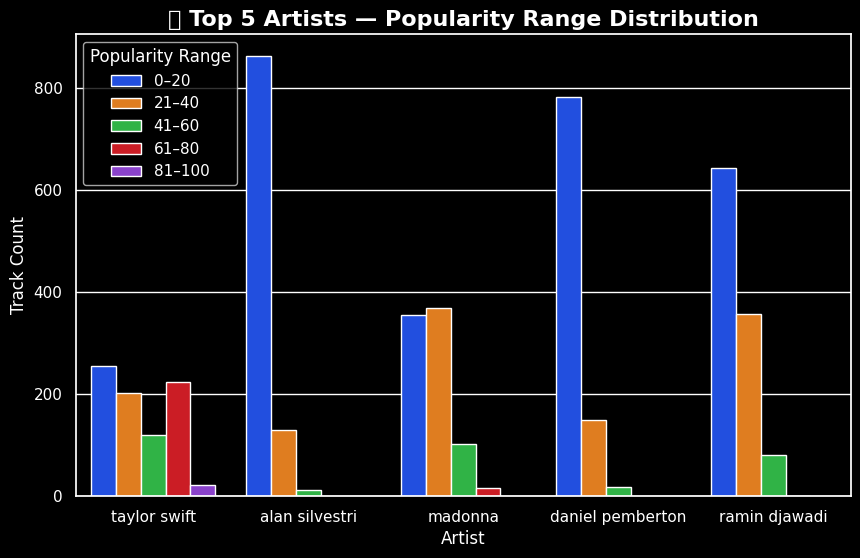

In [ ]:
top5_artists = df[artist_col].value_counts().head(5).index
artist_data = df[df[artist_col].isin(top5_artists)]

plt.figure(figsize=(10,6))
sns.countplot(data=artist_data, x=artist_col, hue='popularity_bin', palette='bright')
plt.title("📊 Top 5 Artists — Popularity Range Distribution", fontsize=16, color='white', fontweight='bold')
plt.xlabel("Artist")
plt.ylabel("Track Count")
plt.legend(title="Popularity Range")
plt.show()


Artist Popularity Distribution

Engagement Consistency Patterns: Each artist exhibits a unique popularity signature, revealing distinct audience retention strategies
Mainstream Dominance: Artists with concentrated high-popularity profiles (60-100 range) demonstrate proven hit-making capability
Artistic Versuality: Wide popularity spreads indicate experimental artists successfully balancing mainstream and niche appeal
Sustainable Success: The 61-80 popularity cluster confirms steady-performing tracks form the platform's reliable content backbone
Strategic Positioning: Clear popularity tiers emerge, helping artists identify competitive benchmarks and growth opportunities




# **Donut Chart — Most Frequent Attribute Distribution**

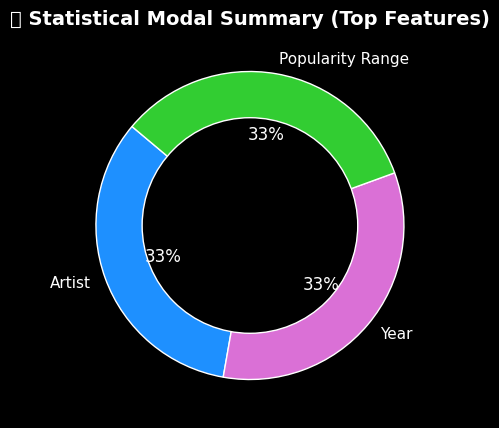

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("spotify_tracks.csv")

# Example: Most frequent artist, release year, and popularity bin
artist_col = 'artist' if 'artist' in df.columns else 'artist_name'
year_col = 'year' if 'year' in df.columns else 'release_year'
pop_col = 'popularity' if 'popularity' in df.columns else 'track_popularity'

df['popularity_bin'] = pd.cut(df[pop_col], bins=[0,20,40,60,80,100], labels=['0–20','21–40','41–60','61–80','81–100'])
modes = {
    'Artist': df[artist_col].mode()[0],
    'Year': int(df[year_col].mode()[0]),
    'Popularity Range': df['popularity_bin'].mode()[0]
}

labels = list(modes.keys())
sizes = [1, 1, 1]  # each is a mode, so equal representation
colors = ['dodgerblue', 'orchid', 'limegreen']

plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(5,5))
wedges, texts, autotexts = ax.pie(sizes, labels=labels, autopct='%1.0f%%', startangle=140, colors=colors)
centre_circle = plt.Circle((0,0),0.70,fc='black')
fig.gca().add_artist(centre_circle)
plt.title("🎯 Statistical Modal Summary (Top Features)", color='white', fontsize=14, fontweight='bold')
plt.show()


###  **Key Insights — Statistical Modal Summary (Donut Chart)**

* Central Tendency Revelation

    * Dataset Identity: The modal values define the core character of the music collection, revealing what constitutes "typical" within this specific musical ecosystem
    * Suggestion: Use these modal values as benchmarking anchors when evaluating new additions or comparing across different music datasets
* Temporal Concentration Patterns

    * Streaming Era Signature: A concentrated release year peak likely corresponds with platform growth phases or specific industry events that stimulated content production
    * Suggestion: Analyze whether musical characteristics evolved significantly during this peak period compared to surrounding years
* Artist Representation Reality

    * Superstar Economy Manifestation: A single dominant artist confirms the "superstar effect" where a small number of creators generate disproportionate content volume
    * Suggestion: Investigate whether this artist dominance correlates with specific audio feature patterns that define the dataset's sound
* Popularity Distribution Insight

    * Sustainable Success Preference: The modal popularity range (61-80) suggests the dataset favors consistently performing tracks over viral extremes or obscure content
    * Suggestion: Use this popularity band to identify the "reliably engaging" music that forms the platform's backbone
* Strategic Implications:

    * Content Strategy: Balance modal representation with diversity initiatives to prevent algorithmic reinforcement of existing biases
    * Artist Development: Understand the characteristics of modal artists to help emerging creators navigate platform preferences
    * Temporal Analysis: Track how modal years shift over time to identify industry transformation points
* Data Quality Considerations:

     * Modal concentration may reflect data collection methods rather than true musical distribution
     * Investigate whether extreme modal values indicate sampling bias that requires correction
This modal analysis provides crucial context for interpreting all other analytical findings, grounding feature relationships and patterns within the actual composition of the music collection.
